# Function Definitions

In [1]:
class LSTM:
    def __init__(self, input_size=340, output_size=101, n_h=100, seq_len=25, epochs=4, alpha=0.004, beta1=0.9,
                 beta2=0.999):
        self.input_size = input_size  # no. of unique characters in the training data
        self.output_size = output_size  # no. of RUL values in the dataset
        self.n_h = n_h  # no. of units in the hidden layer
        self.seq_len = seq_len  # no. of time steps, also size of mini batch
        self.epochs = epochs  # no. of training iterations
        self.alpha = alpha  # learning rate
        self.beta1 = beta1  # 1st momentum parameter
        self.beta2 = beta2  # 2nd momentum parameter

        # ----initialise weighs and biases----- #
        self.params = {}
        std = (1.0 / np.sqrt(self.input_size + self.n_h))  # Xavier initialisation

        # forget gate
        self.params["Wf"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bf"] = np.ones((self.n_h, 1))

        # input gate
        self.params["Wi"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bi"] = np.ones((self.n_h, 1))

        # cell gate
        self.params["Wc"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bc"] = np.ones((self.n_h, 1))

        # output gate
        self.params["Wo"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bo"] = np.ones((self.n_h, 1))

        # output
        self.params["Wv"] = np.random.randn(self.output_size, self.n_h) * (1.0 / np.sqrt(self.output_size))
        self.params["bv"] = np.ones((self.output_size, 1))

        # -----initialise gradients and Adam parameters-----#
        self.grads = {}
        self.adam_params = {}

        for key in self.params:
            self.grads["d" + key] = np.zeros_like(self.params[key])
            self.adam_params["m" + key] = np.zeros_like(self.params[key])
            self.adam_params["v" + key] = np.zeros_like(self.params[key])

        self.smooth_loss = -np.log(1.0 / self.output_size) * self.seq_len

        return

    def init_random_params(self):
        # ----initialise weighs and biases----- #
        self.params = {}
        std = (1.0 / np.sqrt(self.input_size + self.n_h))  # Xavier initialisation

        # forget gate
        self.params["Wf"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bf"] = np.ones((self.n_h, 1))

        # input gate
        self.params["Wi"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bi"] = np.ones((self.n_h, 1))

        # cell gate
        self.params["Wc"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bc"] = np.ones((self.n_h, 1))

        # output gate
        self.params["Wo"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bo"] = np.ones((self.n_h, 1))

        # output
        self.params["Wv"] = np.random.randn(self.output_size, self.n_h) * (1.0 / np.sqrt(self.output_size))
        self.params["bv"] = np.ones((self.output_size, 1))

        return self.params

    # Firstly, we will compute the sigmoid activation used at the forget, input and output gate layers, and the softmax
    # activation used at the output layer. Tanh activation is also needed but numpy.tanh is used instead.

    def sigmoid(self, x):
        """
        Smoothes out values in the range of [0,1]
        """
        return 1 / (1 + np.exp(-x))

    def softmax(self, x):
        """
        Normalizes output into a probability distribution
        """
        e_x = np.exp(x - np.max(x))  # max(x) subtracted for numerical stability
        # e_x = np.exp(x) # Normal softmax activation function
        return e_x / np.sum(e_x, axis=0)

    # Although exploding gradients is not as prevalent for LSTMs as for RNNs, we will limit the gradients to a
    # conservative value using clip_grads. After back propagating through all LSTM cells, we will reset the
    # gradients using reset_grads.

    def clip_grads(self):
        """
        Limits the magnitude of gradients to avoid exploding gradients
        """
        for key in self.grads:
            np.clip(self.grads[key], -5, 5, out=self.grads[key])
        return

    def reset_grads(self):
        """
        Resets gradients to zero before each backpropagation
        """
        for key in self.grads:
            self.grads[key].fill(0)
        return

    # The last utility function that we will create is for updating the weights using Adam. Note that the weights are
    # updated using the accumulated gradients for all time steps.

    def update_params(self, batch_num):
        """
        Updates parameters with Adam
        """
        for key in self.params:
            self.adam_params["m" + key] = self.adam_params["m" + key] * self.beta1 + \
                                          (1 - self.beta1) * self.grads["d" + key]
            self.adam_params["v" + key] = self.adam_params["v" + key] * self.beta2 + \
                                          (1 - self.beta2) * self.grads["d" + key] ** 2

            m_correlated = self.adam_params["m" + key] / (1 - self.beta1 ** batch_num)
            v_correlated = self.adam_params["v" + key] / (1 - self.beta2 ** batch_num)
            self.params[key] -= self.alpha * m_correlated / (np.sqrt(v_correlated) + 1e-8)
        return

    # Forward propagation for a time-step
    # We will propagate forwards through each LSTM cell using forward_step
    # A LSTM cell depends on the previous cell’s state (like Neural Networks). forward_step therefore takes as input
    # the previous hidden state (h_prev) and previous cell state (c_prev). At the beginning of every training iteration,
    # the previous hidden states are initialised to zero (i.e. at t = -1), but for subsequent time-steps, they
    # correspond to the hidden states at t-1, where t is the current time-step.

    def forward_step(self, x, h_prev, c_prev):
        """
        Implements the forward propagation for one time step
        """
        z = np.row_stack((h_prev, x))  # row_stack can also be used

        f = self.sigmoid(np.dot(self.params["Wf"], z) + self.params["bf"])  # [n_h, 1]
        i = self.sigmoid(np.dot(self.params["Wi"], z) + self.params["bi"])  # [n_h, 1]
        c_bar = np.tanh(np.dot(self.params["Wc"], z) + self.params["bc"])  # [n_h, 1]

        c = f * c_prev + i * c_bar  # [n_h, 1]
        o = self.sigmoid(np.dot(self.params["Wo"], z) + self.params["bo"])  # [n_h, 1]
        h = o * np.tanh(c)  # [n_h, 1]

        v = np.dot(self.params["Wv"], h) + self.params["bv"]  # [output_size, n_h] @ [n_h, 1] + [
        # output_size, 1] = [output_size, 1]
        y_hat = self.softmax(v)  # [output_size, 1]
        # print("y_hat from softmax function in forward step", y_hat)

        return y_hat, v, h, o, c, c_bar, i, f, z

    # Backward propagation for a time-step
    # After forward propagation, we will pass the updated values of the last LSTM cell to backward_step and propagate
    # the gradients backwards to the first LSTM cell.
    # dh_next and dc_next are initialised to zero at t = -1, but take the values of dh_prev and dc_prev that
    # backward_step returns in subsequent time steps.
    # In addition, it is worth clarifying:

    # 1. As weights are shared by all time steps, the weight gradients are accumulated.
    # 2. We are adding dh_next to dh, because as Figure 1 shows, h is branched in forward propagation in the softmax
    # output layer and the next LSTM cell, where it is concatenated with x. Therefore, there are two gradients flowing
    # back. This applies to dc as well.
    # 3. There are four gradients flowing towards the input layer from the gates, therefore dz is the summation of
    # those gradients.

    def backward_step(self, y, y_hat, dh_next, dc_next, c_prev, z, f, i, c_bar, c, o, h):
        dv = np.copy(y_hat)
        dv[y] -= 1  # dJ/dv = y_hat - y

        # print("-------------------------------------------------------------------------------------------------------")
        # print("y in back propagation:", y)
        # print("dv[y] from backward_step", dv)

        # Output bach propagation
        self.grads["dWv"] += np.dot(dv, h.T)
        self.grads["dbv"] += dv

        # Hidden state back propagation
        dh = np.dot(self.params["Wv"].T, dv)
        dh += dh_next

        do = dh * np.tanh(c)
        da_o = do * o * (1 - o)
        self.grads["dWo"] += np.dot(da_o, z.T)
        self.grads["dbo"] += da_o

        # Cell states back propagation
        dc = dh * o * (1 - np.tanh(c) ** 2)
        dc += dc_next

        dc_bar = dc * i
        da_c = dc_bar * (1 - c_bar ** 2)
        self.grads["dWc"] += np.dot(da_c, z.T)
        self.grads["dbc"] += da_c

        # Input gate back propagation
        di = dc * c_bar
        da_i = di * i * (1 - i)
        self.grads["dWi"] += np.dot(da_i, z.T)
        self.grads["dbi"] += da_i

        # Forget gate back propagation
        df = dc * c_prev
        da_f = df * f * (1 - f)
        self.grads["dWf"] += np.dot(da_f, z.T)
        self.grads["dbf"] += da_f

        # Input back propagation
        dz = (np.dot(self.params["Wf"].T, da_f)\
             + np.dot(self.params["Wi"].T, da_i)\
             + np.dot(self.params["Wo"].T, da_o) \
             + np.dot(self.params["Wc"].T, da_c))

        dh_prev = dz[:self.n_h, :]
        dc_prev = f * dc

        return dh_prev, dc_prev

    # Forward and backward propagation for all time-steps
    # The forward and backward propagation steps will be executed within the forward_backward function. Here, we iterate
    # over all time steps and store the results for each time step in dictionaries. In the forward propagation loop,
    # we also accumulate the cross entropy loss.

    # forward_backward exports the cross entropy loss of the training batch, in addition to the hidden and cell states
    # of the last layer which are fed to the first LSTM cell as hprev and prev of the next training batch.

    def forward_backward(self, x_batch, y_batch, h_prev, c_prev):
        x, z = {}, {}
        f, i, c_bar, c, o = {}, {}, {}, {}, {}
        y_hat, v, h = {}, {}, {}

        # Values at t= - 1
        h[-1] = h_prev
        c[-1] = c_prev

        loss = 0
        for t in range(self.seq_len):
            x[t] = x_batch[t].reshape(-1, 1)

            y_hat[t], v[t], h[t], o[t], c[t], c_bar[t], i[t], f[t], z[t] = \
                self.forward_step(x[t], h[t - 1], c[t - 1])

            loss += -np.log(y_hat[t][y_batch[t], 0])

        self.reset_grads()

        dh_next = np.zeros_like(h[0])
        dc_next = np.zeros_like(c[0])

        for t in reversed(range(self.seq_len)):
            dh_next, dc_next = self.backward_step(y_batch[t], y_hat[t], dh_next, dc_next, c[t - 1], z[t], f[t], i[t],
                                                  c_bar[t], c[t], o[t], h[t])

        return loss, h[self.seq_len - 1], c[self.seq_len - 1]


    def predict(self, x_batch, h_prev, c_prev):
        x, z = {}, {}
        f, i, c_bar, c, o = {}, {}, {}, {}, {}
        y_hat, v, h = {}, {}, {}
        y_hat_pred = np.zeros((self.seq_len, 1))


        # Values at t= - 1
        h[-1] = h_prev
        c[-1] = c_prev

        loss = 0
        for t in range(self.seq_len):
            x[t] = x_batch[t].reshape(-1, 1)

            y_hat[t], v[t], h[t], o[t], c[t], c_bar[t], i[t], f[t], z[t] = \
                self.forward_step(x[t], h[t - 1], c[t - 1])

            y_hat_pred[t, :] = np.argmax(y_hat[t])

            loss += -np.log(y_hat_pred[t, :])

        return y_hat_pred, loss, h[self.seq_len - 1], c[self.seq_len - 1]

    # Gradient checking: To check the backpropagation calculation, we can numerically approximate the gradient at a
    # point and compare it to the model’s back propagation gradient.

    def gradient_check(self, x, y, h_prev, c_prev, num_checks=10, delta=1e-6):
        """
        Checks the magnitude of gradients against expected approximate values
        """
        print("**********************************")
        print("Gradient check...\n")

        _, _, _ = self.forward_backward(x, y, h_prev, c_prev)
        grads_numerical = self.grads

        for key in self.params:
            print("---------", key, "---------")
            test = True

            dims = self.params[key].shape
            grad_numerical = 0
            grad_analytical = 0

            for _ in range(num_checks):  # sample 10 neurons

                idx = int(uniform(0, self.params[key].size))
                old_val = self.params[key].flat[idx]

                self.params[key].flat[idx] = old_val + delta
                J_plus, _, _ = self.forward_backward(x, y, h_prev, c_prev)

                self.params[key].flat[idx] = old_val - delta
                J_minus, _, _ = self.forward_backward(x, y, h_prev, c_prev)

                self.params[key].flat[idx] = old_val

                grad_numerical += (J_plus - J_minus) / (2 * delta)
                grad_analytical += grads_numerical["d" + key].flat[idx]

            grad_numerical /= num_checks
            grad_analytical /= num_checks

            rel_error = abs(grad_analytical - grad_numerical) / abs(grad_analytical + grad_numerical)

            if rel_error > 1e-2:
                if not (grad_analytical < 1e-6 and grad_numerical < 1e-6):
                    test = False
                    assert (test)

            print('Approximate: \t%e, Exact: \t%e =>  Error: \t%e' % (grad_numerical, grad_analytical, rel_error))
        print("\nTest successful!")
        print("**********************************\n")
        return

    # we define the function to train the model. train takes as input a sequence of input image data and outputs a list
    # of losses for each training batch (J) as well as the trained parameters.
    # In order to speed up training, we will train our data in batches. The number of batches (num_batches) is given by
    # the total number of inputs data for each agent (len(X[i])) divided by the seq_len, which is user-defined.
    # The input text goes through the following processing steps:

    # 1. Firstly, we trim the input data that don’t form a full sequence
    # 2. When we iterate over each training batch, we slice the input data in batches of size seq_len
    # 3.

    def train(self, X, Y, params ,verbose=True):
        """
        Main method of the LSTM class where training takes place
        """
        self.params = params
        J = []  # to store losses

        num_batches = len(X) // self.seq_len
        X_trimmed = X[: num_batches * self.seq_len]  # trim input to have full sequences
        Y_trimmed = Y[: num_batches * self.seq_len]  # trim output to have full sequences

        for epoch in range(self.epochs):
            h_prev = np.zeros((self.n_h, 1))
            c_prev = np.zeros((self.n_h, 1))

            for j in range(0, len(X_trimmed), self.seq_len):
                # prepare batches
                x_batch = X_trimmed[j: j + self.seq_len]
                y_batch = Y_trimmed[j: j + self.seq_len]

                loss, h_prev, c_prev = self.forward_backward(x_batch, y_batch, h_prev, c_prev)

                # smooth out loss and store in list
                self.smooth_loss = self.smooth_loss * 0.999 + loss * 0.001
                J.append(self.smooth_loss)

                # check gradients
            #    if epoch == 0 and j == 0:
            #        self.gradient_check(x_batch, y_batch, h_prev, c_prev, num_checks=10, delta=1e-7)

                self.clip_grads()

                batch_num = epoch * self.epochs + j / self.seq_len + 1
                self.update_params(batch_num)

                # print out loss
                if verbose and j == len(X_trimmed) - 2 * self.seq_len:
                    print('Epoch', epoch, '\tBatch:', j, "-", j + self.seq_len, '\tLoss:',
                          np.round(self.smooth_loss, 2))

        return J, self.params

    def test_pred(self, X_test, params):
        """
        Calculate the accuracy of the model with test data
        """
        self.params = params
        Y_hat_pred = np.ones(shape=(len(X_test), 1))

        num_batches = len(X_test) // self.seq_len
        X_trimmed = X_test[: num_batches * self.seq_len]  # trim input to have full sequences

        h_prev = np.zeros((self.n_h, 1))
        c_prev = np.zeros((self.n_h, 1))

        for j in range(0, len(X_trimmed), self.seq_len):
            # prepare batches
            x_batch = X_trimmed[j: j + self.seq_len]

            y_hat_pred, loss, h_prev, c_prev = self.predict(x_batch, h_prev, c_prev)

            Y_hat_pred[j: j + self.seq_len, :] = y_hat_pred

        return Y_hat_pred

    def test_loss(self, X_test, params, verbose=True):
        """
        Calculate the accuracy of the model with test data
        """
        self.params = params
        J_test = []  # to store losses
        Y_hat_pred = np.ones(shape=(len(X_test), 1))

        num_batches = len(X_test) // self.seq_len
        X_trimmed = X_test[: num_batches * self.seq_len]  # trim input to have full sequences

        for epoch in range(self.epochs):
            h_prev = np.zeros((self.n_h, 1))
            c_prev = np.zeros((self.n_h, 1))
            print('Epoch', epoch)
            for j in range(0, len(X_trimmed), self.seq_len):
                # prepare batches
                x_batch = X_trimmed[j: j + self.seq_len]

                y_hat_pred, loss, h_prev, c_prev = self.predict(x_batch, h_prev, c_prev)

                # smooth out loss and store in list
                self.smooth_loss = self.smooth_loss * 0.999 + loss * 0.001
                J_test.append(self.smooth_loss)

                Y_hat_pred[j: j + self.seq_len, :] = y_hat_pred

                # print out train loss
                if verbose and j == len(X_trimmed) - 2 * self.seq_len:
                    print('Epoch', epoch, '\tBatch:', j, "-", j + self.seq_len, '\tTrain_Loss:',
                          np.round(self.smooth_loss, 2))

        return J_test


In [2]:
# function to reshape features into (samples, time steps, features)
def gen_sequence(id_df, seq_length, seq_cols):
    #Only sequences that meet the window-length are considered, no padding is used. This means for testing
    #we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    #we can use shorter ones """
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    for start, stop in zip(range(0, num_elements-seq_length), range(seq_length, num_elements)):
        yield data_array[start:stop, :]

In [3]:
# function to generate labels
def gen_labels(id_df, seq_length, label):
    data_array = id_df[label].values
    num_elements = data_array.shape[0]
    return data_array[seq_length:num_elements, :]

In [4]:
# function to reshape features into (samples, time steps, features)
def gen_sequence_reshape(id_df, seq_length, seq_cols):
    """ Only sequences that meet the window-length are considered, no padding is used. This means for testing
    we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    we can use shorter ones """
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    for start, stop in zip(range(0, num_elements-seq_length), range(seq_length, num_elements)):
        yield data_array[start:stop, :].reshape(-1)

In [5]:
# function to reshape features into (samples, time steps, features)
def gen_sequence_reshape_append1(id_df, seq_length, seq_cols):
    """ Only sequences that meet the window-length are considered, no padding is used. This means for testing
    we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    we can use shorter ones """
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    for start, stop in zip(range(0, num_elements-seq_length), range(seq_length, num_elements)):
        yield np.append(data_array[start:stop, :].reshape(-1), 1)

# Main

In [6]:

# input_size = 35 * 17 + 1 = 596 The input ton the LSTM, Z, has dimensions [input_size + n_h, 1]. Since the LSTM
# layer want to output n_h neurons, each weight should be of size [n_h, input_size + n_h] and each bias of size
# [n_h, 1]. Exception is the weight and bias at the output softmax layer (Wv, bv). The resulting output will be a
# probability distribution over all possible RUL in the dataset, therefore of size [output_size, 1], hence Wv should be
# of size [output_size, n_h] and bv of size [output_size, 1]
import numpy as np
import pickle
import os
# from model import *

# Import libraries
from random import uniform
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

import time
import math
import sys
import random

# the "resource" library is not available on windows.
# if it can be imported, we can use it! For example, while running on google colab
try:
    import resource

    print("Succesfully imported 'resource' package")
except:
    print("Failed on importing 'resource' package, continuing wihtout it!")


Failed on importing 'resource' package, continuing wihtout it!


# Read training data

In [7]:
# read training data
train_df = pd.read_csv('train_FD002.txt', sep=" ", header=None)
train_df.drop(train_df.columns[[26, 27]], axis=1, inplace=True)
train_df.columns = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                    's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                    's15', 's16', 's17', 's18', 's19', 's20', 's21']

### Remove the features which has low prognosability
### This part has been calculated by Matlab and the signals was selected

In [8]:
# remove the features which has low prognosability
# this part has been calculated by Matlab and the signals was selected
train_df.drop(labels=['setting3', 's1', 's5', 's6', 's10', 's16', 's18', 's19'], axis=1, inplace=True)
train_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21
0,1,1,34.9983,0.8400,555.32,1358.61,1137.23,194.64,2222.65,8341.91,42.02,183.06,2387.72,8048.56,9.3461,334,14.73,8.8071
1,1,2,41.9982,0.8408,549.90,1353.22,1125.78,138.51,2211.57,8303.96,42.20,130.42,2387.66,8072.30,9.3774,330,10.41,6.2665
2,1,3,24.9988,0.6218,537.31,1256.76,1047.45,175.71,1915.11,8001.42,36.69,164.22,2028.03,7864.87,10.8941,309,14.08,8.6723
3,1,4,42.0077,0.8416,549.51,1354.03,1126.38,138.46,2211.58,8303.96,41.96,130.72,2387.61,8068.66,9.3528,329,10.59,6.4701
4,1,5,25.0005,0.6203,537.07,1257.71,1047.93,175.05,1915.10,7993.23,36.89,164.31,2028.00,7861.23,10.8963,309,14.13,8.5286


### Data Preprocessing
### Data Labeling - generate column RUL

In [9]:
# Data Preprocessing
# Data Labeling - generate column RUL
rul = pd.DataFrame(train_df.groupby('id')['cycle'].max()).reset_index()
rul.columns = ['id', 'max']
train_df = train_df.merge(rul, on=['id'], how='left')
train_df['RUL'] = train_df['max'] - train_df['cycle']
train_df.drop('max', axis=1, inplace=True)
train_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,RUL
0,1,1,34.9983,0.8400,555.32,1358.61,1137.23,194.64,2222.65,8341.91,42.02,183.06,2387.72,8048.56,9.3461,334,14.73,8.8071,148
1,1,2,41.9982,0.8408,549.90,1353.22,1125.78,138.51,2211.57,8303.96,42.20,130.42,2387.66,8072.30,9.3774,330,10.41,6.2665,147
2,1,3,24.9988,0.6218,537.31,1256.76,1047.45,175.71,1915.11,8001.42,36.69,164.22,2028.03,7864.87,10.8941,309,14.08,8.6723,146
3,1,4,42.0077,0.8416,549.51,1354.03,1126.38,138.46,2211.58,8303.96,41.96,130.72,2387.61,8068.66,9.3528,329,10.59,6.4701,145
4,1,5,25.0005,0.6203,537.07,1257.71,1047.93,175.05,1915.10,7993.23,36.89,164.31,2028.00,7861.23,10.8963,309,14.13,8.5286,144


### Generate label columns for training data

In [10]:
# generate label columns for training data
w1 = 30
w0 = 15
train_df['label1'] = np.where(train_df['RUL'] <= w1, 1, -1)
train_df['label2'] = train_df['label1']
train_df.loc[train_df['RUL'] <= w0, 'label2'] = 2
train_df.head()


,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,...,s12,s13,s14,s15,s17,s20,s21,RUL,label1,label2
0,1,1,34.9983,0.8400,555.32,1358.61,1137.23,194.64,2222.65,8341.91,...,183.06,2387.72,8048.56,9.3461,334,14.73,8.8071,148,-1,-1
1,1,2,41.9982,0.8408,549.90,1353.22,1125.78,138.51,2211.57,8303.96,...,130.42,2387.66,8072.30,9.3774,330,10.41,6.2665,147,-1,-1
2,1,3,24.9988,0.6218,537.31,1256.76,1047.45,175.71,1915.11,8001.42,...,164.22,2028.03,7864.87,10.8941,309,14.08,8.6723,146,-1,-1
3,1,4,42.0077,0.8416,549.51,1354.03,1126.38,138.46,2211.58,8303.96,...,130.72,2387.61,8068.66,9.3528,329,10.59,6.4701,145,-1,-1
4,1,5,25.0005,0.6203,537.07,1257.71,1047.93,175.05,1915.10,7993.23,...,164.31,2028.00,7861.23,10.8963,309,14.13,8.5286,144,-1,-1


### MinMax normalization. In the Predictive Maintenance Template , cycle column is also used for training so I will also include the cycle column. Here, I normalize the columns in the training data

In [11]:
# MinMax normalization
# In the Predictive Maintenance Template , cycle column is also used for training so we will also include the cycle
# column.
# Here, we normalize the columns in the training data.
train_df['cycle_norm'] = train_df['cycle']
cols_normalize = train_df.columns.difference(['id', 'cycle', 'RUL', 'label1', 'label2'])
min_max_scaler = MinMaxScaler()
norm_train_df = pd.DataFrame(min_max_scaler.fit_transform(train_df[cols_normalize]),
                             columns=cols_normalize,
                             index=train_df.index)
join_df = train_df[train_df.columns.difference(cols_normalize)].join(norm_train_df)
train_df = join_df.reindex(columns=train_df.columns)
train_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,...,s13,s14,s15,s17,s20,s21,RUL,label1,label2,cycle_norm
0,1,1,0.833134,0.997625,0.181576,0.311201,0.273095,0.138036,0.650057,0.289692,...,0.992394,0.476508,0.369947,0.322917,0.156036,0.159082,148,-1,-1,0.000000
1,1,2,0.999767,0.998575,0.131847,0.296600,0.245535,0.004081,0.626663,0.258841,...,0.992229,0.533013,0.381407,0.281250,0.007888,0.014562,147,-1,-1,0.002653
2,1,3,0.595096,0.738480,0.016332,0.035297,0.056997,0.092860,0.000718,0.012893,...,0.001157,0.039296,0.936731,0.062500,0.133745,0.151414,146,-1,-1,0.005305
3,1,4,0.999993,0.999525,0.128269,0.298795,0.246979,0.003962,0.626684,0.258841,...,0.992091,0.524349,0.372400,0.270833,0.014060,0.026144,145,-1,-1,0.007958
4,1,5,0.595137,0.736698,0.014130,0.037871,0.058152,0.091284,0.000697,0.006235,...,0.001075,0.030633,0.937537,0.062500,0.135460,0.143240,144,-1,-1,0.010610


### Clip Response. This step is optional. In order for network to focus on the part of the data where engines are more likely to fail (end of the engine's life), clip the responses at the threshold of 150. This makes the network treat instances with higher RUL values as equal.

In [12]:
# Clip Response
# This step is optional. In order for network to focus on the part of the data where engines are more likely to fail
# (end of the engine's life), clip the responses at the threshold of 150. This makes the network treat instances with
# higher RUL values as equal.
clipResponse = True
if clipResponse:
    rulThreshold = 100
    for i in range(len(train_df['RUL'])):
        train_df.loc[i, 'RUL'] = min(train_df.loc[i, 'RUL'], rulThreshold)
train_df.head()

train_df = train_df.sort_values(['id', 'cycle'])
train_df.head()
train_df.shape

(53759, 22)

# Read test data

In [13]:
# read test data
test_df = pd.read_csv('test_FD002.txt', sep=" ", header=None)
test_df.drop(test_df.columns[[26, 27]], axis=1, inplace=True)
test_df.columns = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                   's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                   's15', 's16', 's17', 's18', 's19', 's20', 's21']
test_df.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
0,1,1,9.9987,0.2502,100.0,489.05,605.03,1497.17,1304.99,10.52,...,371.69,2388.18,8114.10,8.6476,0.03,369,2319,100.00,28.42,17.1551
1,1,2,20.0026,0.7000,100.0,491.19,607.82,1481.20,1246.11,9.35,...,315.32,2388.12,8053.06,9.2405,0.02,364,2324,100.00,24.29,14.8039
2,1,3,35.0045,0.8400,100.0,449.44,556.00,1359.08,1128.36,5.48,...,183.04,2387.75,8053.04,9.3472,0.02,333,2223,100.00,14.98,8.9125
3,1,4,42.0066,0.8410,100.0,445.00,550.17,1349.69,1127.89,3.91,...,130.40,2387.72,8066.90,9.3961,0.02,332,2212,100.00,10.35,6.4181
4,1,5,24.9985,0.6213,60.0,462.54,536.72,1253.18,1050.69,7.05,...,164.56,2028.05,7865.66,10.8682,0.02,305,1915,84.93,14.31,8.5740


### Remove the features which has low prognosability like train_df dataset. this part has been calculated by Matlab and the signals was selected

In [14]:
# remove the features which has low prognosability like train_df dataset
# this part has been calculated by Matlab and the signals was selected
test_df.drop(labels=['setting3', 's1', 's5', 's6', 's10', 's16', 's18', 's19'], axis=1, inplace=True)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21
0,1,1,9.9987,0.2502,605.03,1497.17,1304.99,394.54,2318.96,8763.80,45.61,371.69,2388.18,8114.10,8.6476,369,28.42,17.1551
1,1,2,20.0026,0.7000,607.82,1481.20,1246.11,334.36,2323.95,8713.21,44.26,315.32,2388.12,8053.06,9.2405,364,24.29,14.8039
2,1,3,35.0045,0.8400,556.00,1359.08,1128.36,193.55,2222.67,8340.20,41.80,183.04,2387.75,8053.04,9.3472,333,14.98,8.9125
3,1,4,42.0066,0.8410,550.17,1349.69,1127.89,138.74,2211.58,8313.85,42.21,130.40,2387.72,8066.90,9.3961,332,10.35,6.4181
4,1,5,24.9985,0.6213,536.72,1253.18,1050.69,175.75,1915.10,7997.13,36.76,164.56,2028.05,7865.66,10.8682,305,14.31,8.5740


### Read ground truth data

In [15]:
truth_df = pd.read_csv('RUL_FD002.txt', sep=" ", header=None)
truth_df.drop(truth_df.columns[[1]], axis=1, inplace=True)
truth_df.head()

,0
0,18
1,79
2,106
3,110
4,15


### Next, I prepare the test data. I first normalize the test data using the parameters from the MinMax normalization applied on the training data.

In [16]:
# Next, we prepare the test data. We first normalize the test data using the parameters from the MinMax normalization
# applied on the training data.
test_df['cycle_norm'] = test_df['cycle']
norm_test_df = pd.DataFrame(min_max_scaler.transform(test_df[cols_normalize]),
                            columns=cols_normalize,
                            index=test_df.index)
test_join_df = test_df[test_df.columns.difference(cols_normalize)].join(norm_test_df)
test_df = test_join_df.reindex(columns=test_df.columns)
test_df = test_df.reset_index(drop=True)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,cycle_norm
0,1,1,0.238019,0.297150,0.637673,0.686550,0.676888,0.615102,0.853406,0.632664,0.763844,0.615269,0.993662,0.632503,0.114199,0.687500,0.625514,0.633951,0.000000
1,1,2,0.476162,0.831354,0.663272,0.643289,0.535166,0.471481,0.863942,0.591537,0.653909,0.472289,0.993496,0.487219,0.331283,0.635417,0.483882,0.500205,0.002653
2,1,3,0.833282,0.997625,0.187815,0.312475,0.251745,0.135435,0.650099,0.288302,0.453583,0.136766,0.992477,0.487171,0.370350,0.312500,0.164609,0.165078,0.005305
3,1,4,0.999967,0.998812,0.134324,0.287038,0.250614,0.004630,0.626684,0.266881,0.486971,0.003247,0.992394,0.520160,0.388254,0.302083,0.005830,0.023186,0.007958
4,1,5,0.595089,0.737886,0.010918,0.025599,0.064796,0.092955,0.000697,0.009406,0.043160,0.089892,0.001213,0.041177,0.927248,0.020833,0.141632,0.145822,0.010610


### Next, I use the ground truth dataset to generate labels for the test data.
### Generate column max for test data

In [17]:
# Next, we use the ground truth dataset to generate labels for the test data.
# generate column max for test data
rul = pd.DataFrame(test_df.groupby('id')['cycle'].max()).reset_index()
rul.columns = ['id', 'max']
truth_df.columns = ['more']
truth_df['id'] = truth_df.index + 1
truth_df['max'] = rul['max'] + truth_df['more']
truth_df.drop('more', axis=1, inplace=True)

### Generate RUL for test data

In [18]:
test_df = test_df.merge(truth_df, on=['id'], how='left')
test_df['RUL'] = test_df['max'] - test_df['cycle']
test_df.drop('max', axis=1, inplace=True)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,cycle_norm,RUL
0,1,1,0.238019,0.297150,0.637673,0.686550,0.676888,0.615102,0.853406,0.632664,0.763844,0.615269,0.993662,0.632503,0.114199,0.687500,0.625514,0.633951,0.000000,275
1,1,2,0.476162,0.831354,0.663272,0.643289,0.535166,0.471481,0.863942,0.591537,0.653909,0.472289,0.993496,0.487219,0.331283,0.635417,0.483882,0.500205,0.002653,274
2,1,3,0.833282,0.997625,0.187815,0.312475,0.251745,0.135435,0.650099,0.288302,0.453583,0.136766,0.992477,0.487171,0.370350,0.312500,0.164609,0.165078,0.005305,273
3,1,4,0.999967,0.998812,0.134324,0.287038,0.250614,0.004630,0.626684,0.266881,0.486971,0.003247,0.992394,0.520160,0.388254,0.302083,0.005830,0.023186,0.007958,272
4,1,5,0.595089,0.737886,0.010918,0.025599,0.064796,0.092955,0.000697,0.009406,0.043160,0.089892,0.001213,0.041177,0.927248,0.020833,0.141632,0.145822,0.010610,271


### Clip Response on test dataset

In [19]:
# Clip Response on test dataset This step is optional. In order for network to focus on the part of the data
# where engines are more likely to fail (end of the engine's life), clip the responses at the threshold of 150.
# This makes the network treat instances with higher RUL values as equal.
clipResponse_dataset = True
if clipResponse_dataset:
    rulThreshold = 100
    for i in range(len(test_df['RUL'])):
        test_df.loc[i, 'RUL'] = min(test_df.loc[i, 'RUL'], rulThreshold)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,cycle_norm,RUL
0,1,1,0.238019,0.297150,0.637673,0.686550,0.676888,0.615102,0.853406,0.632664,0.763844,0.615269,0.993662,0.632503,0.114199,0.687500,0.625514,0.633951,0.000000,100
1,1,2,0.476162,0.831354,0.663272,0.643289,0.535166,0.471481,0.863942,0.591537,0.653909,0.472289,0.993496,0.487219,0.331283,0.635417,0.483882,0.500205,0.002653,100
2,1,3,0.833282,0.997625,0.187815,0.312475,0.251745,0.135435,0.650099,0.288302,0.453583,0.136766,0.992477,0.487171,0.370350,0.312500,0.164609,0.165078,0.005305,100
3,1,4,0.999967,0.998812,0.134324,0.287038,0.250614,0.004630,0.626684,0.266881,0.486971,0.003247,0.992394,0.520160,0.388254,0.302083,0.005830,0.023186,0.007958,100
4,1,5,0.595089,0.737886,0.010918,0.025599,0.064796,0.092955,0.000697,0.009406,0.043160,0.089892,0.001213,0.041177,0.927248,0.020833,0.141632,0.145822,0.010610,100


### Generate label columns w0 and w1 for test data

In [20]:
test_df['label1'] = np.where(test_df['RUL'] <= w1, 1, -1)
test_df['label2'] = test_df['label1']
test_df.loc[test_df['RUL'] <= w0, 'label2'] = 2
test_df.head()
test_df.shape

(33991, 22)

In [21]:
column_order = ['id', 'cycle', 'setting1', 'setting2', 's2', 's3', 's4', 's7', 's8', 's9', 's11', 's12', 's13',
            's14', 's15', 's17', 's20', 's21', 'RUL', 'label1', 'label2', 'cycle_norm']

test_df = test_df.reindex(columns = column_order)

### Sliding window over the input data

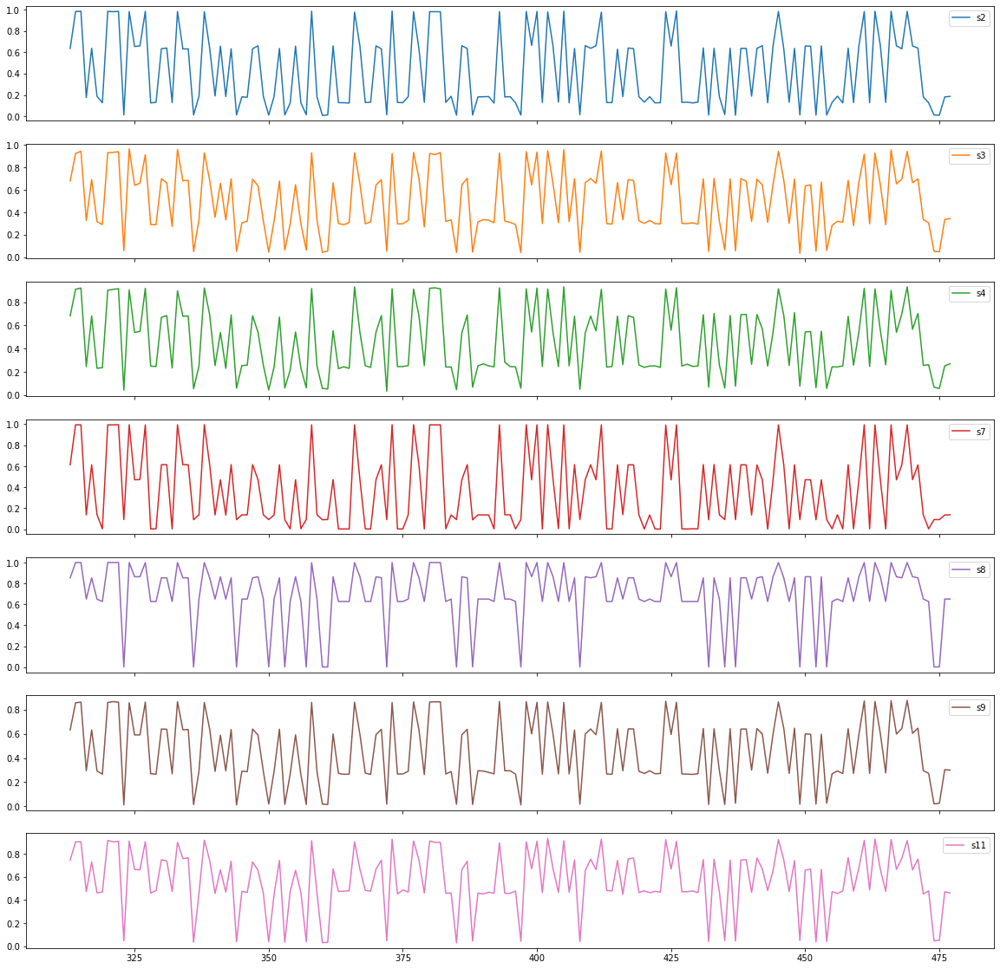

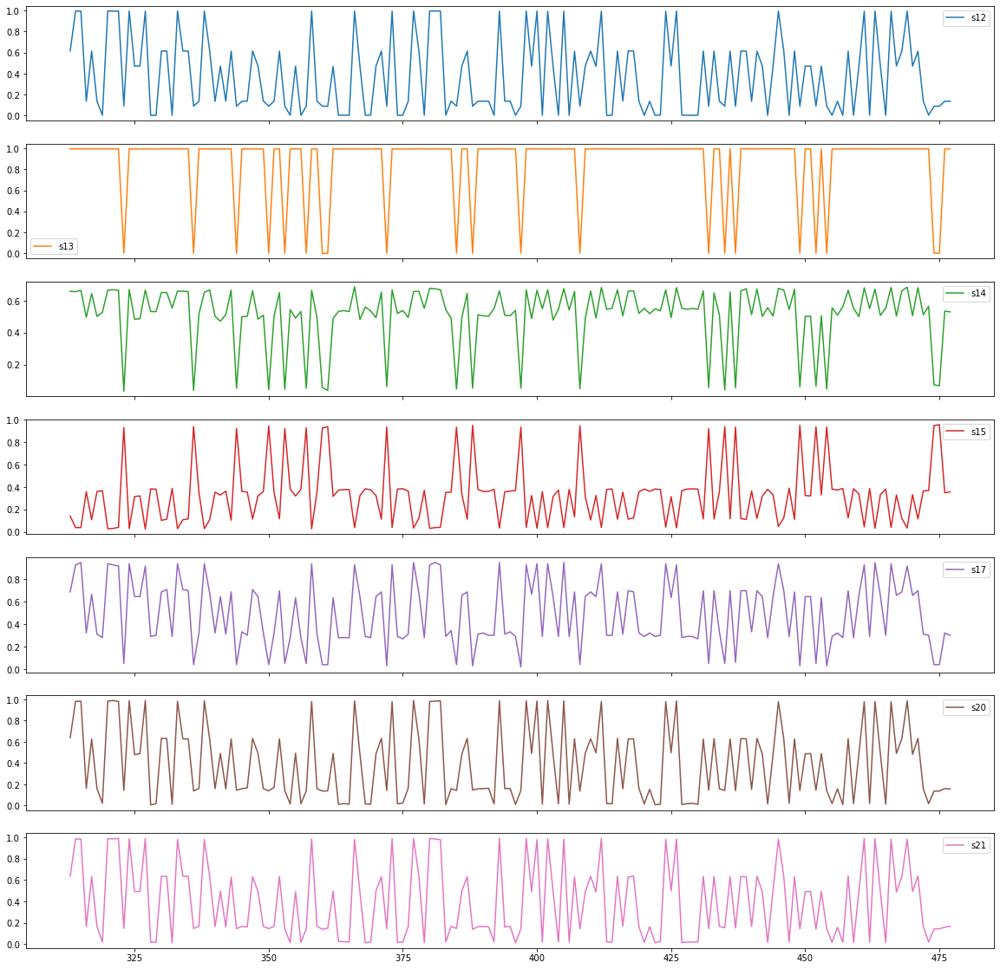

In [22]:
sequence_length = 35
sequence_length_ = 20  # length of sequence for each agent distraction
engine_id3 = test_df[test_df['id'] == 3]
engine_id3_50cycleWindow = engine_id3[engine_id3['RUL'] <= engine_id3['RUL'].min() + 50]
cols1 = ['s2', 's3', 's4', 's7', 's8', 's9', 's11']
engine_id3_50cycleWindow1 = engine_id3_50cycleWindow[cols1]
cols2 = ['s12', 's13', 's14', 's15', 's17', 's20', 's21']
engine_id3_50cycleWindow2 = engine_id3_50cycleWindow[cols2]

# plotting sensor data for engine ID 3 prior to a failure point - sensors 2, 3, 4, 7, 8, 9, 11
ax1 = engine_id3_50cycleWindow1.plot(subplots=True, sharex=True, figsize=(20,20))

# plotting sensor data for engine ID 3 prior to a failure point - sensors 12, 13, 14, 15, 17, 20, 21
ax2 = engine_id3_50cycleWindow2.plot(subplots=True, sharex=True, figsize=(20,20))

## Generate Train Data

In [23]:
# pick the feature columns
sensor_cols = ['s2', 's3', 's4', 's7', 's8', 's9', 's11', 's12', 's13', 's14', 's15', 's17', 's20', 's21']
sequence_cols = ['setting1', 'setting2', 'cycle_norm']
sequence_cols.extend(sensor_cols)

### generator train data for the sequences for each agent and save in a list

In [24]:
# Train data
# generator train data for the sequences for each agent and save in a list
data_array_ = {}
for i in train_df['id'].unique():
    seq_gen_ = (list(gen_sequence(train_df[train_df['id'] == id], sequence_length_, sequence_cols)) for id in [i])
    data_array_[i] = np.concatenate(list(seq_gen_)).astype(np.float32)

### generate train labels for each agent and save in a list

In [25]:
label_array_ = {}
# generate train labels for each agent and save in a list
for i in train_df['id'].unique():
    label_gen_ = (gen_labels(train_df[train_df['id'] == id], sequence_length_, ['label1']) for id in [i])
    label_array_[i] = np.concatenate(list(label_gen_)).astype(np.float32)

### Generate train labels based on RUL for each agent and save in a list

In [26]:
label_array_rul_ = {}
# Generate train labels based on RUL for each agent and save in a list
for i in train_df['id'].unique():
    label_gen_rul_ = (gen_labels(train_df[train_df['id'] == id], sequence_length_, ['RUL']) for id in [i])
    label_array_rul_[i] = np.concatenate(list(label_gen_rul_)).astype(np.int)

C:\Users\alibei\AppData\Local\Temp/ipykernel_10828/1920039281.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  label_array_rul_[i] = np.concatenate(list(label_gen_rul_)).astype(np.int)


In [27]:
# Find the minimum length of dataset for each agent
min_length = label_array_rul_[1].shape[0]
for i in train_df['id'].unique():
    if min_length > label_array_rul_[i].shape[0]:
        min_length = label_array_rul_[i].shape[0]

In [28]:
# set all length of lists to the minimum length of arrays
for i in train_df['id'].unique():
    label_array_rul_[i] = label_array_rul_[i][len(label_array_rul_[i]) - min_length:, :]
    label_array_[i] = label_array_[i][len(label_array_[i]) - min_length:, :]
    data_array_[i] = data_array_[i][len(data_array_[i]) - min_length:, :, :]
    
print(len(data_array_))
print(len(label_array_))
print(len(label_array_rul_))

print(data_array_[1].shape)
print(label_array_[1].shape)
print(label_array_rul_[1].shape)

260
260
260
(108, 20, 17)
(108, 1)
(108, 1)


### generator test data for the sequences for each agent and save in a list

In [29]:
# Test Data
# generator test data for the sequences for each agent and save in a list
seq_array_test_ = {}
for i in test_df['id'].unique():
    seq_gen_test_ = (list(gen_sequence(test_df[test_df['id'] == id], sequence_length_, sequence_cols)) for id in
                     [i])
    seq_array_test_[i] = np.concatenate(list(seq_gen_test_)).astype(np.float32)

### generate test labels for each agent and save in a list

In [30]:
label_array_test_ = {}
# generatAe test labels for each agent and save in a list
for i in test_df['id'].unique():
    label_gen_test_ = (gen_labels(test_df[test_df['id'] == id], sequence_length_, ['label1']) for id in [i])
    label_array_test_[i] = np.concatenate(list(label_gen_test_)).astype(np.float32)

### Generate test labels based on RUL for each agent and save in a list

In [31]:
label_array_test_rul_ = {}
# Generate test labels based on RUL for each agent and save in a list
for i in test_df['id'].unique():
    label_gen_test_rul_ = (gen_labels(test_df[test_df['id'] == id], sequence_length_, ['RUL']) for id in [i])
    label_array_test_rul_[i] = np.concatenate(list(label_gen_test_rul_)).astype(np.int)

C:\Users\alibei\AppData\Local\Temp/ipykernel_10828/500274830.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  label_array_test_rul_[i] = np.concatenate(list(label_gen_test_rul_)).astype(np.int)


### Select part of the train set which has the length longer than min_length

In [32]:
seq_array_test_tmp = {}
label_array_test_tmp = {}
label_array_test_rul_tmp = {}
for i in test_df['id'].unique():
    tmp = seq_array_test_[i].shape[0]
    if tmp >= min_length:
        seq_array_test_tmp[i] = seq_array_test_[i]
        label_array_test_tmp[i] = label_array_test_[i]
        label_array_test_rul_tmp[i] = label_array_test_rul_[i]

###  change the key of dictionary and indexing it based on increasing number from 1

In [33]:
# change the key of dictionary and indexing it based on increasing number from 1
seq_array_test_ = {}
label_array_test_ = {}
label_array_test_rul_ = {}
j = 1
for i in seq_array_test_tmp.keys():
    seq_array_test_[j] = seq_array_test_tmp[i]
    label_array_test_[j] = label_array_test_tmp[i]
    label_array_test_rul_[j] = label_array_test_rul_tmp[i]
    j += 1

del seq_array_test_tmp
del label_array_test_tmp
del label_array_test_rul_tmp

# set all length of test lists to the minimum length of arrays (min_length)
for i in seq_array_test_.keys():
    label_array_test_rul_[i] = label_array_test_rul_[i][len(label_array_test_rul_[i]) - min_length:, :]
    label_array_test_[i] = label_array_test_[i][len(label_array_test_[i]) - min_length:, :]
    seq_array_test_[i] = seq_array_test_[i][len(seq_array_test_[i]) - min_length:, :, :]

print(len(seq_array_test_))
print(len(label_array_test_))
print(len(label_array_test_rul_))

print(seq_array_test_[1].shape)
print(label_array_test_[1].shape)
print(label_array_test_rul_[1].shape)

X = {}
Y = {}
for i in data_array_.keys():
    X[i - 1] = data_array_[i].reshape(min_length, -1)
    Y[i - 1] = label_array_rul_[i]

X_test = {}
Y_test = {}
for i in seq_array_test_.keys():
    X_test[i - 1] = seq_array_test_[i].reshape(min_length, -1)
    Y_test[i - 1] = label_array_test_rul_[i]

137
137
137
(108, 20, 17)
(108, 1)
(108, 1)


## The main distributed LSTM model for 10 worker, in case of master and workers

In [34]:
num_workers = 10
array_params = [dict() for i in range(num_workers)]
J = [list() for i in range(num_workers)]

worker_model = {}
for worker_i in range(num_workers):
    worker_model[worker_i] = LSTM()
    array_params[worker_i] = worker_model[worker_i].init_random_params()

iteration_epoch = 3000
for i in range(iteration_epoch):
    print("Number of iteration:", i, "/from", iteration_epoch)
    for worker_i in range(num_workers):
        cost, array_params[worker_i] = worker_model[worker_i].train(X[worker_i], Y[worker_i],
                                                                    array_params[worker_i])
        J[worker_i].append(cost)

    for key in array_params[0]:  # Fed average
        tmp = array_params[0][key]
        for worker_i in range(1, num_workers):
            tmp = tmp + array_params[worker_i][key]
        for worker_i in range(num_workers):
            array_params[worker_i][key] = (1 / num_workers) * tmp  # Distribute aggregate parameters to all workers

Number of iteration: 0 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [115.4]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.38]
Epoch 3 	Batch: 50 - 75 	Loss: [115.34]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.39]
Epoch 3 	Batch: 50 - 75 	Loss: [115.36]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.38]
Epoch 3 	Batch: 50 - 75 	Loss: [115.36]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.39]
Epoch 3 	Batch: 50 - 75 	Loss: [115.36]
Epoch 0 	Batch: 50 - 75 	Loss: [115.4]
Epoch 1 	Batch: 50 - 75 	Loss: [115.39]
Epoch 2 	Batch: 50 - 75 	Loss: [115.37]
Epoch 3 	Batch: 50 - 75 	Loss: [115.34]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.38]
Epoch 3 	Batch: 50 - 75 	Loss: [115.34]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [114.92]
Epoch 3 	Batch: 50 - 75 	Loss: [114.88]
Epoch 0 	Batch: 50 - 75 	Loss: [115.03]
Epoch 1 	Batch: 50 - 75 	Loss: [115.]
Epoch 2 	Batch: 50 - 75 	Loss: [114.98]
Epoch 3 	Batch: 50 - 75 	Loss: [114.94]
Epoch 0 	Batch: 50 - 75 	Loss: [115.]
Epoch 1 	Batch: 50 - 75 	Loss: [114.98]
Epoch 2 	Batch: 50 - 75 	Loss: [114.94]
Epoch 3 	Batch: 50 - 75 	Loss: [114.91]
Epoch 0 	Batch: 50 - 75 	Loss: [115.]
Epoch 1 	Batch: 50 - 75 	Loss: [114.97]
Epoch 2 	Batch: 50 - 75 	Loss: [114.94]
Epoch 3 	Batch: 50 - 75 	Loss: [114.9]
Epoch 0 	Batch: 50 - 75 	Loss: [114.98]
Epoch 1 	Batch: 50 - 75 	Loss: [114.95]
Epoch 2 	Batch: 50 - 75 	Loss: [114.92]
Epoch 3 	Batch: 50 - 75 	Loss: [114.88]
Epoch 0 	Batch: 50 - 75 	Loss: [114.97]
Epoch 1 	Batch: 50 - 75 	Loss: [114.94]
Epoch 2 	Batch: 50 - 75 	Loss: [114.91]
Epoch 3 	Batch: 50 - 75 	Loss: [114.87]
Epoch 0 	Batch: 50 - 75 	Loss: [115.02]
Epoch 1 	Batch: 50 - 75 	Loss: [115.]
Epoch 2 	Batch: 50 - 75 	Loss: [114.97]
Epoch 3 	

Epoch 0 	Batch: 50 - 75 	Loss: [114.42]
Epoch 1 	Batch: 50 - 75 	Loss: [114.39]
Epoch 2 	Batch: 50 - 75 	Loss: [114.35]
Epoch 3 	Batch: 50 - 75 	Loss: [114.3]
Epoch 0 	Batch: 50 - 75 	Loss: [114.17]
Epoch 1 	Batch: 50 - 75 	Loss: [114.12]
Epoch 2 	Batch: 50 - 75 	Loss: [114.07]
Epoch 3 	Batch: 50 - 75 	Loss: [114.]
Epoch 0 	Batch: 50 - 75 	Loss: [114.14]
Epoch 1 	Batch: 50 - 75 	Loss: [114.09]
Epoch 2 	Batch: 50 - 75 	Loss: [114.02]
Epoch 3 	Batch: 50 - 75 	Loss: [113.94]
Epoch 0 	Batch: 50 - 75 	Loss: [114.24]
Epoch 1 	Batch: 50 - 75 	Loss: [114.21]
Epoch 2 	Batch: 50 - 75 	Loss: [114.17]
Epoch 3 	Batch: 50 - 75 	Loss: [114.11]
Epoch 0 	Batch: 50 - 75 	Loss: [114.15]
Epoch 1 	Batch: 50 - 75 	Loss: [114.1]
Epoch 2 	Batch: 50 - 75 	Loss: [114.04]
Epoch 3 	Batch: 50 - 75 	Loss: [113.96]
Epoch 0 	Batch: 50 - 75 	Loss: [114.32]
Epoch 1 	Batch: 50 - 75 	Loss: [114.28]
Epoch 2 	Batch: 50 - 75 	Loss: [114.23]
Epoch 3 	Batch: 50 - 75 	Loss: [114.18]
Epoch 0 	Batch: 50 - 75 	Loss: [114.44]
Epoc

Epoch 1 	Batch: 50 - 75 	Loss: [113.58]
Epoch 2 	Batch: 50 - 75 	Loss: [113.53]
Epoch 3 	Batch: 50 - 75 	Loss: [113.47]
Epoch 0 	Batch: 50 - 75 	Loss: [112.76]
Epoch 1 	Batch: 50 - 75 	Loss: [112.67]
Epoch 2 	Batch: 50 - 75 	Loss: [112.57]
Epoch 3 	Batch: 50 - 75 	Loss: [112.46]
Epoch 0 	Batch: 50 - 75 	Loss: [112.71]
Epoch 1 	Batch: 50 - 75 	Loss: [112.66]
Epoch 2 	Batch: 50 - 75 	Loss: [112.58]
Epoch 3 	Batch: 50 - 75 	Loss: [112.51]
Epoch 0 	Batch: 50 - 75 	Loss: [113.22]
Epoch 1 	Batch: 50 - 75 	Loss: [113.16]
Epoch 2 	Batch: 50 - 75 	Loss: [113.07]
Epoch 3 	Batch: 50 - 75 	Loss: [112.98]
Epoch 0 	Batch: 50 - 75 	Loss: [112.8]
Epoch 1 	Batch: 50 - 75 	Loss: [112.72]
Epoch 2 	Batch: 50 - 75 	Loss: [112.63]
Epoch 3 	Batch: 50 - 75 	Loss: [112.53]
Epoch 0 	Batch: 50 - 75 	Loss: [113.2]
Epoch 1 	Batch: 50 - 75 	Loss: [113.12]
Epoch 2 	Batch: 50 - 75 	Loss: [113.04]
Epoch 3 	Batch: 50 - 75 	Loss: [112.94]
Epoch 0 	Batch: 50 - 75 	Loss: [113.64]
Epoch 1 	Batch: 50 - 75 	Loss: [113.59]
Ep

Epoch 2 	Batch: 50 - 75 	Loss: [112.33]
Epoch 3 	Batch: 50 - 75 	Loss: [112.24]
Epoch 0 	Batch: 50 - 75 	Loss: [110.66]
Epoch 1 	Batch: 50 - 75 	Loss: [110.53]
Epoch 2 	Batch: 50 - 75 	Loss: [110.41]
Epoch 3 	Batch: 50 - 75 	Loss: [110.28]
Epoch 0 	Batch: 50 - 75 	Loss: [111.24]
Epoch 1 	Batch: 50 - 75 	Loss: [111.17]
Epoch 2 	Batch: 50 - 75 	Loss: [111.1]
Epoch 3 	Batch: 50 - 75 	Loss: [111.]
Epoch 0 	Batch: 50 - 75 	Loss: [111.51]
Epoch 1 	Batch: 50 - 75 	Loss: [111.43]
Epoch 2 	Batch: 50 - 75 	Loss: [111.36]
Epoch 3 	Batch: 50 - 75 	Loss: [111.3]
Epoch 0 	Batch: 50 - 75 	Loss: [110.7]
Epoch 1 	Batch: 50 - 75 	Loss: [110.59]
Epoch 2 	Batch: 50 - 75 	Loss: [110.46]
Epoch 3 	Batch: 50 - 75 	Loss: [110.33]
Epoch 0 	Batch: 50 - 75 	Loss: [111.2]
Epoch 1 	Batch: 50 - 75 	Loss: [111.09]
Epoch 2 	Batch: 50 - 75 	Loss: [110.98]
Epoch 3 	Batch: 50 - 75 	Loss: [110.89]
Epoch 0 	Batch: 50 - 75 	Loss: [112.13]
Epoch 1 	Batch: 50 - 75 	Loss: [112.03]
Epoch 2 	Batch: 50 - 75 	Loss: [111.92]
Epoch 

Epoch 2 	Batch: 50 - 75 	Loss: [107.65]
Epoch 3 	Batch: 50 - 75 	Loss: [107.5]
Epoch 0 	Batch: 50 - 75 	Loss: [109.25]
Epoch 1 	Batch: 50 - 75 	Loss: [109.13]
Epoch 2 	Batch: 50 - 75 	Loss: [109.01]
Epoch 3 	Batch: 50 - 75 	Loss: [108.88]
Epoch 0 	Batch: 50 - 75 	Loss: [109.4]
Epoch 1 	Batch: 50 - 75 	Loss: [109.3]
Epoch 2 	Batch: 50 - 75 	Loss: [109.21]
Epoch 3 	Batch: 50 - 75 	Loss: [109.13]
Epoch 0 	Batch: 50 - 75 	Loss: [108.16]
Epoch 1 	Batch: 50 - 75 	Loss: [108.03]
Epoch 2 	Batch: 50 - 75 	Loss: [107.89]
Epoch 3 	Batch: 50 - 75 	Loss: [107.75]
Epoch 0 	Batch: 50 - 75 	Loss: [108.99]
Epoch 1 	Batch: 50 - 75 	Loss: [108.86]
Epoch 2 	Batch: 50 - 75 	Loss: [108.72]
Epoch 3 	Batch: 50 - 75 	Loss: [108.59]
Epoch 0 	Batch: 50 - 75 	Loss: [110.15]
Epoch 1 	Batch: 50 - 75 	Loss: [110.08]
Epoch 2 	Batch: 50 - 75 	Loss: [109.96]
Epoch 3 	Batch: 50 - 75 	Loss: [109.84]
Epoch 0 	Batch: 50 - 75 	Loss: [108.69]
Epoch 1 	Batch: 50 - 75 	Loss: [108.57]
Epoch 2 	Batch: 50 - 75 	Loss: [108.44]
Epo

Epoch 1 	Batch: 50 - 75 	Loss: [106.82]
Epoch 2 	Batch: 50 - 75 	Loss: [106.69]
Epoch 3 	Batch: 50 - 75 	Loss: [106.55]
Epoch 0 	Batch: 50 - 75 	Loss: [106.94]
Epoch 1 	Batch: 50 - 75 	Loss: [106.83]
Epoch 2 	Batch: 50 - 75 	Loss: [106.7]
Epoch 3 	Batch: 50 - 75 	Loss: [106.59]
Epoch 0 	Batch: 50 - 75 	Loss: [105.39]
Epoch 1 	Batch: 50 - 75 	Loss: [105.24]
Epoch 2 	Batch: 50 - 75 	Loss: [105.09]
Epoch 3 	Batch: 50 - 75 	Loss: [104.93]
Epoch 0 	Batch: 50 - 75 	Loss: [106.22]
Epoch 1 	Batch: 50 - 75 	Loss: [106.08]
Epoch 2 	Batch: 50 - 75 	Loss: [105.93]
Epoch 3 	Batch: 50 - 75 	Loss: [105.78]
Epoch 0 	Batch: 50 - 75 	Loss: [107.77]
Epoch 1 	Batch: 50 - 75 	Loss: [107.65]
Epoch 2 	Batch: 50 - 75 	Loss: [107.51]
Epoch 3 	Batch: 50 - 75 	Loss: [107.36]
Epoch 0 	Batch: 50 - 75 	Loss: [106.11]
Epoch 1 	Batch: 50 - 75 	Loss: [105.98]
Epoch 2 	Batch: 50 - 75 	Loss: [105.84]
Epoch 3 	Batch: 50 - 75 	Loss: [105.69]
Epoch 0 	Batch: 50 - 75 	Loss: [106.19]
Epoch 1 	Batch: 50 - 75 	Loss: [106.06]
E

Epoch 0 	Batch: 50 - 75 	Loss: [104.16]
Epoch 1 	Batch: 50 - 75 	Loss: [104.01]
Epoch 2 	Batch: 50 - 75 	Loss: [103.85]
Epoch 3 	Batch: 50 - 75 	Loss: [103.71]
Epoch 0 	Batch: 50 - 75 	Loss: [102.49]
Epoch 1 	Batch: 50 - 75 	Loss: [102.34]
Epoch 2 	Batch: 50 - 75 	Loss: [102.19]
Epoch 3 	Batch: 50 - 75 	Loss: [102.02]
Epoch 0 	Batch: 50 - 75 	Loss: [103.26]
Epoch 1 	Batch: 50 - 75 	Loss: [103.12]
Epoch 2 	Batch: 50 - 75 	Loss: [102.96]
Epoch 3 	Batch: 50 - 75 	Loss: [102.8]
Epoch 0 	Batch: 50 - 75 	Loss: [105.08]
Epoch 1 	Batch: 50 - 75 	Loss: [104.96]
Epoch 2 	Batch: 50 - 75 	Loss: [104.81]
Epoch 3 	Batch: 50 - 75 	Loss: [104.67]
Epoch 0 	Batch: 50 - 75 	Loss: [103.49]
Epoch 1 	Batch: 50 - 75 	Loss: [103.35]
Epoch 2 	Batch: 50 - 75 	Loss: [103.21]
Epoch 3 	Batch: 50 - 75 	Loss: [103.06]
Epoch 0 	Batch: 50 - 75 	Loss: [103.43]
Epoch 1 	Batch: 50 - 75 	Loss: [103.28]
Epoch 2 	Batch: 50 - 75 	Loss: [103.12]
Epoch 3 	Batch: 50 - 75 	Loss: [102.97]
Number of iteration: 36 /from 3000
Epoch 

Epoch 0 	Batch: 50 - 75 	Loss: [99.49]
Epoch 1 	Batch: 50 - 75 	Loss: [99.35]
Epoch 2 	Batch: 50 - 75 	Loss: [99.19]
Epoch 3 	Batch: 50 - 75 	Loss: [99.02]
Epoch 0 	Batch: 50 - 75 	Loss: [100.25]
Epoch 1 	Batch: 50 - 75 	Loss: [100.1]
Epoch 2 	Batch: 50 - 75 	Loss: [99.94]
Epoch 3 	Batch: 50 - 75 	Loss: [99.77]
Epoch 0 	Batch: 50 - 75 	Loss: [102.47]
Epoch 1 	Batch: 50 - 75 	Loss: [102.34]
Epoch 2 	Batch: 50 - 75 	Loss: [102.21]
Epoch 3 	Batch: 50 - 75 	Loss: [102.06]
Epoch 0 	Batch: 50 - 75 	Loss: [100.7]
Epoch 1 	Batch: 50 - 75 	Loss: [100.57]
Epoch 2 	Batch: 50 - 75 	Loss: [100.43]
Epoch 3 	Batch: 50 - 75 	Loss: [100.28]
Epoch 0 	Batch: 50 - 75 	Loss: [100.54]
Epoch 1 	Batch: 50 - 75 	Loss: [100.4]
Epoch 2 	Batch: 50 - 75 	Loss: [100.24]
Epoch 3 	Batch: 50 - 75 	Loss: [100.09]
Number of iteration: 41 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [101.01]
Epoch 1 	Batch: 50 - 75 	Loss: [100.88]
Epoch 2 	Batch: 50 - 75 	Loss: [100.73]
Epoch 3 	Batch: 50 - 75 	Loss: [100.57]
Epoch 0 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [96.99]
Epoch 2 	Batch: 50 - 75 	Loss: [96.83]
Epoch 3 	Batch: 50 - 75 	Loss: [96.66]
Epoch 0 	Batch: 50 - 75 	Loss: [99.73]
Epoch 1 	Batch: 50 - 75 	Loss: [99.59]
Epoch 2 	Batch: 50 - 75 	Loss: [99.44]
Epoch 3 	Batch: 50 - 75 	Loss: [99.29]
Epoch 0 	Batch: 50 - 75 	Loss: [97.87]
Epoch 1 	Batch: 50 - 75 	Loss: [97.73]
Epoch 2 	Batch: 50 - 75 	Loss: [97.59]
Epoch 3 	Batch: 50 - 75 	Loss: [97.43]
Epoch 0 	Batch: 50 - 75 	Loss: [97.58]
Epoch 1 	Batch: 50 - 75 	Loss: [97.42]
Epoch 2 	Batch: 50 - 75 	Loss: [97.26]
Epoch 3 	Batch: 50 - 75 	Loss: [97.11]
Number of iteration: 46 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [98.17]
Epoch 1 	Batch: 50 - 75 	Loss: [98.02]
Epoch 2 	Batch: 50 - 75 	Loss: [97.87]
Epoch 3 	Batch: 50 - 75 	Loss: [97.73]
Epoch 0 	Batch: 50 - 75 	Loss: [101.54]
Epoch 1 	Batch: 50 - 75 	Loss: [101.38]
Epoch 2 	Batch: 50 - 75 	Loss: [101.22]
Epoch 3 	Batch: 50 - 75 	Loss: [101.09]
Epoch 0 	Batch: 50 - 75 	Loss: [94.32]
Epoch 1 	Batch: 50 - 75 	

Epoch 0 	Batch: 50 - 75 	Loss: [95.04]
Epoch 1 	Batch: 50 - 75 	Loss: [94.9]
Epoch 2 	Batch: 50 - 75 	Loss: [94.76]
Epoch 3 	Batch: 50 - 75 	Loss: [94.6]
Epoch 0 	Batch: 50 - 75 	Loss: [94.54]
Epoch 1 	Batch: 50 - 75 	Loss: [94.39]
Epoch 2 	Batch: 50 - 75 	Loss: [94.22]
Epoch 3 	Batch: 50 - 75 	Loss: [94.06]
Number of iteration: 51 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [95.41]
Epoch 1 	Batch: 50 - 75 	Loss: [95.29]
Epoch 2 	Batch: 50 - 75 	Loss: [95.13]
Epoch 3 	Batch: 50 - 75 	Loss: [94.97]
Epoch 0 	Batch: 50 - 75 	Loss: [99.16]
Epoch 1 	Batch: 50 - 75 	Loss: [99.05]
Epoch 2 	Batch: 50 - 75 	Loss: [98.91]
Epoch 3 	Batch: 50 - 75 	Loss: [98.75]
Epoch 0 	Batch: 50 - 75 	Loss: [90.88]
Epoch 1 	Batch: 50 - 75 	Loss: [90.71]
Epoch 2 	Batch: 50 - 75 	Loss: [90.52]
Epoch 3 	Batch: 50 - 75 	Loss: [90.34]
Epoch 0 	Batch: 50 - 75 	Loss: [95.21]
Epoch 1 	Batch: 50 - 75 	Loss: [95.04]
Epoch 2 	Batch: 50 - 75 	Loss: [94.86]
Epoch 3 	Batch: 50 - 75 	Loss: [94.67]
Epoch 0 	Batch: 50 - 75 	Loss: 

Epoch 3 	Batch: 50 - 75 	Loss: [91.01]
Number of iteration: 56 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [92.51]
Epoch 1 	Batch: 50 - 75 	Loss: [92.36]
Epoch 2 	Batch: 50 - 75 	Loss: [92.22]
Epoch 3 	Batch: 50 - 75 	Loss: [92.14]
Epoch 0 	Batch: 50 - 75 	Loss: [96.69]
Epoch 1 	Batch: 50 - 75 	Loss: [96.56]
Epoch 2 	Batch: 50 - 75 	Loss: [96.38]
Epoch 3 	Batch: 50 - 75 	Loss: [96.22]
Epoch 0 	Batch: 50 - 75 	Loss: [87.39]
Epoch 1 	Batch: 50 - 75 	Loss: [87.23]
Epoch 2 	Batch: 50 - 75 	Loss: [87.05]
Epoch 3 	Batch: 50 - 75 	Loss: [86.87]
Epoch 0 	Batch: 50 - 75 	Loss: [92.09]
Epoch 1 	Batch: 50 - 75 	Loss: [91.92]
Epoch 2 	Batch: 50 - 75 	Loss: [91.74]
Epoch 3 	Batch: 50 - 75 	Loss: [91.56]
Epoch 0 	Batch: 50 - 75 	Loss: [91.25]
Epoch 1 	Batch: 50 - 75 	Loss: [91.11]
Epoch 2 	Batch: 50 - 75 	Loss: [90.95]
Epoch 3 	Batch: 50 - 75 	Loss: [90.8]
Epoch 0 	Batch: 50 - 75 	Loss: [89.68]
Epoch 1 	Batch: 50 - 75 	Loss: [89.54]
Epoch 2 	Batch: 50 - 75 	Loss: [89.38]
Epoch 3 	Batch: 50 - 75 	Loss:

Epoch 3 	Batch: 50 - 75 	Loss: [93.58]
Epoch 0 	Batch: 50 - 75 	Loss: [83.9]
Epoch 1 	Batch: 50 - 75 	Loss: [83.73]
Epoch 2 	Batch: 50 - 75 	Loss: [83.55]
Epoch 3 	Batch: 50 - 75 	Loss: [83.36]
Epoch 0 	Batch: 50 - 75 	Loss: [89.05]
Epoch 1 	Batch: 50 - 75 	Loss: [88.9]
Epoch 2 	Batch: 50 - 75 	Loss: [88.72]
Epoch 3 	Batch: 50 - 75 	Loss: [88.53]
Epoch 0 	Batch: 50 - 75 	Loss: [88.27]
Epoch 1 	Batch: 50 - 75 	Loss: [88.12]
Epoch 2 	Batch: 50 - 75 	Loss: [87.96]
Epoch 3 	Batch: 50 - 75 	Loss: [87.79]
Epoch 0 	Batch: 50 - 75 	Loss: [86.63]
Epoch 1 	Batch: 50 - 75 	Loss: [86.47]
Epoch 2 	Batch: 50 - 75 	Loss: [86.31]
Epoch 3 	Batch: 50 - 75 	Loss: [86.14]
Epoch 0 	Batch: 50 - 75 	Loss: [87.28]
Epoch 1 	Batch: 50 - 75 	Loss: [87.15]
Epoch 2 	Batch: 50 - 75 	Loss: [87.02]
Epoch 3 	Batch: 50 - 75 	Loss: [86.87]
Epoch 0 	Batch: 50 - 75 	Loss: [90.86]
Epoch 1 	Batch: 50 - 75 	Loss: [90.72]
Epoch 2 	Batch: 50 - 75 	Loss: [90.57]
Epoch 3 	Batch: 50 - 75 	Loss: [90.4]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [85.22]
Epoch 1 	Batch: 50 - 75 	Loss: [85.08]
Epoch 2 	Batch: 50 - 75 	Loss: [84.93]
Epoch 3 	Batch: 50 - 75 	Loss: [84.78]
Epoch 0 	Batch: 50 - 75 	Loss: [83.54]
Epoch 1 	Batch: 50 - 75 	Loss: [83.41]
Epoch 2 	Batch: 50 - 75 	Loss: [83.24]
Epoch 3 	Batch: 50 - 75 	Loss: [83.07]
Epoch 0 	Batch: 50 - 75 	Loss: [84.17]
Epoch 1 	Batch: 50 - 75 	Loss: [84.02]
Epoch 2 	Batch: 50 - 75 	Loss: [83.86]
Epoch 3 	Batch: 50 - 75 	Loss: [83.69]
Epoch 0 	Batch: 50 - 75 	Loss: [88.06]
Epoch 1 	Batch: 50 - 75 	Loss: [87.95]
Epoch 2 	Batch: 50 - 75 	Loss: [87.79]
Epoch 3 	Batch: 50 - 75 	Loss: [87.65]
Epoch 0 	Batch: 50 - 75 	Loss: [85.94]
Epoch 1 	Batch: 50 - 75 	Loss: [85.81]
Epoch 2 	Batch: 50 - 75 	Loss: [85.66]
Epoch 3 	Batch: 50 - 75 	Loss: [85.5]
Epoch 0 	Batch: 50 - 75 	Loss: [84.94]
Epoch 1 	Batch: 50 - 75 	Loss: [84.78]
Epoch 2 	Batch: 50 - 75 	Loss: [84.62]
Epoch 3 	Batch: 50 - 75 	Loss: [84.45]
Number of iteration: 67 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [80.99]
Epoch 2 	Batch: 50 - 75 	Loss: [80.83]
Epoch 3 	Batch: 50 - 75 	Loss: [80.66]
Epoch 0 	Batch: 50 - 75 	Loss: [85.28]
Epoch 1 	Batch: 50 - 75 	Loss: [85.14]
Epoch 2 	Batch: 50 - 75 	Loss: [84.99]
Epoch 3 	Batch: 50 - 75 	Loss: [84.82]
Epoch 0 	Batch: 50 - 75 	Loss: [83.09]
Epoch 1 	Batch: 50 - 75 	Loss: [82.96]
Epoch 2 	Batch: 50 - 75 	Loss: [82.82]
Epoch 3 	Batch: 50 - 75 	Loss: [82.66]
Epoch 0 	Batch: 50 - 75 	Loss: [81.86]
Epoch 1 	Batch: 50 - 75 	Loss: [81.71]
Epoch 2 	Batch: 50 - 75 	Loss: [81.54]
Epoch 3 	Batch: 50 - 75 	Loss: [81.37]
Number of iteration: 72 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [82.89]
Epoch 1 	Batch: 50 - 75 	Loss: [82.73]
Epoch 2 	Batch: 50 - 75 	Loss: [82.55]
Epoch 3 	Batch: 50 - 75 	Loss: [82.38]
Epoch 0 	Batch: 50 - 75 	Loss: [88.15]
Epoch 1 	Batch: 50 - 75 	Loss: [88.02]
Epoch 2 	Batch: 50 - 75 	Loss: [87.85]
Epoch 3 	Batch: 50 - 75 	Loss: [87.67]
Epoch 0 	Batch: 50 - 75 	Loss: [76.33]
Epoch 1 	Batch: 50 - 75 	Loss

Epoch 2 	Batch: 50 - 75 	Loss: [80.04]
Epoch 3 	Batch: 50 - 75 	Loss: [79.89]
Epoch 0 	Batch: 50 - 75 	Loss: [78.8]
Epoch 1 	Batch: 50 - 75 	Loss: [78.65]
Epoch 2 	Batch: 50 - 75 	Loss: [78.49]
Epoch 3 	Batch: 50 - 75 	Loss: [78.33]
Number of iteration: 77 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [79.73]
Epoch 1 	Batch: 50 - 75 	Loss: [79.59]
Epoch 2 	Batch: 50 - 75 	Loss: [79.43]
Epoch 3 	Batch: 50 - 75 	Loss: [79.25]
Epoch 0 	Batch: 50 - 75 	Loss: [85.52]
Epoch 1 	Batch: 50 - 75 	Loss: [85.39]
Epoch 2 	Batch: 50 - 75 	Loss: [85.22]
Epoch 3 	Batch: 50 - 75 	Loss: [85.05]
Epoch 0 	Batch: 50 - 75 	Loss: [72.99]
Epoch 1 	Batch: 50 - 75 	Loss: [72.83]
Epoch 2 	Batch: 50 - 75 	Loss: [72.66]
Epoch 3 	Batch: 50 - 75 	Loss: [72.49]
Epoch 0 	Batch: 50 - 75 	Loss: [79.08]
Epoch 1 	Batch: 50 - 75 	Loss: [78.92]
Epoch 2 	Batch: 50 - 75 	Loss: [78.74]
Epoch 3 	Batch: 50 - 75 	Loss: [78.56]
Epoch 0 	Batch: 50 - 75 	Loss: [78.8]
Epoch 1 	Batch: 50 - 75 	Loss: [78.67]
Epoch 2 	Batch: 50 - 75 	Loss: 

Epoch 0 	Batch: 50 - 75 	Loss: [76.64]
Epoch 1 	Batch: 50 - 75 	Loss: [76.48]
Epoch 2 	Batch: 50 - 75 	Loss: [76.32]
Epoch 3 	Batch: 50 - 75 	Loss: [76.15]
Epoch 0 	Batch: 50 - 75 	Loss: [82.91]
Epoch 1 	Batch: 50 - 75 	Loss: [82.79]
Epoch 2 	Batch: 50 - 75 	Loss: [82.62]
Epoch 3 	Batch: 50 - 75 	Loss: [82.45]
Epoch 0 	Batch: 50 - 75 	Loss: [69.72]
Epoch 1 	Batch: 50 - 75 	Loss: [69.56]
Epoch 2 	Batch: 50 - 75 	Loss: [69.39]
Epoch 3 	Batch: 50 - 75 	Loss: [69.22]
Epoch 0 	Batch: 50 - 75 	Loss: [76.01]
Epoch 1 	Batch: 50 - 75 	Loss: [75.85]
Epoch 2 	Batch: 50 - 75 	Loss: [75.67]
Epoch 3 	Batch: 50 - 75 	Loss: [75.49]
Epoch 0 	Batch: 50 - 75 	Loss: [75.86]
Epoch 1 	Batch: 50 - 75 	Loss: [75.73]
Epoch 2 	Batch: 50 - 75 	Loss: [75.57]
Epoch 3 	Batch: 50 - 75 	Loss: [75.41]
Epoch 0 	Batch: 50 - 75 	Loss: [73.9]
Epoch 1 	Batch: 50 - 75 	Loss: [73.77]
Epoch 2 	Batch: 50 - 75 	Loss: [73.61]
Epoch 3 	Batch: 50 - 75 	Loss: [73.45]
Epoch 0 	Batch: 50 - 75 	Loss: [74.41]
Epoch 1 	Batch: 50 - 75 	L

Epoch 3 	Batch: 50 - 75 	Loss: [79.88]
Epoch 0 	Batch: 50 - 75 	Loss: [66.51]
Epoch 1 	Batch: 50 - 75 	Loss: [66.36]
Epoch 2 	Batch: 50 - 75 	Loss: [66.19]
Epoch 3 	Batch: 50 - 75 	Loss: [66.03]
Epoch 0 	Batch: 50 - 75 	Loss: [73.]
Epoch 1 	Batch: 50 - 75 	Loss: [72.84]
Epoch 2 	Batch: 50 - 75 	Loss: [72.67]
Epoch 3 	Batch: 50 - 75 	Loss: [72.5]
Epoch 0 	Batch: 50 - 75 	Loss: [72.92]
Epoch 1 	Batch: 50 - 75 	Loss: [72.79]
Epoch 2 	Batch: 50 - 75 	Loss: [72.63]
Epoch 3 	Batch: 50 - 75 	Loss: [72.48]
Epoch 0 	Batch: 50 - 75 	Loss: [70.98]
Epoch 1 	Batch: 50 - 75 	Loss: [70.85]
Epoch 2 	Batch: 50 - 75 	Loss: [70.69]
Epoch 3 	Batch: 50 - 75 	Loss: [70.53]
Epoch 0 	Batch: 50 - 75 	Loss: [71.5]
Epoch 1 	Batch: 50 - 75 	Loss: [71.37]
Epoch 2 	Batch: 50 - 75 	Loss: [71.22]
Epoch 3 	Batch: 50 - 75 	Loss: [71.07]
Epoch 0 	Batch: 50 - 75 	Loss: [75.91]
Epoch 1 	Batch: 50 - 75 	Loss: [75.79]
Epoch 2 	Batch: 50 - 75 	Loss: [75.64]
Epoch 3 	Batch: 50 - 75 	Loss: [75.48]
Epoch 0 	Batch: 50 - 75 	Loss

Epoch 3 	Batch: 50 - 75 	Loss: [69.57]
Epoch 0 	Batch: 50 - 75 	Loss: [70.13]
Epoch 1 	Batch: 50 - 75 	Loss: [69.99]
Epoch 2 	Batch: 50 - 75 	Loss: [69.84]
Epoch 3 	Batch: 50 - 75 	Loss: [69.69]
Epoch 0 	Batch: 50 - 75 	Loss: [68.1]
Epoch 1 	Batch: 50 - 75 	Loss: [67.97]
Epoch 2 	Batch: 50 - 75 	Loss: [67.82]
Epoch 3 	Batch: 50 - 75 	Loss: [67.66]
Epoch 0 	Batch: 50 - 75 	Loss: [68.64]
Epoch 1 	Batch: 50 - 75 	Loss: [68.51]
Epoch 2 	Batch: 50 - 75 	Loss: [68.37]
Epoch 3 	Batch: 50 - 75 	Loss: [68.21]
Epoch 0 	Batch: 50 - 75 	Loss: [73.06]
Epoch 1 	Batch: 50 - 75 	Loss: [72.92]
Epoch 2 	Batch: 50 - 75 	Loss: [72.76]
Epoch 3 	Batch: 50 - 75 	Loss: [72.61]
Epoch 0 	Batch: 50 - 75 	Loss: [71.79]
Epoch 1 	Batch: 50 - 75 	Loss: [71.67]
Epoch 2 	Batch: 50 - 75 	Loss: [71.54]
Epoch 3 	Batch: 50 - 75 	Loss: [71.4]
Epoch 0 	Batch: 50 - 75 	Loss: [69.29]
Epoch 1 	Batch: 50 - 75 	Loss: [69.15]
Epoch 2 	Batch: 50 - 75 	Loss: [68.99]
Epoch 3 	Batch: 50 - 75 	Loss: [68.83]
Number of iteration: 93 /fr

Epoch 3 	Batch: 50 - 75 	Loss: [64.86]
Epoch 0 	Batch: 50 - 75 	Loss: [65.84]
Epoch 1 	Batch: 50 - 75 	Loss: [65.71]
Epoch 2 	Batch: 50 - 75 	Loss: [65.57]
Epoch 3 	Batch: 50 - 75 	Loss: [65.42]
Epoch 0 	Batch: 50 - 75 	Loss: [70.27]
Epoch 1 	Batch: 50 - 75 	Loss: [70.15]
Epoch 2 	Batch: 50 - 75 	Loss: [70.01]
Epoch 3 	Batch: 50 - 75 	Loss: [69.87]
Epoch 0 	Batch: 50 - 75 	Loss: [69.29]
Epoch 1 	Batch: 50 - 75 	Loss: [69.18]
Epoch 2 	Batch: 50 - 75 	Loss: [69.05]
Epoch 3 	Batch: 50 - 75 	Loss: [68.91]
Epoch 0 	Batch: 50 - 75 	Loss: [66.4]
Epoch 1 	Batch: 50 - 75 	Loss: [66.26]
Epoch 2 	Batch: 50 - 75 	Loss: [66.11]
Epoch 3 	Batch: 50 - 75 	Loss: [65.95]
Number of iteration: 98 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [67.08]
Epoch 1 	Batch: 50 - 75 	Loss: [66.95]
Epoch 2 	Batch: 50 - 75 	Loss: [66.8]
Epoch 3 	Batch: 50 - 75 	Loss: [66.65]
Epoch 0 	Batch: 50 - 75 	Loss: [74.91]
Epoch 1 	Batch: 50 - 75 	Loss: [74.78]
Epoch 2 	Batch: 50 - 75 	Loss: [74.62]
Epoch 3 	Batch: 50 - 75 	Loss: 

Epoch 0 	Batch: 50 - 75 	Loss: [66.81]
Epoch 1 	Batch: 50 - 75 	Loss: [66.7]
Epoch 2 	Batch: 50 - 75 	Loss: [66.58]
Epoch 3 	Batch: 50 - 75 	Loss: [66.44]
Epoch 0 	Batch: 50 - 75 	Loss: [63.57]
Epoch 1 	Batch: 50 - 75 	Loss: [63.44]
Epoch 2 	Batch: 50 - 75 	Loss: [63.29]
Epoch 3 	Batch: 50 - 75 	Loss: [63.14]
Number of iteration: 103 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [64.41]
Epoch 1 	Batch: 50 - 75 	Loss: [64.31]
Epoch 2 	Batch: 50 - 75 	Loss: [64.17]
Epoch 3 	Batch: 50 - 75 	Loss: [64.02]
Epoch 0 	Batch: 50 - 75 	Loss: [72.49]
Epoch 1 	Batch: 50 - 75 	Loss: [72.36]
Epoch 2 	Batch: 50 - 75 	Loss: [72.21]
Epoch 3 	Batch: 50 - 75 	Loss: [72.05]
Epoch 0 	Batch: 50 - 75 	Loss: [56.88]
Epoch 1 	Batch: 50 - 75 	Loss: [56.74]
Epoch 2 	Batch: 50 - 75 	Loss: [56.59]
Epoch 3 	Batch: 50 - 75 	Loss: [56.44]
Epoch 0 	Batch: 50 - 75 	Loss: [63.82]
Epoch 1 	Batch: 50 - 75 	Loss: [63.67]
Epoch 2 	Batch: 50 - 75 	Loss: [63.52]
Epoch 3 	Batch: 50 - 75 	Loss: [63.36]
Epoch 0 	Batch: 50 - 75 	Loss

Epoch 3 	Batch: 50 - 75 	Loss: [60.39]
Number of iteration: 108 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [61.81]
Epoch 1 	Batch: 50 - 75 	Loss: [61.68]
Epoch 2 	Batch: 50 - 75 	Loss: [61.55]
Epoch 3 	Batch: 50 - 75 	Loss: [61.41]
Epoch 0 	Batch: 50 - 75 	Loss: [70.09]
Epoch 1 	Batch: 50 - 75 	Loss: [69.96]
Epoch 2 	Batch: 50 - 75 	Loss: [69.81]
Epoch 3 	Batch: 50 - 75 	Loss: [69.66]
Epoch 0 	Batch: 50 - 75 	Loss: [54.04]
Epoch 1 	Batch: 50 - 75 	Loss: [53.9]
Epoch 2 	Batch: 50 - 75 	Loss: [53.76]
Epoch 3 	Batch: 50 - 75 	Loss: [53.62]
Epoch 0 	Batch: 50 - 75 	Loss: [61.08]
Epoch 1 	Batch: 50 - 75 	Loss: [60.94]
Epoch 2 	Batch: 50 - 75 	Loss: [60.79]
Epoch 3 	Batch: 50 - 75 	Loss: [60.63]
Epoch 0 	Batch: 50 - 75 	Loss: [61.55]
Epoch 1 	Batch: 50 - 75 	Loss: [61.44]
Epoch 2 	Batch: 50 - 75 	Loss: [61.3]
Epoch 3 	Batch: 50 - 75 	Loss: [61.15]
Epoch 0 	Batch: 50 - 75 	Loss: [59.36]
Epoch 1 	Batch: 50 - 75 	Loss: [59.23]
Epoch 2 	Batch: 50 - 75 	Loss: [59.09]
Epoch 3 	Batch: 50 - 75 	Loss:

Epoch 2 	Batch: 50 - 75 	Loss: [67.49]
Epoch 3 	Batch: 50 - 75 	Loss: [67.34]
Epoch 0 	Batch: 50 - 75 	Loss: [51.32]
Epoch 1 	Batch: 50 - 75 	Loss: [51.19]
Epoch 2 	Batch: 50 - 75 	Loss: [51.05]
Epoch 3 	Batch: 50 - 75 	Loss: [50.91]
Epoch 0 	Batch: 50 - 75 	Loss: [58.41]
Epoch 1 	Batch: 50 - 75 	Loss: [58.27]
Epoch 2 	Batch: 50 - 75 	Loss: [58.12]
Epoch 3 	Batch: 50 - 75 	Loss: [57.97]
Epoch 0 	Batch: 50 - 75 	Loss: [59.03]
Epoch 1 	Batch: 50 - 75 	Loss: [58.92]
Epoch 2 	Batch: 50 - 75 	Loss: [58.78]
Epoch 3 	Batch: 50 - 75 	Loss: [58.64]
Epoch 0 	Batch: 50 - 75 	Loss: [56.75]
Epoch 1 	Batch: 50 - 75 	Loss: [56.64]
Epoch 2 	Batch: 50 - 75 	Loss: [56.5]
Epoch 3 	Batch: 50 - 75 	Loss: [56.37]
Epoch 0 	Batch: 50 - 75 	Loss: [57.16]
Epoch 1 	Batch: 50 - 75 	Loss: [57.04]
Epoch 2 	Batch: 50 - 75 	Loss: [56.9]
Epoch 3 	Batch: 50 - 75 	Loss: [56.76]
Epoch 0 	Batch: 50 - 75 	Loss: [61.86]
Epoch 1 	Batch: 50 - 75 	Loss: [61.77]
Epoch 2 	Batch: 50 - 75 	Loss: [61.65]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [55.69]
Epoch 2 	Batch: 50 - 75 	Loss: [55.54]
Epoch 3 	Batch: 50 - 75 	Loss: [55.39]
Epoch 0 	Batch: 50 - 75 	Loss: [56.56]
Epoch 1 	Batch: 50 - 75 	Loss: [56.47]
Epoch 2 	Batch: 50 - 75 	Loss: [56.34]
Epoch 3 	Batch: 50 - 75 	Loss: [56.21]
Epoch 0 	Batch: 50 - 75 	Loss: [54.21]
Epoch 1 	Batch: 50 - 75 	Loss: [54.09]
Epoch 2 	Batch: 50 - 75 	Loss: [53.96]
Epoch 3 	Batch: 50 - 75 	Loss: [53.82]
Epoch 0 	Batch: 50 - 75 	Loss: [54.57]
Epoch 1 	Batch: 50 - 75 	Loss: [54.45]
Epoch 2 	Batch: 50 - 75 	Loss: [54.31]
Epoch 3 	Batch: 50 - 75 	Loss: [54.18]
Epoch 0 	Batch: 50 - 75 	Loss: [59.36]
Epoch 1 	Batch: 50 - 75 	Loss: [59.23]
Epoch 2 	Batch: 50 - 75 	Loss: [59.09]
Epoch 3 	Batch: 50 - 75 	Loss: [58.96]
Epoch 0 	Batch: 50 - 75 	Loss: [59.3]
Epoch 1 	Batch: 50 - 75 	Loss: [59.19]
Epoch 2 	Batch: 50 - 75 	Loss: [59.07]
Epoch 3 	Batch: 50 - 75 	Loss: [58.95]
Epoch 0 	Batch: 50 - 75 	Loss: [55.01]
Epoch 1 	Batch: 50 - 75 	Loss: [54.88]
Epoch 2 	Batch: 50 - 75 	L

Epoch 2 	Batch: 50 - 75 	Loss: [51.51]
Epoch 3 	Batch: 50 - 75 	Loss: [51.38]
Epoch 0 	Batch: 50 - 75 	Loss: [52.06]
Epoch 1 	Batch: 50 - 75 	Loss: [51.95]
Epoch 2 	Batch: 50 - 75 	Loss: [51.82]
Epoch 3 	Batch: 50 - 75 	Loss: [51.69]
Epoch 0 	Batch: 50 - 75 	Loss: [56.86]
Epoch 1 	Batch: 50 - 75 	Loss: [56.76]
Epoch 2 	Batch: 50 - 75 	Loss: [56.63]
Epoch 3 	Batch: 50 - 75 	Loss: [56.5]
Epoch 0 	Batch: 50 - 75 	Loss: [57.08]
Epoch 1 	Batch: 50 - 75 	Loss: [56.97]
Epoch 2 	Batch: 50 - 75 	Loss: [56.85]
Epoch 3 	Batch: 50 - 75 	Loss: [56.73]
Epoch 0 	Batch: 50 - 75 	Loss: [52.49]
Epoch 1 	Batch: 50 - 75 	Loss: [52.37]
Epoch 2 	Batch: 50 - 75 	Loss: [52.24]
Epoch 3 	Batch: 50 - 75 	Loss: [52.11]
Number of iteration: 124 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [53.89]
Epoch 1 	Batch: 50 - 75 	Loss: [53.78]
Epoch 2 	Batch: 50 - 75 	Loss: [53.64]
Epoch 3 	Batch: 50 - 75 	Loss: [53.5]
Epoch 0 	Batch: 50 - 75 	Loss: [62.76]
Epoch 1 	Batch: 50 - 75 	Loss: [62.64]
Epoch 2 	Batch: 50 - 75 	Loss:

Epoch 2 	Batch: 50 - 75 	Loss: [54.17]
Epoch 3 	Batch: 50 - 75 	Loss: [54.04]
Epoch 0 	Batch: 50 - 75 	Loss: [54.92]
Epoch 1 	Batch: 50 - 75 	Loss: [54.82]
Epoch 2 	Batch: 50 - 75 	Loss: [54.71]
Epoch 3 	Batch: 50 - 75 	Loss: [54.59]
Epoch 0 	Batch: 50 - 75 	Loss: [50.05]
Epoch 1 	Batch: 50 - 75 	Loss: [49.94]
Epoch 2 	Batch: 50 - 75 	Loss: [49.82]
Epoch 3 	Batch: 50 - 75 	Loss: [49.69]
Number of iteration: 129 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [51.54]
Epoch 1 	Batch: 50 - 75 	Loss: [51.44]
Epoch 2 	Batch: 50 - 75 	Loss: [51.31]
Epoch 3 	Batch: 50 - 75 	Loss: [51.18]
Epoch 0 	Batch: 50 - 75 	Loss: [60.55]
Epoch 1 	Batch: 50 - 75 	Loss: [60.44]
Epoch 2 	Batch: 50 - 75 	Loss: [60.31]
Epoch 3 	Batch: 50 - 75 	Loss: [60.17]
Epoch 0 	Batch: 50 - 75 	Loss: [43.29]
Epoch 1 	Batch: 50 - 75 	Loss: [43.18]
Epoch 2 	Batch: 50 - 75 	Loss: [43.06]
Epoch 3 	Batch: 50 - 75 	Loss: [42.93]
Epoch 0 	Batch: 50 - 75 	Loss: [50.3]
Epoch 1 	Batch: 50 - 75 	Loss: [50.17]
Epoch 2 	Batch: 50 - 75 	Loss

Epoch 2 	Batch: 50 - 75 	Loss: [47.46]
Epoch 3 	Batch: 50 - 75 	Loss: [47.34]
Number of iteration: 134 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [49.26]
Epoch 1 	Batch: 50 - 75 	Loss: [49.16]
Epoch 2 	Batch: 50 - 75 	Loss: [49.03]
Epoch 3 	Batch: 50 - 75 	Loss: [48.91]
Epoch 0 	Batch: 50 - 75 	Loss: [58.41]
Epoch 1 	Batch: 50 - 75 	Loss: [58.3]
Epoch 2 	Batch: 50 - 75 	Loss: [58.17]
Epoch 3 	Batch: 50 - 75 	Loss: [58.03]
Epoch 0 	Batch: 50 - 75 	Loss: [40.98]
Epoch 1 	Batch: 50 - 75 	Loss: [40.87]
Epoch 2 	Batch: 50 - 75 	Loss: [40.76]
Epoch 3 	Batch: 50 - 75 	Loss: [40.64]
Epoch 0 	Batch: 50 - 75 	Loss: [47.9]
Epoch 1 	Batch: 50 - 75 	Loss: [47.78]
Epoch 2 	Batch: 50 - 75 	Loss: [47.65]
Epoch 3 	Batch: 50 - 75 	Loss: [47.51]
Epoch 0 	Batch: 50 - 75 	Loss: [49.38]
Epoch 1 	Batch: 50 - 75 	Loss: [49.29]
Epoch 2 	Batch: 50 - 75 	Loss: [49.18]
Epoch 3 	Batch: 50 - 75 	Loss: [49.06]
Epoch 0 	Batch: 50 - 75 	Loss: [46.58]
Epoch 1 	Batch: 50 - 75 	Loss: [46.47]
Epoch 2 	Batch: 50 - 75 	Loss:

Epoch 0 	Batch: 50 - 75 	Loss: [56.33]
Epoch 1 	Batch: 50 - 75 	Loss: [56.22]
Epoch 2 	Batch: 50 - 75 	Loss: [56.1]
Epoch 3 	Batch: 50 - 75 	Loss: [55.97]
Epoch 0 	Batch: 50 - 75 	Loss: [38.78]
Epoch 1 	Batch: 50 - 75 	Loss: [38.68]
Epoch 2 	Batch: 50 - 75 	Loss: [38.57]
Epoch 3 	Batch: 50 - 75 	Loss: [38.45]
Epoch 0 	Batch: 50 - 75 	Loss: [45.55]
Epoch 1 	Batch: 50 - 75 	Loss: [45.43]
Epoch 2 	Batch: 50 - 75 	Loss: [45.31]
Epoch 3 	Batch: 50 - 75 	Loss: [45.18]
Epoch 0 	Batch: 50 - 75 	Loss: [47.3]
Epoch 1 	Batch: 50 - 75 	Loss: [47.24]
Epoch 2 	Batch: 50 - 75 	Loss: [47.12]
Epoch 3 	Batch: 50 - 75 	Loss: [47.02]
Epoch 0 	Batch: 50 - 75 	Loss: [44.35]
Epoch 1 	Batch: 50 - 75 	Loss: [44.25]
Epoch 2 	Batch: 50 - 75 	Loss: [44.14]
Epoch 3 	Batch: 50 - 75 	Loss: [44.02]
Epoch 0 	Batch: 50 - 75 	Loss: [44.64]
Epoch 1 	Batch: 50 - 75 	Loss: [44.53]
Epoch 2 	Batch: 50 - 75 	Loss: [44.42]
Epoch 3 	Batch: 50 - 75 	Loss: [44.31]
Epoch 0 	Batch: 50 - 75 	Loss: [49.28]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [43.19]
Epoch 2 	Batch: 50 - 75 	Loss: [43.06]
Epoch 3 	Batch: 50 - 75 	Loss: [42.94]
Epoch 0 	Batch: 50 - 75 	Loss: [45.43]
Epoch 1 	Batch: 50 - 75 	Loss: [45.37]
Epoch 2 	Batch: 50 - 75 	Loss: [45.26]
Epoch 3 	Batch: 50 - 75 	Loss: [45.15]
Epoch 0 	Batch: 50 - 75 	Loss: [42.2]
Epoch 1 	Batch: 50 - 75 	Loss: [42.1]
Epoch 2 	Batch: 50 - 75 	Loss: [41.99]
Epoch 3 	Batch: 50 - 75 	Loss: [41.87]
Epoch 0 	Batch: 50 - 75 	Loss: [42.48]
Epoch 1 	Batch: 50 - 75 	Loss: [42.38]
Epoch 2 	Batch: 50 - 75 	Loss: [42.27]
Epoch 3 	Batch: 50 - 75 	Loss: [42.16]
Epoch 0 	Batch: 50 - 75 	Loss: [47.02]
Epoch 1 	Batch: 50 - 75 	Loss: [46.91]
Epoch 2 	Batch: 50 - 75 	Loss: [46.79]
Epoch 3 	Batch: 50 - 75 	Loss: [46.67]
Epoch 0 	Batch: 50 - 75 	Loss: [48.44]
Epoch 1 	Batch: 50 - 75 	Loss: [48.35]
Epoch 2 	Batch: 50 - 75 	Loss: [48.25]
Epoch 3 	Batch: 50 - 75 	Loss: [48.14]
Epoch 0 	Batch: 50 - 75 	Loss: [42.79]
Epoch 1 	Batch: 50 - 75 	Loss: [42.69]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [40.03]
Epoch 2 	Batch: 50 - 75 	Loss: [39.92]
Epoch 3 	Batch: 50 - 75 	Loss: [39.81]
Epoch 0 	Batch: 50 - 75 	Loss: [40.45]
Epoch 1 	Batch: 50 - 75 	Loss: [40.36]
Epoch 2 	Batch: 50 - 75 	Loss: [40.26]
Epoch 3 	Batch: 50 - 75 	Loss: [40.15]
Epoch 0 	Batch: 50 - 75 	Loss: [44.83]
Epoch 1 	Batch: 50 - 75 	Loss: [44.73]
Epoch 2 	Batch: 50 - 75 	Loss: [44.61]
Epoch 3 	Batch: 50 - 75 	Loss: [44.5]
Epoch 0 	Batch: 50 - 75 	Loss: [46.54]
Epoch 1 	Batch: 50 - 75 	Loss: [46.45]
Epoch 2 	Batch: 50 - 75 	Loss: [46.35]
Epoch 3 	Batch: 50 - 75 	Loss: [46.24]
Epoch 0 	Batch: 50 - 75 	Loss: [40.68]
Epoch 1 	Batch: 50 - 75 	Loss: [40.59]
Epoch 2 	Batch: 50 - 75 	Loss: [40.48]
Epoch 3 	Batch: 50 - 75 	Loss: [40.37]
Number of iteration: 150 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [42.43]
Epoch 1 	Batch: 50 - 75 	Loss: [42.34]
Epoch 2 	Batch: 50 - 75 	Loss: [42.23]
Epoch 3 	Batch: 50 - 75 	Loss: [42.11]
Epoch 0 	Batch: 50 - 75 	Loss: [52.03]
Epoch 1 	Batch: 50 - 75 	Loss

Epoch 3 	Batch: 50 - 75 	Loss: [38.22]
Epoch 0 	Batch: 50 - 75 	Loss: [42.73]
Epoch 1 	Batch: 50 - 75 	Loss: [42.63]
Epoch 2 	Batch: 50 - 75 	Loss: [42.52]
Epoch 3 	Batch: 50 - 75 	Loss: [42.41]
Epoch 0 	Batch: 50 - 75 	Loss: [44.67]
Epoch 1 	Batch: 50 - 75 	Loss: [44.58]
Epoch 2 	Batch: 50 - 75 	Loss: [44.49]
Epoch 3 	Batch: 50 - 75 	Loss: [44.38]
Epoch 0 	Batch: 50 - 75 	Loss: [38.66]
Epoch 1 	Batch: 50 - 75 	Loss: [38.57]
Epoch 2 	Batch: 50 - 75 	Loss: [38.47]
Epoch 3 	Batch: 50 - 75 	Loss: [38.36]
Number of iteration: 155 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [40.44]
Epoch 1 	Batch: 50 - 75 	Loss: [40.35]
Epoch 2 	Batch: 50 - 75 	Loss: [40.24]
Epoch 3 	Batch: 50 - 75 	Loss: [40.13]
Epoch 0 	Batch: 50 - 75 	Loss: [50.14]
Epoch 1 	Batch: 50 - 75 	Loss: [50.04]
Epoch 2 	Batch: 50 - 75 	Loss: [49.93]
Epoch 3 	Batch: 50 - 75 	Loss: [49.81]
Epoch 0 	Batch: 50 - 75 	Loss: [32.44]
Epoch 1 	Batch: 50 - 75 	Loss: [32.35]
Epoch 2 	Batch: 50 - 75 	Loss: [32.26]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [42.56]
Epoch 0 	Batch: 50 - 75 	Loss: [36.7]
Epoch 1 	Batch: 50 - 75 	Loss: [36.61]
Epoch 2 	Batch: 50 - 75 	Loss: [36.51]
Epoch 3 	Batch: 50 - 75 	Loss: [36.4]
Number of iteration: 160 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [38.48]
Epoch 1 	Batch: 50 - 75 	Loss: [38.4]
Epoch 2 	Batch: 50 - 75 	Loss: [38.29]
Epoch 3 	Batch: 50 - 75 	Loss: [38.18]
Epoch 0 	Batch: 50 - 75 	Loss: [48.35]
Epoch 1 	Batch: 50 - 75 	Loss: [48.26]
Epoch 2 	Batch: 50 - 75 	Loss: [48.15]
Epoch 3 	Batch: 50 - 75 	Loss: [48.04]
Epoch 0 	Batch: 50 - 75 	Loss: [30.64]
Epoch 1 	Batch: 50 - 75 	Loss: [30.56]
Epoch 2 	Batch: 50 - 75 	Loss: [30.47]
Epoch 3 	Batch: 50 - 75 	Loss: [30.37]
Epoch 0 	Batch: 50 - 75 	Loss: [36.45]
Epoch 1 	Batch: 50 - 75 	Loss: [36.36]
Epoch 2 	Batch: 50 - 75 	Loss: [36.25]
Epoch 3 	Batch: 50 - 75 	Loss: [36.14]
Epoch 0 	Batch: 50 - 75 	Loss: [39.72]
Epoch 1 	Batch: 50 - 75 	Loss: [39.65]
Epoch 2 	Batch: 50 - 75 	Loss: [39.56]
Epoch 3 	Batch: 50 - 75 	Loss: 

Epoch 2 	Batch: 50 - 75 	Loss: [36.41]
Epoch 3 	Batch: 50 - 75 	Loss: [36.31]
Epoch 0 	Batch: 50 - 75 	Loss: [46.64]
Epoch 1 	Batch: 50 - 75 	Loss: [46.55]
Epoch 2 	Batch: 50 - 75 	Loss: [46.44]
Epoch 3 	Batch: 50 - 75 	Loss: [46.33]
Epoch 0 	Batch: 50 - 75 	Loss: [28.91]
Epoch 1 	Batch: 50 - 75 	Loss: [28.83]
Epoch 2 	Batch: 50 - 75 	Loss: [28.75]
Epoch 3 	Batch: 50 - 75 	Loss: [28.66]
Epoch 0 	Batch: 50 - 75 	Loss: [34.5]
Epoch 1 	Batch: 50 - 75 	Loss: [34.4]
Epoch 2 	Batch: 50 - 75 	Loss: [34.3]
Epoch 3 	Batch: 50 - 75 	Loss: [34.19]
Epoch 0 	Batch: 50 - 75 	Loss: [38.08]
Epoch 1 	Batch: 50 - 75 	Loss: [38.04]
Epoch 2 	Batch: 50 - 75 	Loss: [37.94]
Epoch 3 	Batch: 50 - 75 	Loss: [37.84]
Epoch 0 	Batch: 50 - 75 	Loss: [33.99]
Epoch 1 	Batch: 50 - 75 	Loss: [33.9]
Epoch 2 	Batch: 50 - 75 	Loss: [33.81]
Epoch 3 	Batch: 50 - 75 	Loss: [33.71]
Epoch 0 	Batch: 50 - 75 	Loss: [34.47]
Epoch 1 	Batch: 50 - 75 	Loss: [34.38]
Epoch 2 	Batch: 50 - 75 	Loss: [34.29]
Epoch 3 	Batch: 50 - 75 	Loss

Epoch 1 	Batch: 50 - 75 	Loss: [27.19]
Epoch 2 	Batch: 50 - 75 	Loss: [27.11]
Epoch 3 	Batch: 50 - 75 	Loss: [27.03]
Epoch 0 	Batch: 50 - 75 	Loss: [32.63]
Epoch 1 	Batch: 50 - 75 	Loss: [32.54]
Epoch 2 	Batch: 50 - 75 	Loss: [32.44]
Epoch 3 	Batch: 50 - 75 	Loss: [32.34]
Epoch 0 	Batch: 50 - 75 	Loss: [36.48]
Epoch 1 	Batch: 50 - 75 	Loss: [36.43]
Epoch 2 	Batch: 50 - 75 	Loss: [36.34]
Epoch 3 	Batch: 50 - 75 	Loss: [36.24]
Epoch 0 	Batch: 50 - 75 	Loss: [32.22]
Epoch 1 	Batch: 50 - 75 	Loss: [32.13]
Epoch 2 	Batch: 50 - 75 	Loss: [32.04]
Epoch 3 	Batch: 50 - 75 	Loss: [31.95]
Epoch 0 	Batch: 50 - 75 	Loss: [32.74]
Epoch 1 	Batch: 50 - 75 	Loss: [32.65]
Epoch 2 	Batch: 50 - 75 	Loss: [32.57]
Epoch 3 	Batch: 50 - 75 	Loss: [32.48]
Epoch 0 	Batch: 50 - 75 	Loss: [36.51]
Epoch 1 	Batch: 50 - 75 	Loss: [36.42]
Epoch 2 	Batch: 50 - 75 	Loss: [36.32]
Epoch 3 	Batch: 50 - 75 	Loss: [36.22]
Epoch 0 	Batch: 50 - 75 	Loss: [38.97]
Epoch 1 	Batch: 50 - 75 	Loss: [38.89]
Epoch 2 	Batch: 50 - 75 	

Epoch 0 	Batch: 50 - 75 	Loss: [34.92]
Epoch 1 	Batch: 50 - 75 	Loss: [34.87]
Epoch 2 	Batch: 50 - 75 	Loss: [34.79]
Epoch 3 	Batch: 50 - 75 	Loss: [34.69]
Epoch 0 	Batch: 50 - 75 	Loss: [30.52]
Epoch 1 	Batch: 50 - 75 	Loss: [30.44]
Epoch 2 	Batch: 50 - 75 	Loss: [30.35]
Epoch 3 	Batch: 50 - 75 	Loss: [30.26]
Epoch 0 	Batch: 50 - 75 	Loss: [31.08]
Epoch 1 	Batch: 50 - 75 	Loss: [31.]
Epoch 2 	Batch: 50 - 75 	Loss: [30.91]
Epoch 3 	Batch: 50 - 75 	Loss: [30.83]
Epoch 0 	Batch: 50 - 75 	Loss: [34.69]
Epoch 1 	Batch: 50 - 75 	Loss: [34.61]
Epoch 2 	Batch: 50 - 75 	Loss: [34.51]
Epoch 3 	Batch: 50 - 75 	Loss: [34.42]
Epoch 0 	Batch: 50 - 75 	Loss: [37.29]
Epoch 1 	Batch: 50 - 75 	Loss: [37.21]
Epoch 2 	Batch: 50 - 75 	Loss: [37.12]
Epoch 3 	Batch: 50 - 75 	Loss: [37.02]
Epoch 0 	Batch: 50 - 75 	Loss: [30.9]
Epoch 1 	Batch: 50 - 75 	Loss: [30.81]
Epoch 2 	Batch: 50 - 75 	Loss: [30.73]
Epoch 3 	Batch: 50 - 75 	Loss: [30.64]
Number of iteration: 176 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: 

Epoch 2 	Batch: 50 - 75 	Loss: [28.73]
Epoch 3 	Batch: 50 - 75 	Loss: [28.64]
Epoch 0 	Batch: 50 - 75 	Loss: [29.49]
Epoch 1 	Batch: 50 - 75 	Loss: [29.42]
Epoch 2 	Batch: 50 - 75 	Loss: [29.34]
Epoch 3 	Batch: 50 - 75 	Loss: [29.25]
Epoch 0 	Batch: 50 - 75 	Loss: [32.94]
Epoch 1 	Batch: 50 - 75 	Loss: [32.86]
Epoch 2 	Batch: 50 - 75 	Loss: [32.77]
Epoch 3 	Batch: 50 - 75 	Loss: [32.68]
Epoch 0 	Batch: 50 - 75 	Loss: [35.66]
Epoch 1 	Batch: 50 - 75 	Loss: [35.58]
Epoch 2 	Batch: 50 - 75 	Loss: [35.5]
Epoch 3 	Batch: 50 - 75 	Loss: [35.41]
Epoch 0 	Batch: 50 - 75 	Loss: [29.23]
Epoch 1 	Batch: 50 - 75 	Loss: [29.15]
Epoch 2 	Batch: 50 - 75 	Loss: [29.07]
Epoch 3 	Batch: 50 - 75 	Loss: [28.98]
Number of iteration: 181 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [30.94]
Epoch 1 	Batch: 50 - 75 	Loss: [30.87]
Epoch 2 	Batch: 50 - 75 	Loss: [30.78]
Epoch 3 	Batch: 50 - 75 	Loss: [30.69]
Epoch 0 	Batch: 50 - 75 	Loss: [41.65]
Epoch 1 	Batch: 50 - 75 	Loss: [41.56]
Epoch 2 	Batch: 50 - 75 	Loss

Epoch 0 	Batch: 50 - 75 	Loss: [34.08]
Epoch 1 	Batch: 50 - 75 	Loss: [34.]
Epoch 2 	Batch: 50 - 75 	Loss: [33.92]
Epoch 3 	Batch: 50 - 75 	Loss: [33.83]
Epoch 0 	Batch: 50 - 75 	Loss: [27.63]
Epoch 1 	Batch: 50 - 75 	Loss: [27.56]
Epoch 2 	Batch: 50 - 75 	Loss: [27.48]
Epoch 3 	Batch: 50 - 75 	Loss: [27.39]
Number of iteration: 186 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [29.3]
Epoch 1 	Batch: 50 - 75 	Loss: [29.23]
Epoch 2 	Batch: 50 - 75 	Loss: [29.14]
Epoch 3 	Batch: 50 - 75 	Loss: [29.06]
Epoch 0 	Batch: 50 - 75 	Loss: [40.21]
Epoch 1 	Batch: 50 - 75 	Loss: [40.13]
Epoch 2 	Batch: 50 - 75 	Loss: [40.04]
Epoch 3 	Batch: 50 - 75 	Loss: [39.94]
Epoch 0 	Batch: 50 - 75 	Loss: [22.54]
Epoch 1 	Batch: 50 - 75 	Loss: [22.48]
Epoch 2 	Batch: 50 - 75 	Loss: [22.41]
Epoch 3 	Batch: 50 - 75 	Loss: [22.34]
Epoch 0 	Batch: 50 - 75 	Loss: [27.18]
Epoch 1 	Batch: 50 - 75 	Loss: [27.11]
Epoch 2 	Batch: 50 - 75 	Loss: [27.02]
Epoch 3 	Batch: 50 - 75 	Loss: [26.94]
Epoch 0 	Batch: 50 - 75 	Loss: 

Epoch 2 	Batch: 50 - 75 	Loss: [25.95]
Epoch 3 	Batch: 50 - 75 	Loss: [25.87]
Number of iteration: 191 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [27.73]
Epoch 1 	Batch: 50 - 75 	Loss: [27.65]
Epoch 2 	Batch: 50 - 75 	Loss: [27.57]
Epoch 3 	Batch: 50 - 75 	Loss: [27.49]
Epoch 0 	Batch: 50 - 75 	Loss: [38.84]
Epoch 1 	Batch: 50 - 75 	Loss: [38.77]
Epoch 2 	Batch: 50 - 75 	Loss: [38.67]
Epoch 3 	Batch: 50 - 75 	Loss: [38.58]
Epoch 0 	Batch: 50 - 75 	Loss: [21.22]
Epoch 1 	Batch: 50 - 75 	Loss: [21.16]
Epoch 2 	Batch: 50 - 75 	Loss: [21.09]
Epoch 3 	Batch: 50 - 75 	Loss: [21.02]
Epoch 0 	Batch: 50 - 75 	Loss: [25.64]
Epoch 1 	Batch: 50 - 75 	Loss: [25.57]
Epoch 2 	Batch: 50 - 75 	Loss: [25.49]
Epoch 3 	Batch: 50 - 75 	Loss: [25.4]
Epoch 0 	Batch: 50 - 75 	Loss: [30.26]
Epoch 1 	Batch: 50 - 75 	Loss: [30.21]
Epoch 2 	Batch: 50 - 75 	Loss: [30.13]
Epoch 3 	Batch: 50 - 75 	Loss: [30.04]
Epoch 0 	Batch: 50 - 75 	Loss: [25.53]
Epoch 1 	Batch: 50 - 75 	Loss: [25.45]
Epoch 2 	Batch: 50 - 75 	Loss

Epoch 0 	Batch: 50 - 75 	Loss: [37.49]
Epoch 1 	Batch: 50 - 75 	Loss: [37.42]
Epoch 2 	Batch: 50 - 75 	Loss: [37.33]
Epoch 3 	Batch: 50 - 75 	Loss: [37.23]
Epoch 0 	Batch: 50 - 75 	Loss: [19.97]
Epoch 1 	Batch: 50 - 75 	Loss: [19.9]
Epoch 2 	Batch: 50 - 75 	Loss: [19.84]
Epoch 3 	Batch: 50 - 75 	Loss: [19.78]
Epoch 0 	Batch: 50 - 75 	Loss: [24.17]
Epoch 1 	Batch: 50 - 75 	Loss: [24.1]
Epoch 2 	Batch: 50 - 75 	Loss: [24.02]
Epoch 3 	Batch: 50 - 75 	Loss: [23.94]
Epoch 0 	Batch: 50 - 75 	Loss: [28.88]
Epoch 1 	Batch: 50 - 75 	Loss: [28.82]
Epoch 2 	Batch: 50 - 75 	Loss: [28.74]
Epoch 3 	Batch: 50 - 75 	Loss: [28.66]
Epoch 0 	Batch: 50 - 75 	Loss: [24.1]
Epoch 1 	Batch: 50 - 75 	Loss: [24.03]
Epoch 2 	Batch: 50 - 75 	Loss: [23.96]
Epoch 3 	Batch: 50 - 75 	Loss: [23.89]
Epoch 0 	Batch: 50 - 75 	Loss: [24.79]
Epoch 1 	Batch: 50 - 75 	Loss: [24.73]
Epoch 2 	Batch: 50 - 75 	Loss: [24.65]
Epoch 3 	Batch: 50 - 75 	Loss: [24.58]
Epoch 0 	Batch: 50 - 75 	Loss: [27.78]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [22.7]
Epoch 2 	Batch: 50 - 75 	Loss: [22.62]
Epoch 3 	Batch: 50 - 75 	Loss: [22.55]
Epoch 0 	Batch: 50 - 75 	Loss: [27.55]
Epoch 1 	Batch: 50 - 75 	Loss: [27.51]
Epoch 2 	Batch: 50 - 75 	Loss: [27.43]
Epoch 3 	Batch: 50 - 75 	Loss: [27.35]
Epoch 0 	Batch: 50 - 75 	Loss: [22.74]
Epoch 1 	Batch: 50 - 75 	Loss: [22.67]
Epoch 2 	Batch: 50 - 75 	Loss: [22.61]
Epoch 3 	Batch: 50 - 75 	Loss: [22.54]
Epoch 0 	Batch: 50 - 75 	Loss: [23.45]
Epoch 1 	Batch: 50 - 75 	Loss: [23.39]
Epoch 2 	Batch: 50 - 75 	Loss: [23.32]
Epoch 3 	Batch: 50 - 75 	Loss: [23.25]
Epoch 0 	Batch: 50 - 75 	Loss: [26.3]
Epoch 1 	Batch: 50 - 75 	Loss: [26.23]
Epoch 2 	Batch: 50 - 75 	Loss: [26.15]
Epoch 3 	Batch: 50 - 75 	Loss: [26.08]
Epoch 0 	Batch: 50 - 75 	Loss: [29.24]
Epoch 1 	Batch: 50 - 75 	Loss: [29.17]
Epoch 2 	Batch: 50 - 75 	Loss: [29.1]
Epoch 3 	Batch: 50 - 75 	Loss: [29.02]
Epoch 0 	Batch: 50 - 75 	Loss: [22.95]
Epoch 1 	Batch: 50 - 75 	Loss: [22.89]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [21.38]
Epoch 2 	Batch: 50 - 75 	Loss: [21.32]
Epoch 3 	Batch: 50 - 75 	Loss: [21.25]
Epoch 0 	Batch: 50 - 75 	Loss: [22.18]
Epoch 1 	Batch: 50 - 75 	Loss: [22.12]
Epoch 2 	Batch: 50 - 75 	Loss: [22.05]
Epoch 3 	Batch: 50 - 75 	Loss: [21.99]
Epoch 0 	Batch: 50 - 75 	Loss: [24.89]
Epoch 1 	Batch: 50 - 75 	Loss: [24.82]
Epoch 2 	Batch: 50 - 75 	Loss: [24.75]
Epoch 3 	Batch: 50 - 75 	Loss: [24.67]
Epoch 0 	Batch: 50 - 75 	Loss: [27.82]
Epoch 1 	Batch: 50 - 75 	Loss: [27.76]
Epoch 2 	Batch: 50 - 75 	Loss: [27.68]
Epoch 3 	Batch: 50 - 75 	Loss: [27.6]
Epoch 0 	Batch: 50 - 75 	Loss: [21.63]
Epoch 1 	Batch: 50 - 75 	Loss: [21.57]
Epoch 2 	Batch: 50 - 75 	Loss: [21.5]
Epoch 3 	Batch: 50 - 75 	Loss: [21.44]
Number of iteration: 207 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [23.09]
Epoch 1 	Batch: 50 - 75 	Loss: [23.03]
Epoch 2 	Batch: 50 - 75 	Loss: [22.96]
Epoch 3 	Batch: 50 - 75 	Loss: [22.89]
Epoch 0 	Batch: 50 - 75 	Loss: [34.63]
Epoch 1 	Batch: 50 - 75 	Loss:

Epoch 3 	Batch: 50 - 75 	Loss: [20.78]
Epoch 0 	Batch: 50 - 75 	Loss: [23.54]
Epoch 1 	Batch: 50 - 75 	Loss: [23.48]
Epoch 2 	Batch: 50 - 75 	Loss: [23.41]
Epoch 3 	Batch: 50 - 75 	Loss: [23.34]
Epoch 0 	Batch: 50 - 75 	Loss: [26.45]
Epoch 1 	Batch: 50 - 75 	Loss: [26.38]
Epoch 2 	Batch: 50 - 75 	Loss: [26.31]
Epoch 3 	Batch: 50 - 75 	Loss: [26.24]
Epoch 0 	Batch: 50 - 75 	Loss: [20.37]
Epoch 1 	Batch: 50 - 75 	Loss: [20.31]
Epoch 2 	Batch: 50 - 75 	Loss: [20.25]
Epoch 3 	Batch: 50 - 75 	Loss: [20.18]
Number of iteration: 212 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [21.77]
Epoch 1 	Batch: 50 - 75 	Loss: [21.71]
Epoch 2 	Batch: 50 - 75 	Loss: [21.65]
Epoch 3 	Batch: 50 - 75 	Loss: [21.58]
Epoch 0 	Batch: 50 - 75 	Loss: [33.36]
Epoch 1 	Batch: 50 - 75 	Loss: [33.29]
Epoch 2 	Batch: 50 - 75 	Loss: [33.2]
Epoch 3 	Batch: 50 - 75 	Loss: [33.12]
Epoch 0 	Batch: 50 - 75 	Loss: [16.38]
Epoch 1 	Batch: 50 - 75 	Loss: [16.33]
Epoch 2 	Batch: 50 - 75 	Loss: [16.28]
Epoch 3 	Batch: 50 - 75 	Loss

Epoch 2 	Batch: 50 - 75 	Loss: [24.99]
Epoch 3 	Batch: 50 - 75 	Loss: [24.92]
Epoch 0 	Batch: 50 - 75 	Loss: [19.17]
Epoch 1 	Batch: 50 - 75 	Loss: [19.12]
Epoch 2 	Batch: 50 - 75 	Loss: [19.06]
Epoch 3 	Batch: 50 - 75 	Loss: [19.]
Number of iteration: 217 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [20.52]
Epoch 1 	Batch: 50 - 75 	Loss: [20.46]
Epoch 2 	Batch: 50 - 75 	Loss: [20.39]
Epoch 3 	Batch: 50 - 75 	Loss: [20.33]
Epoch 0 	Batch: 50 - 75 	Loss: [32.11]
Epoch 1 	Batch: 50 - 75 	Loss: [32.03]
Epoch 2 	Batch: 50 - 75 	Loss: [31.95]
Epoch 3 	Batch: 50 - 75 	Loss: [31.86]
Epoch 0 	Batch: 50 - 75 	Loss: [15.39]
Epoch 1 	Batch: 50 - 75 	Loss: [15.34]
Epoch 2 	Batch: 50 - 75 	Loss: [15.29]
Epoch 3 	Batch: 50 - 75 	Loss: [15.24]
Epoch 0 	Batch: 50 - 75 	Loss: [18.72]
Epoch 1 	Batch: 50 - 75 	Loss: [18.66]
Epoch 2 	Batch: 50 - 75 	Loss: [18.6]
Epoch 3 	Batch: 50 - 75 	Loss: [18.54]
Epoch 0 	Batch: 50 - 75 	Loss: [23.61]
Epoch 1 	Batch: 50 - 75 	Loss: [23.57]
Epoch 2 	Batch: 50 - 75 	Loss: 

Epoch 0 	Batch: 50 - 75 	Loss: [19.31]
Epoch 1 	Batch: 50 - 75 	Loss: [19.26]
Epoch 2 	Batch: 50 - 75 	Loss: [19.2]
Epoch 3 	Batch: 50 - 75 	Loss: [19.13]
Epoch 0 	Batch: 50 - 75 	Loss: [30.86]
Epoch 1 	Batch: 50 - 75 	Loss: [30.79]
Epoch 2 	Batch: 50 - 75 	Loss: [30.7]
Epoch 3 	Batch: 50 - 75 	Loss: [30.62]
Epoch 0 	Batch: 50 - 75 	Loss: [14.45]
Epoch 1 	Batch: 50 - 75 	Loss: [14.41]
Epoch 2 	Batch: 50 - 75 	Loss: [14.36]
Epoch 3 	Batch: 50 - 75 	Loss: [14.32]
Epoch 0 	Batch: 50 - 75 	Loss: [17.59]
Epoch 1 	Batch: 50 - 75 	Loss: [17.54]
Epoch 2 	Batch: 50 - 75 	Loss: [17.48]
Epoch 3 	Batch: 50 - 75 	Loss: [17.42]
Epoch 0 	Batch: 50 - 75 	Loss: [22.49]
Epoch 1 	Batch: 50 - 75 	Loss: [22.44]
Epoch 2 	Batch: 50 - 75 	Loss: [22.37]
Epoch 3 	Batch: 50 - 75 	Loss: [22.31]
Epoch 0 	Batch: 50 - 75 	Loss: [17.7]
Epoch 1 	Batch: 50 - 75 	Loss: [17.65]
Epoch 2 	Batch: 50 - 75 	Loss: [17.6]
Epoch 3 	Batch: 50 - 75 	Loss: [17.54]
Epoch 0 	Batch: 50 - 75 	Loss: [18.49]
Epoch 1 	Batch: 50 - 75 	Loss

Epoch 0 	Batch: 50 - 75 	Loss: [13.57]
Epoch 1 	Batch: 50 - 75 	Loss: [13.53]
Epoch 2 	Batch: 50 - 75 	Loss: [13.48]
Epoch 3 	Batch: 50 - 75 	Loss: [13.44]
Epoch 0 	Batch: 50 - 75 	Loss: [16.52]
Epoch 1 	Batch: 50 - 75 	Loss: [16.47]
Epoch 2 	Batch: 50 - 75 	Loss: [16.42]
Epoch 3 	Batch: 50 - 75 	Loss: [16.36]
Epoch 0 	Batch: 50 - 75 	Loss: [21.4]
Epoch 1 	Batch: 50 - 75 	Loss: [21.36]
Epoch 2 	Batch: 50 - 75 	Loss: [21.3]
Epoch 3 	Batch: 50 - 75 	Loss: [21.23]
Epoch 0 	Batch: 50 - 75 	Loss: [16.66]
Epoch 1 	Batch: 50 - 75 	Loss: [16.61]
Epoch 2 	Batch: 50 - 75 	Loss: [16.55]
Epoch 3 	Batch: 50 - 75 	Loss: [16.5]
Epoch 0 	Batch: 50 - 75 	Loss: [17.45]
Epoch 1 	Batch: 50 - 75 	Loss: [17.4]
Epoch 2 	Batch: 50 - 75 	Loss: [17.35]
Epoch 3 	Batch: 50 - 75 	Loss: [17.29]
Epoch 0 	Batch: 50 - 75 	Loss: [19.61]
Epoch 1 	Batch: 50 - 75 	Loss: [19.56]
Epoch 2 	Batch: 50 - 75 	Loss: [19.5]
Epoch 3 	Batch: 50 - 75 	Loss: [19.44]
Epoch 0 	Batch: 50 - 75 	Loss: [22.39]
Epoch 1 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [20.31]
Epoch 2 	Batch: 50 - 75 	Loss: [20.25]
Epoch 3 	Batch: 50 - 75 	Loss: [20.18]
Epoch 0 	Batch: 50 - 75 	Loss: [15.66]
Epoch 1 	Batch: 50 - 75 	Loss: [15.61]
Epoch 2 	Batch: 50 - 75 	Loss: [15.56]
Epoch 3 	Batch: 50 - 75 	Loss: [15.51]
Epoch 0 	Batch: 50 - 75 	Loss: [16.46]
Epoch 1 	Batch: 50 - 75 	Loss: [16.41]
Epoch 2 	Batch: 50 - 75 	Loss: [16.36]
Epoch 3 	Batch: 50 - 75 	Loss: [16.31]
Epoch 0 	Batch: 50 - 75 	Loss: [18.5]
Epoch 1 	Batch: 50 - 75 	Loss: [18.45]
Epoch 2 	Batch: 50 - 75 	Loss: [18.39]
Epoch 3 	Batch: 50 - 75 	Loss: [18.34]
Epoch 0 	Batch: 50 - 75 	Loss: [21.22]
Epoch 1 	Batch: 50 - 75 	Loss: [21.16]
Epoch 2 	Batch: 50 - 75 	Loss: [21.1]
Epoch 3 	Batch: 50 - 75 	Loss: [21.04]
Epoch 0 	Batch: 50 - 75 	Loss: [15.74]
Epoch 1 	Batch: 50 - 75 	Loss: [15.69]
Epoch 2 	Batch: 50 - 75 	Loss: [15.64]
Epoch 3 	Batch: 50 - 75 	Loss: [15.59]
Number of iteration: 233 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [16.87]
Epoch 1 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [15.47]
Epoch 2 	Batch: 50 - 75 	Loss: [15.42]
Epoch 3 	Batch: 50 - 75 	Loss: [15.38]
Epoch 0 	Batch: 50 - 75 	Loss: [17.45]
Epoch 1 	Batch: 50 - 75 	Loss: [17.4]
Epoch 2 	Batch: 50 - 75 	Loss: [17.34]
Epoch 3 	Batch: 50 - 75 	Loss: [17.29]
Epoch 0 	Batch: 50 - 75 	Loss: [20.1]
Epoch 1 	Batch: 50 - 75 	Loss: [20.04]
Epoch 2 	Batch: 50 - 75 	Loss: [19.99]
Epoch 3 	Batch: 50 - 75 	Loss: [19.93]
Epoch 0 	Batch: 50 - 75 	Loss: [14.79]
Epoch 1 	Batch: 50 - 75 	Loss: [14.74]
Epoch 2 	Batch: 50 - 75 	Loss: [14.7]
Epoch 3 	Batch: 50 - 75 	Loss: [14.65]
Number of iteration: 238 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [15.85]
Epoch 1 	Batch: 50 - 75 	Loss: [15.8]
Epoch 2 	Batch: 50 - 75 	Loss: [15.75]
Epoch 3 	Batch: 50 - 75 	Loss: [15.7]
Epoch 0 	Batch: 50 - 75 	Loss: [27.04]
Epoch 1 	Batch: 50 - 75 	Loss: [26.97]
Epoch 2 	Batch: 50 - 75 	Loss: [26.89]
Epoch 3 	Batch: 50 - 75 	Loss: [26.82]
Epoch 0 	Batch: 50 - 75 	Loss: [11.8]
Epoch 1 	Batch: 50 - 75 	Loss: [11

Epoch 2 	Batch: 50 - 75 	Loss: [18.92]
Epoch 3 	Batch: 50 - 75 	Loss: [18.86]
Epoch 0 	Batch: 50 - 75 	Loss: [13.89]
Epoch 1 	Batch: 50 - 75 	Loss: [13.84]
Epoch 2 	Batch: 50 - 75 	Loss: [13.8]
Epoch 3 	Batch: 50 - 75 	Loss: [13.76]
Number of iteration: 243 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [14.89]
Epoch 1 	Batch: 50 - 75 	Loss: [14.84]
Epoch 2 	Batch: 50 - 75 	Loss: [14.8]
Epoch 3 	Batch: 50 - 75 	Loss: [14.75]
Epoch 0 	Batch: 50 - 75 	Loss: [25.92]
Epoch 1 	Batch: 50 - 75 	Loss: [25.86]
Epoch 2 	Batch: 50 - 75 	Loss: [25.78]
Epoch 3 	Batch: 50 - 75 	Loss: [25.7]
Epoch 0 	Batch: 50 - 75 	Loss: [11.07]
Epoch 1 	Batch: 50 - 75 	Loss: [11.03]
Epoch 2 	Batch: 50 - 75 	Loss: [10.99]
Epoch 3 	Batch: 50 - 75 	Loss: [10.96]
Epoch 0 	Batch: 50 - 75 	Loss: [13.48]
Epoch 1 	Batch: 50 - 75 	Loss: [13.44]
Epoch 2 	Batch: 50 - 75 	Loss: [13.39]
Epoch 3 	Batch: 50 - 75 	Loss: [13.35]
Epoch 0 	Batch: 50 - 75 	Loss: [18.19]
Epoch 1 	Batch: 50 - 75 	Loss: [18.16]
Epoch 2 	Batch: 50 - 75 	Loss: 

Epoch 2 	Batch: 50 - 75 	Loss: [13.89]
Epoch 3 	Batch: 50 - 75 	Loss: [13.85]
Epoch 0 	Batch: 50 - 75 	Loss: [24.8]
Epoch 1 	Batch: 50 - 75 	Loss: [24.74]
Epoch 2 	Batch: 50 - 75 	Loss: [24.66]
Epoch 3 	Batch: 50 - 75 	Loss: [24.59]
Epoch 0 	Batch: 50 - 75 	Loss: [10.38]
Epoch 1 	Batch: 50 - 75 	Loss: [10.34]
Epoch 2 	Batch: 50 - 75 	Loss: [10.31]
Epoch 3 	Batch: 50 - 75 	Loss: [10.28]
Epoch 0 	Batch: 50 - 75 	Loss: [12.64]
Epoch 1 	Batch: 50 - 75 	Loss: [12.6]
Epoch 2 	Batch: 50 - 75 	Loss: [12.56]
Epoch 3 	Batch: 50 - 75 	Loss: [12.52]
Epoch 0 	Batch: 50 - 75 	Loss: [17.28]
Epoch 1 	Batch: 50 - 75 	Loss: [17.24]
Epoch 2 	Batch: 50 - 75 	Loss: [17.19]
Epoch 3 	Batch: 50 - 75 	Loss: [17.13]
Epoch 0 	Batch: 50 - 75 	Loss: [12.82]
Epoch 1 	Batch: 50 - 75 	Loss: [12.78]
Epoch 2 	Batch: 50 - 75 	Loss: [12.74]
Epoch 3 	Batch: 50 - 75 	Loss: [12.69]
Epoch 0 	Batch: 50 - 75 	Loss: [13.62]
Epoch 1 	Batch: 50 - 75 	Loss: [13.58]
Epoch 2 	Batch: 50 - 75 	Loss: [13.54]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [9.63]
Epoch 0 	Batch: 50 - 75 	Loss: [11.85]
Epoch 1 	Batch: 50 - 75 	Loss: [11.81]
Epoch 2 	Batch: 50 - 75 	Loss: [11.77]
Epoch 3 	Batch: 50 - 75 	Loss: [11.73]
Epoch 0 	Batch: 50 - 75 	Loss: [16.4]
Epoch 1 	Batch: 50 - 75 	Loss: [16.37]
Epoch 2 	Batch: 50 - 75 	Loss: [16.32]
Epoch 3 	Batch: 50 - 75 	Loss: [16.27]
Epoch 0 	Batch: 50 - 75 	Loss: [12.03]
Epoch 1 	Batch: 50 - 75 	Loss: [11.99]
Epoch 2 	Batch: 50 - 75 	Loss: [11.95]
Epoch 3 	Batch: 50 - 75 	Loss: [11.91]
Epoch 0 	Batch: 50 - 75 	Loss: [12.83]
Epoch 1 	Batch: 50 - 75 	Loss: [12.79]
Epoch 2 	Batch: 50 - 75 	Loss: [12.75]
Epoch 3 	Batch: 50 - 75 	Loss: [12.71]
Epoch 0 	Batch: 50 - 75 	Loss: [14.4]
Epoch 1 	Batch: 50 - 75 	Loss: [14.36]
Epoch 2 	Batch: 50 - 75 	Loss: [14.32]
Epoch 3 	Batch: 50 - 75 	Loss: [14.27]
Epoch 0 	Batch: 50 - 75 	Loss: [16.82]
Epoch 1 	Batch: 50 - 75 	Loss: [16.77]
Epoch 2 	Batch: 50 - 75 	Loss: [16.72]
Epoch 3 	Batch: 50 - 75 	Loss: [16.67]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [11.28]
Epoch 1 	Batch: 50 - 75 	Loss: [11.24]
Epoch 2 	Batch: 50 - 75 	Loss: [11.21]
Epoch 3 	Batch: 50 - 75 	Loss: [11.17]
Epoch 0 	Batch: 50 - 75 	Loss: [12.08]
Epoch 1 	Batch: 50 - 75 	Loss: [12.04]
Epoch 2 	Batch: 50 - 75 	Loss: [12.01]
Epoch 3 	Batch: 50 - 75 	Loss: [11.97]
Epoch 0 	Batch: 50 - 75 	Loss: [13.56]
Epoch 1 	Batch: 50 - 75 	Loss: [13.51]
Epoch 2 	Batch: 50 - 75 	Loss: [13.47]
Epoch 3 	Batch: 50 - 75 	Loss: [13.43]
Epoch 0 	Batch: 50 - 75 	Loss: [15.89]
Epoch 1 	Batch: 50 - 75 	Loss: [15.85]
Epoch 2 	Batch: 50 - 75 	Loss: [15.8]
Epoch 3 	Batch: 50 - 75 	Loss: [15.75]
Epoch 0 	Batch: 50 - 75 	Loss: [11.33]
Epoch 1 	Batch: 50 - 75 	Loss: [11.3]
Epoch 2 	Batch: 50 - 75 	Loss: [11.26]
Epoch 3 	Batch: 50 - 75 	Loss: [11.23]
Number of iteration: 259 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [12.16]
Epoch 1 	Batch: 50 - 75 	Loss: [12.12]
Epoch 2 	Batch: 50 - 75 	Loss: [12.08]
Epoch 3 	Batch: 50 - 75 	Loss: [12.04]
Epoch 0 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [12.71]
Epoch 2 	Batch: 50 - 75 	Loss: [12.67]
Epoch 3 	Batch: 50 - 75 	Loss: [12.63]
Epoch 0 	Batch: 50 - 75 	Loss: [15.]
Epoch 1 	Batch: 50 - 75 	Loss: [14.96]
Epoch 2 	Batch: 50 - 75 	Loss: [14.91]
Epoch 3 	Batch: 50 - 75 	Loss: [14.87]
Epoch 0 	Batch: 50 - 75 	Loss: [10.63]
Epoch 1 	Batch: 50 - 75 	Loss: [10.6]
Epoch 2 	Batch: 50 - 75 	Loss: [10.56]
Epoch 3 	Batch: 50 - 75 	Loss: [10.53]
Number of iteration: 264 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [11.4]
Epoch 1 	Batch: 50 - 75 	Loss: [11.37]
Epoch 2 	Batch: 50 - 75 	Loss: [11.33]
Epoch 3 	Batch: 50 - 75 	Loss: [11.29]
Epoch 0 	Batch: 50 - 75 	Loss: [21.39]
Epoch 1 	Batch: 50 - 75 	Loss: [21.33]
Epoch 2 	Batch: 50 - 75 	Loss: [21.27]
Epoch 3 	Batch: 50 - 75 	Loss: [21.2]
Epoch 0 	Batch: 50 - 75 	Loss: [8.44]
Epoch 1 	Batch: 50 - 75 	Loss: [8.41]
Epoch 2 	Batch: 50 - 75 	Loss: [8.38]
Epoch 3 	Batch: 50 - 75 	Loss: [8.35]
Epoch 0 	Batch: 50 - 75 	Loss: [10.27]
Epoch 1 	Batch: 50 - 75 	Loss: [10.24

Epoch 2 	Batch: 50 - 75 	Loss: [9.91]
Epoch 3 	Batch: 50 - 75 	Loss: [9.88]
Number of iteration: 269 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [10.69]
Epoch 1 	Batch: 50 - 75 	Loss: [10.66]
Epoch 2 	Batch: 50 - 75 	Loss: [10.62]
Epoch 3 	Batch: 50 - 75 	Loss: [10.59]
Epoch 0 	Batch: 50 - 75 	Loss: [20.4]
Epoch 1 	Batch: 50 - 75 	Loss: [20.35]
Epoch 2 	Batch: 50 - 75 	Loss: [20.29]
Epoch 3 	Batch: 50 - 75 	Loss: [20.22]
Epoch 0 	Batch: 50 - 75 	Loss: [7.9]
Epoch 1 	Batch: 50 - 75 	Loss: [7.88]
Epoch 2 	Batch: 50 - 75 	Loss: [7.85]
Epoch 3 	Batch: 50 - 75 	Loss: [7.83]
Epoch 0 	Batch: 50 - 75 	Loss: [9.62]
Epoch 1 	Batch: 50 - 75 	Loss: [9.59]
Epoch 2 	Batch: 50 - 75 	Loss: [9.56]
Epoch 3 	Batch: 50 - 75 	Loss: [9.53]
Epoch 0 	Batch: 50 - 75 	Loss: [13.85]
Epoch 1 	Batch: 50 - 75 	Loss: [13.82]
Epoch 2 	Batch: 50 - 75 	Loss: [13.78]
Epoch 3 	Batch: 50 - 75 	Loss: [13.73]
Epoch 0 	Batch: 50 - 75 	Loss: [9.78]
Epoch 1 	Batch: 50 - 75 	Loss: [9.74]
Epoch 2 	Batch: 50 - 75 	Loss: [9.71]
Epoc

Epoch 3 	Batch: 50 - 75 	Loss: [19.27]
Epoch 0 	Batch: 50 - 75 	Loss: [7.41]
Epoch 1 	Batch: 50 - 75 	Loss: [7.38]
Epoch 2 	Batch: 50 - 75 	Loss: [7.36]
Epoch 3 	Batch: 50 - 75 	Loss: [7.33]
Epoch 0 	Batch: 50 - 75 	Loss: [9.01]
Epoch 1 	Batch: 50 - 75 	Loss: [8.98]
Epoch 2 	Batch: 50 - 75 	Loss: [8.95]
Epoch 3 	Batch: 50 - 75 	Loss: [8.92]
Epoch 0 	Batch: 50 - 75 	Loss: [13.13]
Epoch 1 	Batch: 50 - 75 	Loss: [13.1]
Epoch 2 	Batch: 50 - 75 	Loss: [13.06]
Epoch 3 	Batch: 50 - 75 	Loss: [13.02]
Epoch 0 	Batch: 50 - 75 	Loss: [9.16]
Epoch 1 	Batch: 50 - 75 	Loss: [9.13]
Epoch 2 	Batch: 50 - 75 	Loss: [9.09]
Epoch 3 	Batch: 50 - 75 	Loss: [9.06]
Epoch 0 	Batch: 50 - 75 	Loss: [9.95]
Epoch 1 	Batch: 50 - 75 	Loss: [9.92]
Epoch 2 	Batch: 50 - 75 	Loss: [9.89]
Epoch 3 	Batch: 50 - 75 	Loss: [9.86]
Epoch 0 	Batch: 50 - 75 	Loss: [11.12]
Epoch 1 	Batch: 50 - 75 	Loss: [11.08]
Epoch 2 	Batch: 50 - 75 	Loss: [11.05]
Epoch 3 	Batch: 50 - 75 	Loss: [11.01]
Epoch 0 	Batch: 50 - 75 	Loss: [13.2]
Epoc

Epoch 3 	Batch: 50 - 75 	Loss: [12.34]
Epoch 0 	Batch: 50 - 75 	Loss: [8.57]
Epoch 1 	Batch: 50 - 75 	Loss: [8.54]
Epoch 2 	Batch: 50 - 75 	Loss: [8.51]
Epoch 3 	Batch: 50 - 75 	Loss: [8.49]
Epoch 0 	Batch: 50 - 75 	Loss: [9.36]
Epoch 1 	Batch: 50 - 75 	Loss: [9.33]
Epoch 2 	Batch: 50 - 75 	Loss: [9.3]
Epoch 3 	Batch: 50 - 75 	Loss: [9.27]
Epoch 0 	Batch: 50 - 75 	Loss: [10.44]
Epoch 1 	Batch: 50 - 75 	Loss: [10.41]
Epoch 2 	Batch: 50 - 75 	Loss: [10.37]
Epoch 3 	Batch: 50 - 75 	Loss: [10.34]
Epoch 0 	Batch: 50 - 75 	Loss: [12.44]
Epoch 1 	Batch: 50 - 75 	Loss: [12.41]
Epoch 2 	Batch: 50 - 75 	Loss: [12.37]
Epoch 3 	Batch: 50 - 75 	Loss: [12.33]
Epoch 0 	Batch: 50 - 75 	Loss: [8.65]
Epoch 1 	Batch: 50 - 75 	Loss: [8.63]
Epoch 2 	Batch: 50 - 75 	Loss: [8.6]
Epoch 3 	Batch: 50 - 75 	Loss: [8.57]
Number of iteration: 280 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [9.28]
Epoch 1 	Batch: 50 - 75 	Loss: [9.25]
Epoch 2 	Batch: 50 - 75 	Loss: [9.22]
Epoch 3 	Batch: 50 - 75 	Loss: [9.19]
Epoch 0

Epoch 3 	Batch: 50 - 75 	Loss: [9.71]
Epoch 0 	Batch: 50 - 75 	Loss: [11.73]
Epoch 1 	Batch: 50 - 75 	Loss: [11.69]
Epoch 2 	Batch: 50 - 75 	Loss: [11.66]
Epoch 3 	Batch: 50 - 75 	Loss: [11.62]
Epoch 0 	Batch: 50 - 75 	Loss: [8.11]
Epoch 1 	Batch: 50 - 75 	Loss: [8.09]
Epoch 2 	Batch: 50 - 75 	Loss: [8.06]
Epoch 3 	Batch: 50 - 75 	Loss: [8.03]
Number of iteration: 285 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [8.69]
Epoch 1 	Batch: 50 - 75 	Loss: [8.67]
Epoch 2 	Batch: 50 - 75 	Loss: [8.64]
Epoch 3 	Batch: 50 - 75 	Loss: [8.61]
Epoch 0 	Batch: 50 - 75 	Loss: [17.46]
Epoch 1 	Batch: 50 - 75 	Loss: [17.41]
Epoch 2 	Batch: 50 - 75 	Loss: [17.36]
Epoch 3 	Batch: 50 - 75 	Loss: [17.31]
Epoch 0 	Batch: 50 - 75 	Loss: [6.41]
Epoch 1 	Batch: 50 - 75 	Loss: [6.39]
Epoch 2 	Batch: 50 - 75 	Loss: [6.37]
Epoch 3 	Batch: 50 - 75 	Loss: [6.35]
Epoch 0 	Batch: 50 - 75 	Loss: [7.8]
Epoch 1 	Batch: 50 - 75 	Loss: [7.78]
Epoch 2 	Batch: 50 - 75 	Loss: [7.75]
Epoch 3 	Batch: 50 - 75 	Loss: [7.72]
Epoch 0

Epoch 0 	Batch: 50 - 75 	Loss: [8.15]
Epoch 1 	Batch: 50 - 75 	Loss: [8.12]
Epoch 2 	Batch: 50 - 75 	Loss: [8.09]
Epoch 3 	Batch: 50 - 75 	Loss: [8.07]
Epoch 0 	Batch: 50 - 75 	Loss: [16.62]
Epoch 1 	Batch: 50 - 75 	Loss: [16.58]
Epoch 2 	Batch: 50 - 75 	Loss: [16.52]
Epoch 3 	Batch: 50 - 75 	Loss: [16.47]
Epoch 0 	Batch: 50 - 75 	Loss: [6.]
Epoch 1 	Batch: 50 - 75 	Loss: [5.98]
Epoch 2 	Batch: 50 - 75 	Loss: [5.96]
Epoch 3 	Batch: 50 - 75 	Loss: [5.94]
Epoch 0 	Batch: 50 - 75 	Loss: [7.31]
Epoch 1 	Batch: 50 - 75 	Loss: [7.28]
Epoch 2 	Batch: 50 - 75 	Loss: [7.26]
Epoch 3 	Batch: 50 - 75 	Loss: [7.23]
Epoch 0 	Batch: 50 - 75 	Loss: [11.04]
Epoch 1 	Batch: 50 - 75 	Loss: [11.02]
Epoch 2 	Batch: 50 - 75 	Loss: [10.98]
Epoch 3 	Batch: 50 - 75 	Loss: [10.94]
Epoch 0 	Batch: 50 - 75 	Loss: [7.41]
Epoch 1 	Batch: 50 - 75 	Loss: [7.38]
Epoch 2 	Batch: 50 - 75 	Loss: [7.36]
Epoch 3 	Batch: 50 - 75 	Loss: [7.33]
Epoch 0 	Batch: 50 - 75 	Loss: [8.17]
Epoch 1 	Batch: 50 - 75 	Loss: [8.14]
Epoch 

Epoch 0 	Batch: 50 - 75 	Loss: [6.84]
Epoch 1 	Batch: 50 - 75 	Loss: [6.82]
Epoch 2 	Batch: 50 - 75 	Loss: [6.8]
Epoch 3 	Batch: 50 - 75 	Loss: [6.77]
Epoch 0 	Batch: 50 - 75 	Loss: [10.45]
Epoch 1 	Batch: 50 - 75 	Loss: [10.43]
Epoch 2 	Batch: 50 - 75 	Loss: [10.4]
Epoch 3 	Batch: 50 - 75 	Loss: [10.36]
Epoch 0 	Batch: 50 - 75 	Loss: [6.93]
Epoch 1 	Batch: 50 - 75 	Loss: [6.91]
Epoch 2 	Batch: 50 - 75 	Loss: [6.88]
Epoch 3 	Batch: 50 - 75 	Loss: [6.86]
Epoch 0 	Batch: 50 - 75 	Loss: [7.68]
Epoch 1 	Batch: 50 - 75 	Loss: [7.65]
Epoch 2 	Batch: 50 - 75 	Loss: [7.63]
Epoch 3 	Batch: 50 - 75 	Loss: [7.6]
Epoch 0 	Batch: 50 - 75 	Loss: [8.52]
Epoch 1 	Batch: 50 - 75 	Loss: [8.5]
Epoch 2 	Batch: 50 - 75 	Loss: [8.47]
Epoch 3 	Batch: 50 - 75 	Loss: [8.44]
Epoch 0 	Batch: 50 - 75 	Loss: [10.28]
Epoch 1 	Batch: 50 - 75 	Loss: [10.25]
Epoch 2 	Batch: 50 - 75 	Loss: [10.22]
Epoch 3 	Batch: 50 - 75 	Loss: [10.19]
Epoch 0 	Batch: 50 - 75 	Loss: [7.03]
Epoch 1 	Batch: 50 - 75 	Loss: [7.01]
Epoch 2 

Epoch 0 	Batch: 50 - 75 	Loss: [7.21]
Epoch 1 	Batch: 50 - 75 	Loss: [7.19]
Epoch 2 	Batch: 50 - 75 	Loss: [7.17]
Epoch 3 	Batch: 50 - 75 	Loss: [7.15]
Epoch 0 	Batch: 50 - 75 	Loss: [8.]
Epoch 1 	Batch: 50 - 75 	Loss: [7.97]
Epoch 2 	Batch: 50 - 75 	Loss: [7.94]
Epoch 3 	Batch: 50 - 75 	Loss: [7.92]
Epoch 0 	Batch: 50 - 75 	Loss: [9.69]
Epoch 1 	Batch: 50 - 75 	Loss: [9.66]
Epoch 2 	Batch: 50 - 75 	Loss: [9.63]
Epoch 3 	Batch: 50 - 75 	Loss: [9.6]
Epoch 0 	Batch: 50 - 75 	Loss: [6.59]
Epoch 1 	Batch: 50 - 75 	Loss: [6.57]
Epoch 2 	Batch: 50 - 75 	Loss: [6.55]
Epoch 3 	Batch: 50 - 75 	Loss: [6.53]
Number of iteration: 301 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [7.06]
Epoch 1 	Batch: 50 - 75 	Loss: [7.04]
Epoch 2 	Batch: 50 - 75 	Loss: [7.01]
Epoch 3 	Batch: 50 - 75 	Loss: [6.99]
Epoch 0 	Batch: 50 - 75 	Loss: [14.9]
Epoch 1 	Batch: 50 - 75 	Loss: [14.86]
Epoch 2 	Batch: 50 - 75 	Loss: [14.81]
Epoch 3 	Batch: 50 - 75 	Loss: [14.77]
Epoch 0 	Batch: 50 - 75 	Loss: [5.19]
Epoch 1 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [6.16]
Epoch 2 	Batch: 50 - 75 	Loss: [6.13]
Epoch 3 	Batch: 50 - 75 	Loss: [6.11]
Number of iteration: 306 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [6.61]
Epoch 1 	Batch: 50 - 75 	Loss: [6.59]
Epoch 2 	Batch: 50 - 75 	Loss: [6.57]
Epoch 3 	Batch: 50 - 75 	Loss: [6.55]
Epoch 0 	Batch: 50 - 75 	Loss: [14.17]
Epoch 1 	Batch: 50 - 75 	Loss: [14.13]
Epoch 2 	Batch: 50 - 75 	Loss: [14.08]
Epoch 3 	Batch: 50 - 75 	Loss: [14.04]
Epoch 0 	Batch: 50 - 75 	Loss: [4.86]
Epoch 1 	Batch: 50 - 75 	Loss: [4.85]
Epoch 2 	Batch: 50 - 75 	Loss: [4.83]
Epoch 3 	Batch: 50 - 75 	Loss: [4.81]
Epoch 0 	Batch: 50 - 75 	Loss: [5.92]
Epoch 1 	Batch: 50 - 75 	Loss: [5.9]
Epoch 2 	Batch: 50 - 75 	Loss: [5.88]
Epoch 3 	Batch: 50 - 75 	Loss: [5.86]
Epoch 0 	Batch: 50 - 75 	Loss: [9.26]
Epoch 1 	Batch: 50 - 75 	Loss: [9.23]
Epoch 2 	Batch: 50 - 75 	Loss: [9.2]
Epoch 3 	Batch: 50 - 75 	Loss: [9.17]
Epoch 0 	Batch: 50 - 75 	Loss: [5.98]
Epoch 1 	Batch: 50 - 75 	Loss: [5.96]
Epoch 2 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [4.51]
Epoch 0 	Batch: 50 - 75 	Loss: [5.54]
Epoch 1 	Batch: 50 - 75 	Loss: [5.52]
Epoch 2 	Batch: 50 - 75 	Loss: [5.5]
Epoch 3 	Batch: 50 - 75 	Loss: [5.48]
Epoch 0 	Batch: 50 - 75 	Loss: [8.75]
Epoch 1 	Batch: 50 - 75 	Loss: [8.73]
Epoch 2 	Batch: 50 - 75 	Loss: [8.7]
Epoch 3 	Batch: 50 - 75 	Loss: [8.68]
Epoch 0 	Batch: 50 - 75 	Loss: [5.59]
Epoch 1 	Batch: 50 - 75 	Loss: [5.57]
Epoch 2 	Batch: 50 - 75 	Loss: [5.55]
Epoch 3 	Batch: 50 - 75 	Loss: [5.54]
Epoch 0 	Batch: 50 - 75 	Loss: [6.29]
Epoch 1 	Batch: 50 - 75 	Loss: [6.27]
Epoch 2 	Batch: 50 - 75 	Loss: [6.25]
Epoch 3 	Batch: 50 - 75 	Loss: [6.23]
Epoch 0 	Batch: 50 - 75 	Loss: [6.94]
Epoch 1 	Batch: 50 - 75 	Loss: [6.92]
Epoch 2 	Batch: 50 - 75 	Loss: [6.9]
Epoch 3 	Batch: 50 - 75 	Loss: [6.88]
Epoch 0 	Batch: 50 - 75 	Loss: [8.48]
Epoch 1 	Batch: 50 - 75 	Loss: [8.46]
Epoch 2 	Batch: 50 - 75 	Loss: [8.43]
Epoch 3 	Batch: 50 - 75 	Loss: [8.4]
Epoch 0 	Batch: 50 - 75 	Loss: [5.71]
Epoch 1 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [5.18]
Epoch 0 	Batch: 50 - 75 	Loss: [5.9]
Epoch 1 	Batch: 50 - 75 	Loss: [5.89]
Epoch 2 	Batch: 50 - 75 	Loss: [5.87]
Epoch 3 	Batch: 50 - 75 	Loss: [5.85]
Epoch 0 	Batch: 50 - 75 	Loss: [6.51]
Epoch 1 	Batch: 50 - 75 	Loss: [6.49]
Epoch 2 	Batch: 50 - 75 	Loss: [6.47]
Epoch 3 	Batch: 50 - 75 	Loss: [6.45]
Epoch 0 	Batch: 50 - 75 	Loss: [7.98]
Epoch 1 	Batch: 50 - 75 	Loss: [7.96]
Epoch 2 	Batch: 50 - 75 	Loss: [7.94]
Epoch 3 	Batch: 50 - 75 	Loss: [7.91]
Epoch 0 	Batch: 50 - 75 	Loss: [5.35]
Epoch 1 	Batch: 50 - 75 	Loss: [5.33]
Epoch 2 	Batch: 50 - 75 	Loss: [5.31]
Epoch 3 	Batch: 50 - 75 	Loss: [5.3]
Number of iteration: 317 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.72]
Epoch 1 	Batch: 50 - 75 	Loss: [5.71]
Epoch 2 	Batch: 50 - 75 	Loss: [5.69]
Epoch 3 	Batch: 50 - 75 	Loss: [5.67]
Epoch 0 	Batch: 50 - 75 	Loss: [12.66]
Epoch 1 	Batch: 50 - 75 	Loss: [12.63]
Epoch 2 	Batch: 50 - 75 	Loss: [12.59]
Epoch 3 	Batch: 50 - 75 	Loss: [12.55]
Epoch 0 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [4.99]
Epoch 2 	Batch: 50 - 75 	Loss: [4.98]
Epoch 3 	Batch: 50 - 75 	Loss: [4.96]
Number of iteration: 322 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.36]
Epoch 1 	Batch: 50 - 75 	Loss: [5.34]
Epoch 2 	Batch: 50 - 75 	Loss: [5.33]
Epoch 3 	Batch: 50 - 75 	Loss: [5.31]
Epoch 0 	Batch: 50 - 75 	Loss: [12.02]
Epoch 1 	Batch: 50 - 75 	Loss: [11.99]
Epoch 2 	Batch: 50 - 75 	Loss: [11.95]
Epoch 3 	Batch: 50 - 75 	Loss: [11.91]
Epoch 0 	Batch: 50 - 75 	Loss: [3.94]
Epoch 1 	Batch: 50 - 75 	Loss: [3.92]
Epoch 2 	Batch: 50 - 75 	Loss: [3.91]
Epoch 3 	Batch: 50 - 75 	Loss: [3.9]
Epoch 0 	Batch: 50 - 75 	Loss: [4.79]
Epoch 1 	Batch: 50 - 75 	Loss: [4.78]
Epoch 2 	Batch: 50 - 75 	Loss: [4.76]
Epoch 3 	Batch: 50 - 75 	Loss: [4.74]
Epoch 0 	Batch: 50 - 75 	Loss: [7.73]
Epoch 1 	Batch: 50 - 75 	Loss: [7.71]
Epoch 2 	Batch: 50 - 75 	Loss: [7.69]
Epoch 3 	Batch: 50 - 75 	Loss: [7.66]
Epoch 0 	Batch: 50 - 75 	Loss: [4.82]
Epoch 1 	Batch: 50 - 75 	Loss: [4.81]
Epoch 2 	Ba

Epoch 0 	Batch: 50 - 75 	Loss: [3.69]
Epoch 1 	Batch: 50 - 75 	Loss: [3.67]
Epoch 2 	Batch: 50 - 75 	Loss: [3.66]
Epoch 3 	Batch: 50 - 75 	Loss: [3.65]
Epoch 0 	Batch: 50 - 75 	Loss: [4.48]
Epoch 1 	Batch: 50 - 75 	Loss: [4.47]
Epoch 2 	Batch: 50 - 75 	Loss: [4.46]
Epoch 3 	Batch: 50 - 75 	Loss: [4.44]
Epoch 0 	Batch: 50 - 75 	Loss: [7.3]
Epoch 1 	Batch: 50 - 75 	Loss: [7.28]
Epoch 2 	Batch: 50 - 75 	Loss: [7.26]
Epoch 3 	Batch: 50 - 75 	Loss: [7.23]
Epoch 0 	Batch: 50 - 75 	Loss: [4.51]
Epoch 1 	Batch: 50 - 75 	Loss: [4.5]
Epoch 2 	Batch: 50 - 75 	Loss: [4.48]
Epoch 3 	Batch: 50 - 75 	Loss: [4.46]
Epoch 0 	Batch: 50 - 75 	Loss: [5.14]
Epoch 1 	Batch: 50 - 75 	Loss: [5.13]
Epoch 2 	Batch: 50 - 75 	Loss: [5.11]
Epoch 3 	Batch: 50 - 75 	Loss: [5.09]
Epoch 0 	Batch: 50 - 75 	Loss: [5.65]
Epoch 1 	Batch: 50 - 75 	Loss: [5.63]
Epoch 2 	Batch: 50 - 75 	Loss: [5.62]
Epoch 3 	Batch: 50 - 75 	Loss: [5.6]
Epoch 0 	Batch: 50 - 75 	Loss: [6.98]
Epoch 1 	Batch: 50 - 75 	Loss: [6.96]
Epoch 2 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [4.2]
Epoch 2 	Batch: 50 - 75 	Loss: [4.19]
Epoch 3 	Batch: 50 - 75 	Loss: [4.17]
Epoch 0 	Batch: 50 - 75 	Loss: [4.83]
Epoch 1 	Batch: 50 - 75 	Loss: [4.81]
Epoch 2 	Batch: 50 - 75 	Loss: [4.8]
Epoch 3 	Batch: 50 - 75 	Loss: [4.78]
Epoch 0 	Batch: 50 - 75 	Loss: [5.3]
Epoch 1 	Batch: 50 - 75 	Loss: [5.28]
Epoch 2 	Batch: 50 - 75 	Loss: [5.26]
Epoch 3 	Batch: 50 - 75 	Loss: [5.25]
Epoch 0 	Batch: 50 - 75 	Loss: [6.57]
Epoch 1 	Batch: 50 - 75 	Loss: [6.55]
Epoch 2 	Batch: 50 - 75 	Loss: [6.53]
Epoch 3 	Batch: 50 - 75 	Loss: [6.51]
Epoch 0 	Batch: 50 - 75 	Loss: [4.34]
Epoch 1 	Batch: 50 - 75 	Loss: [4.32]
Epoch 2 	Batch: 50 - 75 	Loss: [4.31]
Epoch 3 	Batch: 50 - 75 	Loss: [4.3]
Number of iteration: 333 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.64]
Epoch 1 	Batch: 50 - 75 	Loss: [4.63]
Epoch 2 	Batch: 50 - 75 	Loss: [4.61]
Epoch 3 	Batch: 50 - 75 	Loss: [4.59]
Epoch 0 	Batch: 50 - 75 	Loss: [10.71]
Epoch 1 	Batch: 50 - 75 	Loss: [10.68]
Epoch 2 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [6.16]
Epoch 2 	Batch: 50 - 75 	Loss: [6.14]
Epoch 3 	Batch: 50 - 75 	Loss: [6.12]
Epoch 0 	Batch: 50 - 75 	Loss: [4.06]
Epoch 1 	Batch: 50 - 75 	Loss: [4.05]
Epoch 2 	Batch: 50 - 75 	Loss: [4.04]
Epoch 3 	Batch: 50 - 75 	Loss: [4.02]
Number of iteration: 338 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.35]
Epoch 1 	Batch: 50 - 75 	Loss: [4.33]
Epoch 2 	Batch: 50 - 75 	Loss: [4.32]
Epoch 3 	Batch: 50 - 75 	Loss: [4.3]
Epoch 0 	Batch: 50 - 75 	Loss: [10.16]
Epoch 1 	Batch: 50 - 75 	Loss: [10.13]
Epoch 2 	Batch: 50 - 75 	Loss: [10.09]
Epoch 3 	Batch: 50 - 75 	Loss: [10.06]
Epoch 0 	Batch: 50 - 75 	Loss: [3.19]
Epoch 1 	Batch: 50 - 75 	Loss: [3.18]
Epoch 2 	Batch: 50 - 75 	Loss: [3.17]
Epoch 3 	Batch: 50 - 75 	Loss: [3.16]
Epoch 0 	Batch: 50 - 75 	Loss: [3.88]
Epoch 1 	Batch: 50 - 75 	Loss: [3.87]
Epoch 2 	Batch: 50 - 75 	Loss: [3.85]
Epoch 3 	Batch: 50 - 75 	Loss: [3.84]
Epoch 0 	Batch: 50 - 75 	Loss: [6.42]
Epoch 1 	Batch: 50 - 75 	Loss: [6.4]
Epoch 2 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [9.54]
Epoch 0 	Batch: 50 - 75 	Loss: [2.99]
Epoch 1 	Batch: 50 - 75 	Loss: [2.98]
Epoch 2 	Batch: 50 - 75 	Loss: [2.97]
Epoch 3 	Batch: 50 - 75 	Loss: [2.96]
Epoch 0 	Batch: 50 - 75 	Loss: [3.63]
Epoch 1 	Batch: 50 - 75 	Loss: [3.62]
Epoch 2 	Batch: 50 - 75 	Loss: [3.61]
Epoch 3 	Batch: 50 - 75 	Loss: [3.59]
Epoch 0 	Batch: 50 - 75 	Loss: [6.05]
Epoch 1 	Batch: 50 - 75 	Loss: [6.04]
Epoch 2 	Batch: 50 - 75 	Loss: [6.02]
Epoch 3 	Batch: 50 - 75 	Loss: [6.]
Epoch 0 	Batch: 50 - 75 	Loss: [3.64]
Epoch 1 	Batch: 50 - 75 	Loss: [3.62]
Epoch 2 	Batch: 50 - 75 	Loss: [3.61]
Epoch 3 	Batch: 50 - 75 	Loss: [3.6]
Epoch 0 	Batch: 50 - 75 	Loss: [4.2]
Epoch 1 	Batch: 50 - 75 	Loss: [4.19]
Epoch 2 	Batch: 50 - 75 	Loss: [4.18]
Epoch 3 	Batch: 50 - 75 	Loss: [4.16]
Epoch 0 	Batch: 50 - 75 	Loss: [4.6]
Epoch 1 	Batch: 50 - 75 	Loss: [4.58]
Epoch 2 	Batch: 50 - 75 	Loss: [4.57]
Epoch 3 	Batch: 50 - 75 	Loss: [4.55]
Epoch 0 	Batch: 50 - 75 	Loss: [5.74]
Epoch 1 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [3.4]
Epoch 1 	Batch: 50 - 75 	Loss: [3.39]
Epoch 2 	Batch: 50 - 75 	Loss: [3.38]
Epoch 3 	Batch: 50 - 75 	Loss: [3.36]
Epoch 0 	Batch: 50 - 75 	Loss: [3.94]
Epoch 1 	Batch: 50 - 75 	Loss: [3.93]
Epoch 2 	Batch: 50 - 75 	Loss: [3.92]
Epoch 3 	Batch: 50 - 75 	Loss: [3.91]
Epoch 0 	Batch: 50 - 75 	Loss: [4.31]
Epoch 1 	Batch: 50 - 75 	Loss: [4.3]
Epoch 2 	Batch: 50 - 75 	Loss: [4.28]
Epoch 3 	Batch: 50 - 75 	Loss: [4.27]
Epoch 0 	Batch: 50 - 75 	Loss: [5.39]
Epoch 1 	Batch: 50 - 75 	Loss: [5.37]
Epoch 2 	Batch: 50 - 75 	Loss: [5.36]
Epoch 3 	Batch: 50 - 75 	Loss: [5.34]
Epoch 0 	Batch: 50 - 75 	Loss: [3.52]
Epoch 1 	Batch: 50 - 75 	Loss: [3.51]
Epoch 2 	Batch: 50 - 75 	Loss: [3.49]
Epoch 3 	Batch: 50 - 75 	Loss: [3.48]
Number of iteration: 349 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.76]
Epoch 1 	Batch: 50 - 75 	Loss: [3.75]
Epoch 2 	Batch: 50 - 75 	Loss: [3.74]
Epoch 3 	Batch: 50 - 75 	Loss: [3.72]
Epoch 0 	Batch: 50 - 75 	Loss: [9.02]
Epoch 1 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [5.04]
Epoch 3 	Batch: 50 - 75 	Loss: [5.02]
Epoch 0 	Batch: 50 - 75 	Loss: [3.29]
Epoch 1 	Batch: 50 - 75 	Loss: [3.28]
Epoch 2 	Batch: 50 - 75 	Loss: [3.27]
Epoch 3 	Batch: 50 - 75 	Loss: [3.26]
Number of iteration: 354 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.52]
Epoch 1 	Batch: 50 - 75 	Loss: [3.51]
Epoch 2 	Batch: 50 - 75 	Loss: [3.5]
Epoch 3 	Batch: 50 - 75 	Loss: [3.49]
Epoch 0 	Batch: 50 - 75 	Loss: [8.55]
Epoch 1 	Batch: 50 - 75 	Loss: [8.52]
Epoch 2 	Batch: 50 - 75 	Loss: [8.5]
Epoch 3 	Batch: 50 - 75 	Loss: [8.47]
Epoch 0 	Batch: 50 - 75 	Loss: [2.58]
Epoch 1 	Batch: 50 - 75 	Loss: [2.57]
Epoch 2 	Batch: 50 - 75 	Loss: [2.56]
Epoch 3 	Batch: 50 - 75 	Loss: [2.56]
Epoch 0 	Batch: 50 - 75 	Loss: [3.14]
Epoch 1 	Batch: 50 - 75 	Loss: [3.13]
Epoch 2 	Batch: 50 - 75 	Loss: [3.12]
Epoch 3 	Batch: 50 - 75 	Loss: [3.11]
Epoch 0 	Batch: 50 - 75 	Loss: [5.32]
Epoch 1 	Batch: 50 - 75 	Loss: [5.3]
Epoch 2 	Batch: 50 - 75 	Loss: [5.28]
Epoch 3 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [8.07]
Epoch 2 	Batch: 50 - 75 	Loss: [8.05]
Epoch 3 	Batch: 50 - 75 	Loss: [8.02]
Epoch 0 	Batch: 50 - 75 	Loss: [2.42]
Epoch 1 	Batch: 50 - 75 	Loss: [2.41]
Epoch 2 	Batch: 50 - 75 	Loss: [2.4]
Epoch 3 	Batch: 50 - 75 	Loss: [2.39]
Epoch 0 	Batch: 50 - 75 	Loss: [2.94]
Epoch 1 	Batch: 50 - 75 	Loss: [2.93]
Epoch 2 	Batch: 50 - 75 	Loss: [2.92]
Epoch 3 	Batch: 50 - 75 	Loss: [2.91]
Epoch 0 	Batch: 50 - 75 	Loss: [5.01]
Epoch 1 	Batch: 50 - 75 	Loss: [5.]
Epoch 2 	Batch: 50 - 75 	Loss: [4.98]
Epoch 3 	Batch: 50 - 75 	Loss: [4.96]
Epoch 0 	Batch: 50 - 75 	Loss: [2.93]
Epoch 1 	Batch: 50 - 75 	Loss: [2.92]
Epoch 2 	Batch: 50 - 75 	Loss: [2.91]
Epoch 3 	Batch: 50 - 75 	Loss: [2.9]
Epoch 0 	Batch: 50 - 75 	Loss: [3.43]
Epoch 1 	Batch: 50 - 75 	Loss: [3.42]
Epoch 2 	Batch: 50 - 75 	Loss: [3.41]
Epoch 3 	Batch: 50 - 75 	Loss: [3.4]
Epoch 0 	Batch: 50 - 75 	Loss: [3.74]
Epoch 1 	Batch: 50 - 75 	Loss: [3.72]
Epoch 2 	Batch: 50 - 75 	Loss: [3.71]
Epoch 3 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [4.71]
Epoch 2 	Batch: 50 - 75 	Loss: [4.69]
Epoch 3 	Batch: 50 - 75 	Loss: [4.68]
Epoch 0 	Batch: 50 - 75 	Loss: [2.74]
Epoch 1 	Batch: 50 - 75 	Loss: [2.73]
Epoch 2 	Batch: 50 - 75 	Loss: [2.72]
Epoch 3 	Batch: 50 - 75 	Loss: [2.71]
Epoch 0 	Batch: 50 - 75 	Loss: [3.22]
Epoch 1 	Batch: 50 - 75 	Loss: [3.21]
Epoch 2 	Batch: 50 - 75 	Loss: [3.2]
Epoch 3 	Batch: 50 - 75 	Loss: [3.19]
Epoch 0 	Batch: 50 - 75 	Loss: [3.5]
Epoch 1 	Batch: 50 - 75 	Loss: [3.49]
Epoch 2 	Batch: 50 - 75 	Loss: [3.48]
Epoch 3 	Batch: 50 - 75 	Loss: [3.47]
Epoch 0 	Batch: 50 - 75 	Loss: [4.42]
Epoch 1 	Batch: 50 - 75 	Loss: [4.4]
Epoch 2 	Batch: 50 - 75 	Loss: [4.39]
Epoch 3 	Batch: 50 - 75 	Loss: [4.38]
Epoch 0 	Batch: 50 - 75 	Loss: [2.85]
Epoch 1 	Batch: 50 - 75 	Loss: [2.84]
Epoch 2 	Batch: 50 - 75 	Loss: [2.83]
Epoch 3 	Batch: 50 - 75 	Loss: [2.82]
Number of iteration: 365 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.05]
Epoch 1 	Batch: 50 - 75 	Loss: [3.04]
Epoch 2 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [3.27]
Epoch 2 	Batch: 50 - 75 	Loss: [3.26]
Epoch 3 	Batch: 50 - 75 	Loss: [3.25]
Epoch 0 	Batch: 50 - 75 	Loss: [4.15]
Epoch 1 	Batch: 50 - 75 	Loss: [4.14]
Epoch 2 	Batch: 50 - 75 	Loss: [4.12]
Epoch 3 	Batch: 50 - 75 	Loss: [4.11]
Epoch 0 	Batch: 50 - 75 	Loss: [2.67]
Epoch 1 	Batch: 50 - 75 	Loss: [2.66]
Epoch 2 	Batch: 50 - 75 	Loss: [2.65]
Epoch 3 	Batch: 50 - 75 	Loss: [2.64]
Number of iteration: 370 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.85]
Epoch 1 	Batch: 50 - 75 	Loss: [2.84]
Epoch 2 	Batch: 50 - 75 	Loss: [2.83]
Epoch 3 	Batch: 50 - 75 	Loss: [2.82]
Epoch 0 	Batch: 50 - 75 	Loss: [7.18]
Epoch 1 	Batch: 50 - 75 	Loss: [7.16]
Epoch 2 	Batch: 50 - 75 	Loss: [7.14]
Epoch 3 	Batch: 50 - 75 	Loss: [7.11]
Epoch 0 	Batch: 50 - 75 	Loss: [2.09]
Epoch 1 	Batch: 50 - 75 	Loss: [2.08]
Epoch 2 	Batch: 50 - 75 	Loss: [2.08]
Epoch 3 	Batch: 50 - 75 	Loss: [2.07]
Epoch 0 	Batch: 50 - 75 	Loss: [2.54]
Epoch 1 	Batch: 50 - 75 	Loss: [2.53]
Epoch 2 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [2.64]
Epoch 0 	Batch: 50 - 75 	Loss: [6.8]
Epoch 1 	Batch: 50 - 75 	Loss: [6.78]
Epoch 2 	Batch: 50 - 75 	Loss: [6.76]
Epoch 3 	Batch: 50 - 75 	Loss: [6.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.96]
Epoch 1 	Batch: 50 - 75 	Loss: [1.95]
Epoch 2 	Batch: 50 - 75 	Loss: [1.94]
Epoch 3 	Batch: 50 - 75 	Loss: [1.94]
Epoch 0 	Batch: 50 - 75 	Loss: [2.38]
Epoch 1 	Batch: 50 - 75 	Loss: [2.37]
Epoch 2 	Batch: 50 - 75 	Loss: [2.36]
Epoch 3 	Batch: 50 - 75 	Loss: [2.36]
Epoch 0 	Batch: 50 - 75 	Loss: [4.14]
Epoch 1 	Batch: 50 - 75 	Loss: [4.13]
Epoch 2 	Batch: 50 - 75 	Loss: [4.11]
Epoch 3 	Batch: 50 - 75 	Loss: [4.1]
Epoch 0 	Batch: 50 - 75 	Loss: [2.37]
Epoch 1 	Batch: 50 - 75 	Loss: [2.36]
Epoch 2 	Batch: 50 - 75 	Loss: [2.35]
Epoch 3 	Batch: 50 - 75 	Loss: [2.34]
Epoch 0 	Batch: 50 - 75 	Loss: [2.8]
Epoch 1 	Batch: 50 - 75 	Loss: [2.79]
Epoch 2 	Batch: 50 - 75 	Loss: [2.78]
Epoch 3 	Batch: 50 - 75 	Loss: [2.77]
Epoch 0 	Batch: 50 - 75 	Loss: [3.04]
Epoch 1 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [3.88]
Epoch 3 	Batch: 50 - 75 	Loss: [3.86]
Epoch 0 	Batch: 50 - 75 	Loss: [2.21]
Epoch 1 	Batch: 50 - 75 	Loss: [2.2]
Epoch 2 	Batch: 50 - 75 	Loss: [2.2]
Epoch 3 	Batch: 50 - 75 	Loss: [2.19]
Epoch 0 	Batch: 50 - 75 	Loss: [2.63]
Epoch 1 	Batch: 50 - 75 	Loss: [2.62]
Epoch 2 	Batch: 50 - 75 	Loss: [2.61]
Epoch 3 	Batch: 50 - 75 	Loss: [2.6]
Epoch 0 	Batch: 50 - 75 	Loss: [2.85]
Epoch 1 	Batch: 50 - 75 	Loss: [2.84]
Epoch 2 	Batch: 50 - 75 	Loss: [2.83]
Epoch 3 	Batch: 50 - 75 	Loss: [2.82]
Epoch 0 	Batch: 50 - 75 	Loss: [3.62]
Epoch 1 	Batch: 50 - 75 	Loss: [3.61]
Epoch 2 	Batch: 50 - 75 	Loss: [3.59]
Epoch 3 	Batch: 50 - 75 	Loss: [3.58]
Epoch 0 	Batch: 50 - 75 	Loss: [2.31]
Epoch 1 	Batch: 50 - 75 	Loss: [2.3]
Epoch 2 	Batch: 50 - 75 	Loss: [2.3]
Epoch 3 	Batch: 50 - 75 	Loss: [2.29]
Number of iteration: 381 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.47]
Epoch 1 	Batch: 50 - 75 	Loss: [2.46]
Epoch 2 	Batch: 50 - 75 	Loss: [2.45]
Epoch 3 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [2.64]
Epoch 0 	Batch: 50 - 75 	Loss: [3.4]
Epoch 1 	Batch: 50 - 75 	Loss: [3.39]
Epoch 2 	Batch: 50 - 75 	Loss: [3.38]
Epoch 3 	Batch: 50 - 75 	Loss: [3.36]
Epoch 0 	Batch: 50 - 75 	Loss: [2.16]
Epoch 1 	Batch: 50 - 75 	Loss: [2.16]
Epoch 2 	Batch: 50 - 75 	Loss: [2.15]
Epoch 3 	Batch: 50 - 75 	Loss: [2.14]
Number of iteration: 386 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.31]
Epoch 1 	Batch: 50 - 75 	Loss: [2.3]
Epoch 2 	Batch: 50 - 75 	Loss: [2.29]
Epoch 3 	Batch: 50 - 75 	Loss: [2.29]
Epoch 0 	Batch: 50 - 75 	Loss: [6.03]
Epoch 1 	Batch: 50 - 75 	Loss: [6.01]
Epoch 2 	Batch: 50 - 75 	Loss: [5.99]
Epoch 3 	Batch: 50 - 75 	Loss: [5.97]
Epoch 0 	Batch: 50 - 75 	Loss: [1.69]
Epoch 1 	Batch: 50 - 75 	Loss: [1.69]
Epoch 2 	Batch: 50 - 75 	Loss: [1.68]
Epoch 3 	Batch: 50 - 75 	Loss: [1.68]
Epoch 0 	Batch: 50 - 75 	Loss: [2.06]
Epoch 1 	Batch: 50 - 75 	Loss: [2.05]
Epoch 2 	Batch: 50 - 75 	Loss: [2.04]
Epoch 3 	Batch: 50 - 75 	Loss: [2.04]
Epoch 0 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [5.7]
Epoch 1 	Batch: 50 - 75 	Loss: [5.69]
Epoch 2 	Batch: 50 - 75 	Loss: [5.67]
Epoch 3 	Batch: 50 - 75 	Loss: [5.65]
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 - 75 	Loss: [1.58]
Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Epoch 3 	Batch: 50 - 75 	Loss: [1.57]
Epoch 0 	Batch: 50 - 75 	Loss: [1.93]
Epoch 1 	Batch: 50 - 75 	Loss: [1.92]
Epoch 2 	Batch: 50 - 75 	Loss: [1.91]
Epoch 3 	Batch: 50 - 75 	Loss: [1.91]
Epoch 0 	Batch: 50 - 75 	Loss: [3.42]
Epoch 1 	Batch: 50 - 75 	Loss: [3.41]
Epoch 2 	Batch: 50 - 75 	Loss: [3.4]
Epoch 3 	Batch: 50 - 75 	Loss: [3.39]
Epoch 0 	Batch: 50 - 75 	Loss: [1.91]
Epoch 1 	Batch: 50 - 75 	Loss: [1.9]
Epoch 2 	Batch: 50 - 75 	Loss: [1.9]
Epoch 3 	Batch: 50 - 75 	Loss: [1.89]
Epoch 0 	Batch: 50 - 75 	Loss: [2.29]
Epoch 1 	Batch: 50 - 75 	Loss: [2.28]
Epoch 2 	Batch: 50 - 75 	Loss: [2.27]
Epoch 3 	Batch: 50 - 75 	Loss: [2.26]
Epoch 0 	Batch: 50 - 75 	Loss: [2.47]
Epoch 1 	Batch: 50 - 75 	Loss: [2.46]
Epoch 2 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [3.2]
Epoch 3 	Batch: 50 - 75 	Loss: [3.19]
Epoch 0 	Batch: 50 - 75 	Loss: [1.79]
Epoch 1 	Batch: 50 - 75 	Loss: [1.78]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 3 	Batch: 50 - 75 	Loss: [1.77]
Epoch 0 	Batch: 50 - 75 	Loss: [2.15]
Epoch 1 	Batch: 50 - 75 	Loss: [2.14]
Epoch 2 	Batch: 50 - 75 	Loss: [2.13]
Epoch 3 	Batch: 50 - 75 	Loss: [2.13]
Epoch 0 	Batch: 50 - 75 	Loss: [2.31]
Epoch 1 	Batch: 50 - 75 	Loss: [2.31]
Epoch 2 	Batch: 50 - 75 	Loss: [2.3]
Epoch 3 	Batch: 50 - 75 	Loss: [2.29]
Epoch 0 	Batch: 50 - 75 	Loss: [2.96]
Epoch 1 	Batch: 50 - 75 	Loss: [2.95]
Epoch 2 	Batch: 50 - 75 	Loss: [2.94]
Epoch 3 	Batch: 50 - 75 	Loss: [2.93]
Epoch 0 	Batch: 50 - 75 	Loss: [1.87]
Epoch 1 	Batch: 50 - 75 	Loss: [1.87]
Epoch 2 	Batch: 50 - 75 	Loss: [1.86]
Epoch 3 	Batch: 50 - 75 	Loss: [1.86]
Number of iteration: 397 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.99]
Epoch 2 	Batch: 50 - 75 	Loss: [1.98]
Epoch 3 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [2.77]
Epoch 2 	Batch: 50 - 75 	Loss: [2.76]
Epoch 3 	Batch: 50 - 75 	Loss: [2.75]
Epoch 0 	Batch: 50 - 75 	Loss: [1.76]
Epoch 1 	Batch: 50 - 75 	Loss: [1.75]
Epoch 2 	Batch: 50 - 75 	Loss: [1.74]
Epoch 3 	Batch: 50 - 75 	Loss: [1.74]
Number of iteration: 402 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.87]
Epoch 1 	Batch: 50 - 75 	Loss: [1.86]
Epoch 2 	Batch: 50 - 75 	Loss: [1.86]
Epoch 3 	Batch: 50 - 75 	Loss: [1.85]
Epoch 0 	Batch: 50 - 75 	Loss: [5.06]
Epoch 1 	Batch: 50 - 75 	Loss: [5.04]
Epoch 2 	Batch: 50 - 75 	Loss: [5.03]
Epoch 3 	Batch: 50 - 75 	Loss: [5.01]
Epoch 0 	Batch: 50 - 75 	Loss: [1.37]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.36]
Epoch 3 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.66]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 3 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [3.]
Epoch 1 	Batch: 50 - 75 	Loss: [2.99]
Epoch 2 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [4.76]
Epoch 3 	Batch: 50 - 75 	Loss: [4.74]
Epoch 0 	Batch: 50 - 75 	Loss: [1.28]
Epoch 1 	Batch: 50 - 75 	Loss: [1.28]
Epoch 2 	Batch: 50 - 75 	Loss: [1.28]
Epoch 3 	Batch: 50 - 75 	Loss: [1.27]
Epoch 0 	Batch: 50 - 75 	Loss: [1.56]
Epoch 1 	Batch: 50 - 75 	Loss: [1.56]
Epoch 2 	Batch: 50 - 75 	Loss: [1.55]
Epoch 3 	Batch: 50 - 75 	Loss: [1.55]
Epoch 0 	Batch: 50 - 75 	Loss: [2.82]
Epoch 1 	Batch: 50 - 75 	Loss: [2.81]
Epoch 2 	Batch: 50 - 75 	Loss: [2.81]
Epoch 3 	Batch: 50 - 75 	Loss: [2.8]
Epoch 0 	Batch: 50 - 75 	Loss: [1.54]
Epoch 1 	Batch: 50 - 75 	Loss: [1.54]
Epoch 2 	Batch: 50 - 75 	Loss: [1.53]
Epoch 3 	Batch: 50 - 75 	Loss: [1.53]
Epoch 0 	Batch: 50 - 75 	Loss: [1.87]
Epoch 1 	Batch: 50 - 75 	Loss: [1.86]
Epoch 2 	Batch: 50 - 75 	Loss: [1.86]
Epoch 3 	Batch: 50 - 75 	Loss: [1.85]
Epoch 0 	Batch: 50 - 75 	Loss: [2.01]
Epoch 1 	Batch: 50 - 75 	Loss: [2.]
Epoch 2 	Batch: 50 - 75 	Loss: [2.]
Epoch 3 	Batch: 50 - 75 	Loss: [1.99]
Epoch 0 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [1.44]
Epoch 1 	Batch: 50 - 75 	Loss: [1.44]
Epoch 2 	Batch: 50 - 75 	Loss: [1.43]
Epoch 3 	Batch: 50 - 75 	Loss: [1.43]
Epoch 0 	Batch: 50 - 75 	Loss: [1.75]
Epoch 1 	Batch: 50 - 75 	Loss: [1.75]
Epoch 2 	Batch: 50 - 75 	Loss: [1.74]
Epoch 3 	Batch: 50 - 75 	Loss: [1.74]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch: 50 - 75 	Loss: [1.88]
Epoch 2 	Batch: 50 - 75 	Loss: [1.87]
Epoch 3 	Batch: 50 - 75 	Loss: [1.86]
Epoch 0 	Batch: 50 - 75 	Loss: [2.42]
Epoch 1 	Batch: 50 - 75 	Loss: [2.41]
Epoch 2 	Batch: 50 - 75 	Loss: [2.4]
Epoch 3 	Batch: 50 - 75 	Loss: [2.39]
Epoch 0 	Batch: 50 - 75 	Loss: [1.52]
Epoch 1 	Batch: 50 - 75 	Loss: [1.52]
Epoch 2 	Batch: 50 - 75 	Loss: [1.51]
Epoch 3 	Batch: 50 - 75 	Loss: [1.51]
Number of iteration: 413 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.62]
Epoch 1 	Batch: 50 - 75 	Loss: [1.61]
Epoch 2 	Batch: 50 - 75 	Loss: [1.61]
Epoch 3 	Batch: 50 - 75 	Loss: [1.6]
Epoch 0 	Batch: 50 - 75 	Loss: [4.48]
Epoch 1 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [2.25]
Epoch 3 	Batch: 50 - 75 	Loss: [2.25]
Epoch 0 	Batch: 50 - 75 	Loss: [1.43]
Epoch 1 	Batch: 50 - 75 	Loss: [1.42]
Epoch 2 	Batch: 50 - 75 	Loss: [1.42]
Epoch 3 	Batch: 50 - 75 	Loss: [1.41]
Number of iteration: 418 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.51]
Epoch 1 	Batch: 50 - 75 	Loss: [1.51]
Epoch 2 	Batch: 50 - 75 	Loss: [1.5]
Epoch 3 	Batch: 50 - 75 	Loss: [1.5]
Epoch 0 	Batch: 50 - 75 	Loss: [4.24]
Epoch 1 	Batch: 50 - 75 	Loss: [4.23]
Epoch 2 	Batch: 50 - 75 	Loss: [4.22]
Epoch 3 	Batch: 50 - 75 	Loss: [4.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Epoch 3 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batch: 50 - 75 	Loss: [1.35]
Epoch 2 	Batch: 50 - 75 	Loss: [1.34]
Epoch 3 	Batch: 50 - 75 	Loss: [1.34]
Epoch 0 	Batch: 50 - 75 	Loss: [2.47]
Epoch 1 	Batch: 50 - 75 	Loss: [2.47]
Epoch 2 	Batch: 50 - 75 	Loss: [2.46]
Epoch 3 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [4.01]
Epoch 2 	Batch: 50 - 75 	Loss: [3.99]
Epoch 3 	Batch: 50 - 75 	Loss: [3.98]
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.04]
Epoch 3 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.27]
Epoch 1 	Batch: 50 - 75 	Loss: [1.26]
Epoch 2 	Batch: 50 - 75 	Loss: [1.26]
Epoch 3 	Batch: 50 - 75 	Loss: [1.25]
Epoch 0 	Batch: 50 - 75 	Loss: [2.33]
Epoch 1 	Batch: 50 - 75 	Loss: [2.32]
Epoch 2 	Batch: 50 - 75 	Loss: [2.32]
Epoch 3 	Batch: 50 - 75 	Loss: [2.31]
Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.24]
Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 3 	Batch: 50 - 75 	Loss: [1.23]
Epoch 0 	Batch: 50 - 75 	Loss: [1.53]
Epoch 1 	Batch: 50 - 75 	Loss: [1.52]
Epoch 2 	Batch: 50 - 75 	Loss: [1.52]
Epoch 3 	Batch: 50 - 75 	Loss: [1.51]
Epoch 0 	Batch: 50 - 75 	Loss: [1.63]
Epoch 1 	Batch: 50 - 75 	Loss: [1.63]
Epoch 2 	Batch: 50 - 75 	Loss: [1.62]
Epoch 3 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [2.17]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.16]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 3 	Batch: 50 - 75 	Loss: [1.16]
Epoch 0 	Batch: 50 - 75 	Loss: [1.43]
Epoch 1 	Batch: 50 - 75 	Loss: [1.43]
Epoch 2 	Batch: 50 - 75 	Loss: [1.42]
Epoch 3 	Batch: 50 - 75 	Loss: [1.42]
Epoch 0 	Batch: 50 - 75 	Loss: [1.53]
Epoch 1 	Batch: 50 - 75 	Loss: [1.53]
Epoch 2 	Batch: 50 - 75 	Loss: [1.52]
Epoch 3 	Batch: 50 - 75 	Loss: [1.52]
Epoch 0 	Batch: 50 - 75 	Loss: [1.97]
Epoch 1 	Batch: 50 - 75 	Loss: [1.97]
Epoch 2 	Batch: 50 - 75 	Loss: [1.96]
Epoch 3 	Batch: 50 - 75 	Loss: [1.95]
Epoch 0 	Batch: 50 - 75 	Loss: [1.24]
Epoch 1 	Batch: 50 - 75 	Loss: [1.23]
Epoch 2 	Batch: 50 - 75 	Loss: [1.23]
Epoch 3 	Batch: 50 - 75 	Loss: [1.23]
Number of iteration: 429 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.31]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 3 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [1.84]
Epoch 3 	Batch: 50 - 75 	Loss: [1.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.16]
Epoch 1 	Batch: 50 - 75 	Loss: [1.16]
Epoch 2 	Batch: 50 - 75 	Loss: [1.15]
Epoch 3 	Batch: 50 - 75 	Loss: [1.15]
Number of iteration: 434 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.23]
Epoch 1 	Batch: 50 - 75 	Loss: [1.22]
Epoch 2 	Batch: 50 - 75 	Loss: [1.22]
Epoch 3 	Batch: 50 - 75 	Loss: [1.21]
Epoch 0 	Batch: 50 - 75 	Loss: [3.56]
Epoch 1 	Batch: 50 - 75 	Loss: [3.55]
Epoch 2 	Batch: 50 - 75 	Loss: [3.54]
Epoch 3 	Batch: 50 - 75 	Loss: [3.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 3 	Batch: 50 - 75 	Loss: [1.09]
Epoch 0 	Batch: 50 - 75 	Loss: [2.04]
Epoch 1 	Batch: 50 - 75 	Loss: [2.04]
Epoch 2 	Batch: 50 - 75 	Loss: [2.03]
Epoch 3 	Batch: 50

Epoch 3 	Batch: 50 - 75 	Loss: [3.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 3 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.03]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 3 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.93]
Epoch 1 	Batch: 50 - 75 	Loss: [1.92]
Epoch 2 	Batch: 50 - 75 	Loss: [1.91]
Epoch 3 	Batch: 50 - 75 	Loss: [1.91]
Epoch 0 	Batch: 50 - 75 	Loss: [1.01]
Epoch 1 	Batch: 50 - 75 	Loss: [1.01]
Epoch 2 	Batch: 50 - 75 	Loss: [1.]
Epoch 3 	Batch: 50 - 75 	Loss: [1.]
Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.24]
Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 3 	Batch: 50 - 75 	Loss: [1.23]
Epoch 0 	Batch: 50 - 75 	Loss: [1.33]
Epoch 1 	Batch: 50 - 75 	Loss: [1.33]
Epoch 2 	Batch: 50 - 75 	Loss: [1.32]
Epoch 3 	Batch: 50 - 75 	Loss: [1.32]
Epoch 0 	Batch: 50 - 75 	Loss: [1.72]
Epoch 1 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.94]
Epoch 2 	Batch: 50 - 75 	Loss: [0.94]
Epoch 3 	Batch: 50 - 75 	Loss: [0.94]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 3 	Batch: 50 - 75 	Loss: [1.16]
Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.25]
Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 3 	Batch: 50 - 75 	Loss: [1.24]
Epoch 0 	Batch: 50 - 75 	Loss: [1.61]
Epoch 1 	Batch: 50 - 75 	Loss: [1.61]
Epoch 2 	Batch: 50 - 75 	Loss: [1.6]
Epoch 3 	Batch: 50 - 75 	Loss: [1.6]
Epoch 0 	Batch: 50 - 75 	Loss: [1.01]
Epoch 1 	Batch: 50 - 75 	Loss: [1.01]
Epoch 2 	Batch: 50 - 75 	Loss: [1.]
Epoch 3 	Batch: 50 - 75 	Loss: [1.]
Number of iteration: 445 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.06]
Epoch 1 	Batch: 50 - 75 	Loss: [1.06]
Epoch 2 	Batch: 50 - 75 	Loss: [1.06]
Epoch 3 	Batch: 50 - 75 	Loss: [1.05]
Epoch 0 	Batch: 50 - 75 	Loss: [3.16]
Epoch 1 	Batch: 50 - 75 	Loss: [3.15]
Epoch 2 	Batch: 50 -

Epoch 1 	Batch: 50 - 75 	Loss: [1.51]
Epoch 2 	Batch: 50 - 75 	Loss: [1.5]
Epoch 3 	Batch: 50 - 75 	Loss: [1.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.95]
Epoch 1 	Batch: 50 - 75 	Loss: [0.94]
Epoch 2 	Batch: 50 - 75 	Loss: [0.94]
Epoch 3 	Batch: 50 - 75 	Loss: [0.94]
Number of iteration: 450 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.99]
Epoch 2 	Batch: 50 - 75 	Loss: [0.99]
Epoch 3 	Batch: 50 - 75 	Loss: [0.99]
Epoch 0 	Batch: 50 - 75 	Loss: [2.99]
Epoch 1 	Batch: 50 - 75 	Loss: [2.98]
Epoch 2 	Batch: 50 - 75 	Loss: [2.97]
Epoch 3 	Batch: 50 - 75 	Loss: [2.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 3 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 3 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.69]
Epoch 1 	Batch: 50 - 75 	Loss: [1.68]
Epoch 2 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [2.82]
Epoch 3 	Batch: 50 - 75 	Loss: [2.81]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.83]
Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 3 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.59]
Epoch 1 	Batch: 50 - 75 	Loss: [1.59]
Epoch 2 	Batch: 50 - 75 	Loss: [1.58]
Epoch 3 	Batch: 50 - 75 	Loss: [1.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 3 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [1.02]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.01]
Epoch 3 	Batch: 50 - 75 	Loss: [1.01]
Epoch 0 	Batch: 50 - 75 	Loss: [1.09]
Epoch 1 	Batch: 50 - 75 	Loss: [1.08]
Epoch 2 	Batch: 50 - 75 	Loss: [1.08]
Epoch 3 	Batch: 50 - 75 	Loss: [1.08]
Epoch 0 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 3 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.96]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.95]
Epoch 3 	Batch: 50 - 75 	Loss: [0.95]
Epoch 0 	Batch: 50 - 75 	Loss: [1.02]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.01]
Epoch 3 	Batch: 50 - 75 	Loss: [1.01]
Epoch 0 	Batch: 50 - 75 	Loss: [1.32]
Epoch 1 	Batch: 50 - 75 	Loss: [1.31]
Epoch 2 	Batch: 50 - 75 	Loss: [1.31]
Epoch 3 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 3 	Batch: 50 - 75 	Loss: [0.82]
Number of iteration: 461 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.86]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 3 	Batch: 50 - 75 	Loss: [0.85]
Epoch 0 	Batch: 50 - 75 	Loss: [2.66]
Epoch 1 	Batch: 50 - 75 	Loss: [2.65]
Epoch 2 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.77]
Epoch 3 	Batch: 50 - 75 	Loss: [0.77]
Number of iteration: 466 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.81]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.8]
Epoch 3 	Batch: 50 - 75 	Loss: [0.8]
Epoch 0 	Batch: 50 - 75 	Loss: [2.51]
Epoch 1 	Batch: 50 - 75 	Loss: [2.51]
Epoch 2 	Batch: 50 - 75 	Loss: [2.5]
Epoch 3 	Batch: 50 - 75 	Loss: [2.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.4]
Epoch 1 	Batch: 50 - 75 	Loss: [1.39]
Epoch 2 	Batch: 50 - 75 	Loss: [1.39]
Epoch 3 	Batch: 50 - 75 	Loss: [1.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 -

Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [1.32]
Epoch 1 	Batch: 50 - 75 	Loss: [1.32]
Epoch 2 	Batch: 50 - 75 	Loss: [1.31]
Epoch 3 	Batch: 50 - 75 	Loss: [1.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 3 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.83]
Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 3 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.88]
Epoch 3 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.15]
Epoch 1 	Batch: 50 - 75 	Loss: [1.14]
Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 3 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.78]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 3 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50 - 75 	Loss: [0.83]
Epoch 1 	Batch: 50 - 75 	Loss: [0.83]
Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 3 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.08]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 3 	Batch: 50 - 75 	Loss: [1.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Epoch 3 	Batch: 50 - 75 	Loss: [0.67]
Number of iteration: 477 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 3 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [2.23]
Epoch 1 	Batch: 50 - 75 	Loss: [2.23]
Epoch 2 	Batch: 50 - 75 	Loss: [2.22]
Epoch 3 	Batch: 50 - 75 	Loss: [2.21]
Epoch 0 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Number of iteration: 482 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 3 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [2.11]
Epoch 1 	Batch: 50 - 75 	Loss: [2.11]
Epoch 2 	Batch: 50 - 75 	Loss: [2.1]
Epoch 3 	Batch: 50 - 75 	Loss: [2.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [1.16]
Epoch 1 	Batch: 50 - 75 	Loss: [1.16]
Epoch 2 	Batch: 50 - 75 	Loss: [1.15]
Epoch 3 	Batch: 50 - 75 	Loss: [1.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [1.09]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 3 	Batch: 50 - 75 	Loss: [1.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.94]
Epoch 1 	Batch: 50 - 75 	Loss: [0.94]
Epoch 2 	Batch: 50 - 75 	Loss: [0.93]
Epoch 3 	Batch: 50 - 75 	Loss: [0.93]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.64]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 3 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.88]
Epoch 2 	Batch: 50 - 75 	Loss: [0.88]
Epoch 3 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Number of iteration: 493 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 3 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch: 50 - 75 	Loss: [1.87]
Epoch 2 	Batch: 50 - 75 	Loss: [1.87]
Epoch 3 	Batch: 50 - 75 	Loss: [1.86]
Epoch 0 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [0.82]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.51]
Number of iteration: 498 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [1.78]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 3 	Batch: 50 - 75 	Loss: [1.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.96]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 3 	Batch: 50 - 75 	Loss: [0.95]
Epoch 0 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [1.68]
Epoch 3 	Batch: 50 - 75 	Loss: [1.67]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 3 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [0.85]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 3 	Batch: 50 - 75 	Loss: [0.45]
Number of iteration: 509 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Number of iteration: 514 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [1.5]
Epoch 1 	Batch: 50 - 75 	Loss: [1.5]
Epoch 2 	Batch: 50 - 75 	Loss: [1.49]
Epoch 3 	Batch: 50 - 75 	Loss: [1.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.8]
Epoch 1 	Batch: 50 - 

Epoch 0 	Batch: 50 - 75 	Loss: [1.42]
Epoch 1 	Batch: 50 - 75 	Loss: [1.42]
Epoch 2 	Batch: 50 - 75 	Loss: [1.41]
Epoch 3 	Batch: 50 - 75 	Loss: [1.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.75]
Epoch 2 	Batch: 50 - 75 	Loss: [0.75]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Number of iteration: 525 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.35]
Number of iteration: 530 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [1.27]
Epoch 1 	Batch: 50 - 75 	Loss: [1.26]
Epoch 2 	Batch: 50 - 75 	Loss: [1.26]
Epoch 3 	Batch: 50 - 75 	Loss: [1.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 3 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [1.19]
Epoch 3 	Batch: 50 - 75 	Loss: [1.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Number of iteration: 541 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [1.13]
Epoch 1 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Number of iteration: 546 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [1.07]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.06]
Epoch 3 	Batch: 50 - 75 	Loss: [1.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [1.01]
Epoch 3 	Batch: 50 - 75 	Loss: [1.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Number of iteration: 557 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Number of iteration: 562 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 3 	Batch: 50 - 75 	Loss: [0.85]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Number of iteration: 573 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.81]
Epoch 1 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Number of iteration: 578 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 3 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 7

Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Number of iteration: 589 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Number of iteration: 594 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 3 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Number of iteration: 605 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Number of iteration: 610 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Number of iteration: 621 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Number of iteration: 626 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Number of iteration: 637 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 7

Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Number of iteration: 642 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 -

Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Number of iteration: 653 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 -

Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Number of iteration: 658 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Number of iteration: 669 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Number of iteration: 674 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 685 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 690 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 701 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 706 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 722 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 727 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 738 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 743 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 754 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 759 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 770 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 775 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 786 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 791 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 802 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 807 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 818 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 823 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 834 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 839 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 850 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 855 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 871 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 876 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 887 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 892 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 903 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 908 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 7

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	L

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 919 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 -

Number of iteration: 924 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 930 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 7

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 935 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]


Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 946 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 957 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 968 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 979 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 990 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	B

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 -

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1001 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Ba

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1007 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 -

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1018 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	L

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1029 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1035 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Number of iteration: 1040 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1046 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 -

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1057 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1068 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1074 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 -

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1085 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1096 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1102 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [1.88]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [1.68]
Epoch 3 	Batch: 50 - 75 	Loss: [2.6]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.95]
Epoch 3 	Batch: 50 - 75 	Loss: [1.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 3 	Batch: 50 - 75 	Loss: [2.32]
Number of iteration: 1113 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.27]
Epoch 1 	Batch: 50 - 75 	Loss: [1.42]
Epoch 2 	Batch: 50 - 75 	Loss: [1.53]
Epoch 3 	Batch: 50 - 75 	Loss: [1.59]
Epoch 0 	Batch: 50 - 75 	Loss: [1.99]
Epoch 1 	Batch: 50 - 75 	Loss: [2.34]
Epoch 2 	Batch: 50 - 75 	Loss: [2.55]
Epoch 3 	Batch: 50 - 75 	Loss: [2.82]
Epoch 0 	Batch: 50 - 75 	Loss: [0.96]
Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch: 50 - 75 	Loss: [1.29]
Epoch 3 	Batch: 50 - 75 	Loss: [1.4]
Epoch 0 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [2.85]
Epoch 1 	Batch: 50 - 75 	Loss: [2.86]
Epoch 2 	Batch: 50 - 75 	Loss: [2.89]
Epoch 3 	Batch: 50 - 75 	Loss: [2.89]
Epoch 0 	Batch: 50 - 75 	Loss: [6.11]
Epoch 1 	Batch: 50 - 75 	Loss: [6.14]
Epoch 2 	Batch: 50 - 75 	Loss: [6.14]
Epoch 3 	Batch: 50 - 75 	Loss: [6.15]
Epoch 0 	Batch: 50 - 75 	Loss: [2.33]
Epoch 1 	Batch: 50 - 75 	Loss: [2.35]
Epoch 2 	Batch: 50 - 75 	Loss: [2.37]
Epoch 3 	Batch: 50 - 75 	Loss: [2.38]
Epoch 0 	Batch: 50 - 75 	Loss: [4.09]
Epoch 1 	Batch: 50 - 75 	Loss: [4.09]
Epoch 2 	Batch: 50 - 75 	Loss: [4.09]
Epoch 3 	Batch: 50 - 75 	Loss: [4.09]
Epoch 0 	Batch: 50 - 75 	Loss: [4.74]
Epoch 1 	Batch: 50 - 75 	Loss: [4.8]
Epoch 2 	Batch: 50 - 75 	Loss: [4.84]
Epoch 3 	Batch: 50 - 75 	Loss: [4.85]
Epoch 0 	Batch: 50 - 75 	Loss: [4.3]
Epoch 1 	Batch: 50 - 75 	Loss: [4.34]
Epoch 2 	Batch: 50 - 75 	Loss: [4.36]
Epoch 3 	Batch: 50 - 75 	Loss: [4.36]
Epoch 0 	Batch: 50 - 75 	Loss: [5.28]
Epoch 1 	Batch: 50 - 75 	Loss: [5.31]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [4.22]
Epoch 1 	Batch: 50 - 75 	Loss: [4.21]
Epoch 2 	Batch: 50 - 75 	Loss: [4.21]
Epoch 3 	Batch: 50 - 75 	Loss: [4.21]
Epoch 0 	Batch: 50 - 75 	Loss: [4.87]
Epoch 1 	Batch: 50 - 75 	Loss: [4.87]
Epoch 2 	Batch: 50 - 75 	Loss: [4.85]
Epoch 3 	Batch: 50 - 75 	Loss: [4.84]
Epoch 0 	Batch: 50 - 75 	Loss: [4.33]
Epoch 1 	Batch: 50 - 75 	Loss: [4.32]
Epoch 2 	Batch: 50 - 75 	Loss: [4.31]
Epoch 3 	Batch: 50 - 75 	Loss: [4.29]
Epoch 0 	Batch: 50 - 75 	Loss: [5.57]
Epoch 1 	Batch: 50 - 75 	Loss: [5.56]
Epoch 2 	Batch: 50 - 75 	Loss: [5.54]
Epoch 3 	Batch: 50 - 75 	Loss: [5.53]
Epoch 0 	Batch: 50 - 75 	Loss: [6.8]
Epoch 1 	Batch: 50 - 75 	Loss: [6.79]
Epoch 2 	Batch: 50 - 75 	Loss: [6.78]
Epoch 3 	Batch: 50 - 75 	Loss: [6.76]
Epoch 0 	Batch: 50 - 75 	Loss: [3.78]
Epoch 1 	Batch: 50 - 75 	Loss: [3.78]
Epoch 2 	Batch: 50 - 75 	Loss: [3.77]
Epoch 3 	Batch: 50 - 75 	Loss: [3.76]
Epoch 0 	Batch: 50 - 75 	Loss: [4.09]
Epoch 1 	Batch: 50 - 75 	Loss: [4.08]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [5.27]
Epoch 3 	Batch: 50 - 75 	Loss: [5.25]
Epoch 0 	Batch: 50 - 75 	Loss: [6.44]
Epoch 1 	Batch: 50 - 75 	Loss: [6.42]
Epoch 2 	Batch: 50 - 75 	Loss: [6.4]
Epoch 3 	Batch: 50 - 75 	Loss: [6.37]
Epoch 0 	Batch: 50 - 75 	Loss: [3.59]
Epoch 1 	Batch: 50 - 75 	Loss: [3.58]
Epoch 2 	Batch: 50 - 75 	Loss: [3.56]
Epoch 3 	Batch: 50 - 75 	Loss: [3.55]
Epoch 0 	Batch: 50 - 75 	Loss: [3.89]
Epoch 1 	Batch: 50 - 75 	Loss: [3.87]
Epoch 2 	Batch: 50 - 75 	Loss: [3.86]
Epoch 3 	Batch: 50 - 75 	Loss: [3.85]
Number of iteration: 1129 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.74]
Epoch 1 	Batch: 50 - 75 	Loss: [2.73]
Epoch 2 	Batch: 50 - 75 	Loss: [2.72]
Epoch 3 	Batch: 50 - 75 	Loss: [2.71]
Epoch 0 	Batch: 50 - 75 	Loss: [7.23]
Epoch 1 	Batch: 50 - 75 	Loss: [7.21]
Epoch 2 	Batch: 50 - 75 	Loss: [7.19]
Epoch 3 	Batch: 50 - 75 	Loss: [7.17]
Epoch 0 	Batch: 50 - 75 	Loss: [2.26]
Epoch 1 	Batch: 50 - 75 	Loss: [2.25]
Epoch 2 	Batch: 50 - 75 	Loss: [2.25]
Epoch 3 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [3.59]
Number of iteration: 1134 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.55]
Epoch 1 	Batch: 50 - 75 	Loss: [2.54]
Epoch 2 	Batch: 50 - 75 	Loss: [2.53]
Epoch 3 	Batch: 50 - 75 	Loss: [2.52]
Epoch 0 	Batch: 50 - 75 	Loss: [6.86]
Epoch 1 	Batch: 50 - 75 	Loss: [6.84]
Epoch 2 	Batch: 50 - 75 	Loss: [6.81]
Epoch 3 	Batch: 50 - 75 	Loss: [6.79]
Epoch 0 	Batch: 50 - 75 	Loss: [2.12]
Epoch 1 	Batch: 50 - 75 	Loss: [2.11]
Epoch 2 	Batch: 50 - 75 	Loss: [2.1]
Epoch 3 	Batch: 50 - 75 	Loss: [2.09]
Epoch 0 	Batch: 50 - 75 	Loss: [3.72]
Epoch 1 	Batch: 50 - 75 	Loss: [3.71]
Epoch 2 	Batch: 50 - 75 	Loss: [3.69]
Epoch 3 	Batch: 50 - 75 	Loss: [3.68]
Epoch 0 	Batch: 50 - 75 	Loss: [4.33]
Epoch 1 	Batch: 50 - 75 	Loss: [4.32]
Epoch 2 	Batch: 50 - 75 	Loss: [4.3]
Epoch 3 	Batch: 50 - 75 	Loss: [4.29]
Epoch 0 	Batch: 50 - 75 	Loss: [3.78]
Epoch 1 	Batch: 50 - 75 	Loss: [3.77]
Epoch 2 	Batch: 50 - 75 	Loss: [3.76]
Epoch 3 	Batch: 50 - 75 	Loss: [3.74]
Epoch 0 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [1.95]
Epoch 0 	Batch: 50 - 75 	Loss: [3.48]
Epoch 1 	Batch: 50 - 75 	Loss: [3.47]
Epoch 2 	Batch: 50 - 75 	Loss: [3.45]
Epoch 3 	Batch: 50 - 75 	Loss: [3.44]
Epoch 0 	Batch: 50 - 75 	Loss: [4.05]
Epoch 1 	Batch: 50 - 75 	Loss: [4.04]
Epoch 2 	Batch: 50 - 75 	Loss: [4.02]
Epoch 3 	Batch: 50 - 75 	Loss: [4.01]
Epoch 0 	Batch: 50 - 75 	Loss: [3.52]
Epoch 1 	Batch: 50 - 75 	Loss: [3.51]
Epoch 2 	Batch: 50 - 75 	Loss: [3.5]
Epoch 3 	Batch: 50 - 75 	Loss: [3.48]
Epoch 0 	Batch: 50 - 75 	Loss: [4.55]
Epoch 1 	Batch: 50 - 75 	Loss: [4.53]
Epoch 2 	Batch: 50 - 75 	Loss: [4.51]
Epoch 3 	Batch: 50 - 75 	Loss: [4.5]
Epoch 0 	Batch: 50 - 75 	Loss: [5.48]
Epoch 1 	Batch: 50 - 75 	Loss: [5.46]
Epoch 2 	Batch: 50 - 75 	Loss: [5.44]
Epoch 3 	Batch: 50 - 75 	Loss: [5.42]
Epoch 0 	Batch: 50 - 75 	Loss: [3.06]
Epoch 1 	Batch: 50 - 75 	Loss: [3.05]
Epoch 2 	Batch: 50 - 75 	Loss: [3.04]
Epoch 3 	Batch: 50 - 75 	Loss: [3.03]
Epoch 0 	Batch: 50 - 75 	Loss: [3.32]
Epoch 1 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [4.17]
Epoch 0 	Batch: 50 - 75 	Loss: [5.08]
Epoch 1 	Batch: 50 - 75 	Loss: [5.06]
Epoch 2 	Batch: 50 - 75 	Loss: [5.04]
Epoch 3 	Batch: 50 - 75 	Loss: [5.02]
Epoch 0 	Batch: 50 - 75 	Loss: [2.84]
Epoch 1 	Batch: 50 - 75 	Loss: [2.83]
Epoch 2 	Batch: 50 - 75 	Loss: [2.82]
Epoch 3 	Batch: 50 - 75 	Loss: [2.81]
Epoch 0 	Batch: 50 - 75 	Loss: [3.07]
Epoch 1 	Batch: 50 - 75 	Loss: [3.06]
Epoch 2 	Batch: 50 - 75 	Loss: [3.05]
Epoch 3 	Batch: 50 - 75 	Loss: [3.04]
Number of iteration: 1145 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.16]
Epoch 1 	Batch: 50 - 75 	Loss: [2.15]
Epoch 2 	Batch: 50 - 75 	Loss: [2.15]
Epoch 3 	Batch: 50 - 75 	Loss: [2.14]
Epoch 0 	Batch: 50 - 75 	Loss: [5.87]
Epoch 1 	Batch: 50 - 75 	Loss: [5.85]
Epoch 2 	Batch: 50 - 75 	Loss: [5.83]
Epoch 3 	Batch: 50 - 75 	Loss: [5.81]
Epoch 0 	Batch: 50 - 75 	Loss: [1.8]
Epoch 1 	Batch: 50 - 75 	Loss: [1.8]
Epoch 2 	Batch: 50 - 75 	Loss: [1.79]
Epoch 3 	Batch: 50 - 75 	Loss: [1.78]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [1.99]
Epoch 3 	Batch: 50 - 75 	Loss: [1.98]
Epoch 0 	Batch: 50 - 75 	Loss: [5.46]
Epoch 1 	Batch: 50 - 75 	Loss: [5.44]
Epoch 2 	Batch: 50 - 75 	Loss: [5.41]
Epoch 3 	Batch: 50 - 75 	Loss: [5.39]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 3 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [2.95]
Epoch 1 	Batch: 50 - 75 	Loss: [2.94]
Epoch 2 	Batch: 50 - 75 	Loss: [2.93]
Epoch 3 	Batch: 50 - 75 	Loss: [2.92]
Epoch 0 	Batch: 50 - 75 	Loss: [3.45]
Epoch 1 	Batch: 50 - 75 	Loss: [3.44]
Epoch 2 	Batch: 50 - 75 	Loss: [3.43]
Epoch 3 	Batch: 50 - 75 	Loss: [3.41]
Epoch 0 	Batch: 50 - 75 	Loss: [3.01]
Epoch 1 	Batch: 50 - 75 	Loss: [3.]
Epoch 2 	Batch: 50 - 75 	Loss: [2.99]
Epoch 3 	Batch: 50 - 75 	Loss: [2.98]
Epoch 0 	Batch: 50 - 75 	Loss: [3.85]
Epoch 1 	Batch: 50 - 75 	Loss: [3.83]
Epoch 2 	Batch: 50 - 75 	Loss: [3.82]
Epoch 3 	Batch: 50 - 75 	Loss: [3.8]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [2.72]
Epoch 3 	Batch: 50 - 75 	Loss: [2.71]
Epoch 0 	Batch: 50 - 75 	Loss: [3.2]
Epoch 1 	Batch: 50 - 75 	Loss: [3.19]
Epoch 2 	Batch: 50 - 75 	Loss: [3.18]
Epoch 3 	Batch: 50 - 75 	Loss: [3.17]
Epoch 0 	Batch: 50 - 75 	Loss: [2.79]
Epoch 1 	Batch: 50 - 75 	Loss: [2.78]
Epoch 2 	Batch: 50 - 75 	Loss: [2.77]
Epoch 3 	Batch: 50 - 75 	Loss: [2.76]
Epoch 0 	Batch: 50 - 75 	Loss: [3.57]
Epoch 1 	Batch: 50 - 75 	Loss: [3.55]
Epoch 2 	Batch: 50 - 75 	Loss: [3.54]
Epoch 3 	Batch: 50 - 75 	Loss: [3.53]
Epoch 0 	Batch: 50 - 75 	Loss: [4.3]
Epoch 1 	Batch: 50 - 75 	Loss: [4.28]
Epoch 2 	Batch: 50 - 75 	Loss: [4.26]
Epoch 3 	Batch: 50 - 75 	Loss: [4.25]
Epoch 0 	Batch: 50 - 75 	Loss: [2.41]
Epoch 1 	Batch: 50 - 75 	Loss: [2.4]
Epoch 2 	Batch: 50 - 75 	Loss: [2.39]
Epoch 3 	Batch: 50 - 75 	Loss: [2.38]
Epoch 0 	Batch: 50 - 75 	Loss: [2.6]
Epoch 1 	Batch: 50 - 75 	Loss: [2.59]
Epoch 2 	Batch: 50 - 75 	Loss: [2.58]
Epoch 3 	Batch: 50 - 75 	Loss: [2.57]
Number of iterat

Epoch 2 	Batch: 50 - 75 	Loss: [3.28]
Epoch 3 	Batch: 50 - 75 	Loss: [3.27]
Epoch 0 	Batch: 50 - 75 	Loss: [3.98]
Epoch 1 	Batch: 50 - 75 	Loss: [3.97]
Epoch 2 	Batch: 50 - 75 	Loss: [3.95]
Epoch 3 	Batch: 50 - 75 	Loss: [3.94]
Epoch 0 	Batch: 50 - 75 	Loss: [2.23]
Epoch 1 	Batch: 50 - 75 	Loss: [2.23]
Epoch 2 	Batch: 50 - 75 	Loss: [2.22]
Epoch 3 	Batch: 50 - 75 	Loss: [2.21]
Epoch 0 	Batch: 50 - 75 	Loss: [2.41]
Epoch 1 	Batch: 50 - 75 	Loss: [2.4]
Epoch 2 	Batch: 50 - 75 	Loss: [2.39]
Epoch 3 	Batch: 50 - 75 	Loss: [2.38]
Number of iteration: 1161 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.69]
Epoch 1 	Batch: 50 - 75 	Loss: [1.69]
Epoch 2 	Batch: 50 - 75 	Loss: [1.68]
Epoch 3 	Batch: 50 - 75 	Loss: [1.68]
Epoch 0 	Batch: 50 - 75 	Loss: [4.63]
Epoch 1 	Batch: 50 - 75 	Loss: [4.62]
Epoch 2 	Batch: 50 - 75 	Loss: [4.6]
Epoch 3 	Batch: 50 - 75 	Loss: [4.58]
Epoch 0 	Batch: 50 - 75 	Loss: [1.42]
Epoch 1 	Batch: 50 - 75 	Loss: [1.41]
Epoch 2 	Batch: 50 - 75 	Loss: [1.41]
Epoch 3 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [1.57]
Epoch 1 	Batch: 50 - 75 	Loss: [1.56]
Epoch 2 	Batch: 50 - 75 	Loss: [1.56]
Epoch 3 	Batch: 50 - 75 	Loss: [1.55]
Epoch 0 	Batch: 50 - 75 	Loss: [4.3]
Epoch 1 	Batch: 50 - 75 	Loss: [4.29]
Epoch 2 	Batch: 50 - 75 	Loss: [4.27]
Epoch 3 	Batch: 50 - 75 	Loss: [4.25]
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.31]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 3 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [2.32]
Epoch 1 	Batch: 50 - 75 	Loss: [2.31]
Epoch 2 	Batch: 50 - 75 	Loss: [2.3]
Epoch 3 	Batch: 50 - 75 	Loss: [2.29]
Epoch 0 	Batch: 50 - 75 	Loss: [2.71]
Epoch 1 	Batch: 50 - 75 	Loss: [2.7]
Epoch 2 	Batch: 50 - 75 	Loss: [2.69]
Epoch 3 	Batch: 50 - 75 	Loss: [2.68]
Epoch 0 	Batch: 50 - 75 	Loss: [2.36]
Epoch 1 	Batch: 50 - 75 	Loss: [2.36]
Epoch 2 	Batch: 50 - 75 	Loss: [2.35]
Epoch 3 	Batch: 50 - 75 	Loss: [2.34]
Epoch 0 	Batch: 50 - 75 	Loss: [3.02]
Epoch 1 	Batch: 50 - 75 	Loss: [3.]
Epoch 2 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [2.12]
Epoch 0 	Batch: 50 - 75 	Loss: [2.52]
Epoch 1 	Batch: 50 - 75 	Loss: [2.51]
Epoch 2 	Batch: 50 - 75 	Loss: [2.5]
Epoch 3 	Batch: 50 - 75 	Loss: [2.49]
Epoch 0 	Batch: 50 - 75 	Loss: [2.19]
Epoch 1 	Batch: 50 - 75 	Loss: [2.18]
Epoch 2 	Batch: 50 - 75 	Loss: [2.17]
Epoch 3 	Batch: 50 - 75 	Loss: [2.17]
Epoch 0 	Batch: 50 - 75 	Loss: [2.79]
Epoch 1 	Batch: 50 - 75 	Loss: [2.78]
Epoch 2 	Batch: 50 - 75 	Loss: [2.77]
Epoch 3 	Batch: 50 - 75 	Loss: [2.76]
Epoch 0 	Batch: 50 - 75 	Loss: [3.36]
Epoch 1 	Batch: 50 - 75 	Loss: [3.35]
Epoch 2 	Batch: 50 - 75 	Loss: [3.34]
Epoch 3 	Batch: 50 - 75 	Loss: [3.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.89]
Epoch 1 	Batch: 50 - 75 	Loss: [1.88]
Epoch 2 	Batch: 50 - 75 	Loss: [1.88]
Epoch 3 	Batch: 50 - 75 	Loss: [1.87]
Epoch 0 	Batch: 50 - 75 	Loss: [2.03]
Epoch 1 	Batch: 50 - 75 	Loss: [2.03]
Epoch 2 	Batch: 50 - 75 	Loss: [2.02]
Epoch 3 	Batch: 50 - 75 	Loss: [2.01]
Number of iteration: 1172 /from 3000
Epoch 0 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [3.12]
Epoch 1 	Batch: 50 - 75 	Loss: [3.1]
Epoch 2 	Batch: 50 - 75 	Loss: [3.09]
Epoch 3 	Batch: 50 - 75 	Loss: [3.08]
Epoch 0 	Batch: 50 - 75 	Loss: [1.75]
Epoch 1 	Batch: 50 - 75 	Loss: [1.75]
Epoch 2 	Batch: 50 - 75 	Loss: [1.74]
Epoch 3 	Batch: 50 - 75 	Loss: [1.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch: 50 - 75 	Loss: [1.88]
Epoch 2 	Batch: 50 - 75 	Loss: [1.87]
Epoch 3 	Batch: 50 - 75 	Loss: [1.86]
Number of iteration: 1177 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.33]
Epoch 1 	Batch: 50 - 75 	Loss: [1.32]
Epoch 2 	Batch: 50 - 75 	Loss: [1.32]
Epoch 3 	Batch: 50 - 75 	Loss: [1.31]
Epoch 0 	Batch: 50 - 75 	Loss: [3.65]
Epoch 1 	Batch: 50 - 75 	Loss: [3.64]
Epoch 2 	Batch: 50 - 75 	Loss: [3.62]
Epoch 3 	Batch: 50 - 75 	Loss: [3.61]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Epoch 3 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.96]
Epoch 1 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [1.22]
Epoch 3 	Batch: 50 - 75 	Loss: [1.21]
Epoch 0 	Batch: 50 - 75 	Loss: [3.39]
Epoch 1 	Batch: 50 - 75 	Loss: [3.38]
Epoch 2 	Batch: 50 - 75 	Loss: [3.36]
Epoch 3 	Batch: 50 - 75 	Loss: [3.35]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 3 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.82]
Epoch 1 	Batch: 50 - 75 	Loss: [1.81]
Epoch 2 	Batch: 50 - 75 	Loss: [1.8]
Epoch 3 	Batch: 50 - 75 	Loss: [1.8]
Epoch 0 	Batch: 50 - 75 	Loss: [2.13]
Epoch 1 	Batch: 50 - 75 	Loss: [2.12]
Epoch 2 	Batch: 50 - 75 	Loss: [2.11]
Epoch 3 	Batch: 50 - 75 	Loss: [2.11]
Epoch 0 	Batch: 50 - 75 	Loss: [1.85]
Epoch 1 	Batch: 50 - 75 	Loss: [1.84]
Epoch 2 	Batch: 50 - 75 	Loss: [1.84]
Epoch 3 	Batch: 50 - 75 	Loss: [1.83]
Epoch 0 	Batch: 50 - 75 	Loss: [2.36]
Epoch 1 	Batch: 50 - 75 	Loss: [2.35]
Epoch 2 	Batch: 50 - 75 	Loss: [2.34]
Epoch 3 	Batch: 50 - 75 	Loss: [2.33]
Epoch 0 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [1.97]
Epoch 1 	Batch: 50 - 75 	Loss: [1.97]
Epoch 2 	Batch: 50 - 75 	Loss: [1.96]
Epoch 3 	Batch: 50 - 75 	Loss: [1.95]
Epoch 0 	Batch: 50 - 75 	Loss: [1.72]
Epoch 1 	Batch: 50 - 75 	Loss: [1.71]
Epoch 2 	Batch: 50 - 75 	Loss: [1.7]
Epoch 3 	Batch: 50 - 75 	Loss: [1.7]
Epoch 0 	Batch: 50 - 75 	Loss: [2.19]
Epoch 1 	Batch: 50 - 75 	Loss: [2.18]
Epoch 2 	Batch: 50 - 75 	Loss: [2.17]
Epoch 3 	Batch: 50 - 75 	Loss: [2.16]
Epoch 0 	Batch: 50 - 75 	Loss: [2.63]
Epoch 1 	Batch: 50 - 75 	Loss: [2.62]
Epoch 2 	Batch: 50 - 75 	Loss: [2.61]
Epoch 3 	Batch: 50 - 75 	Loss: [2.6]
Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.48]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 3 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.59]
Epoch 1 	Batch: 50 - 75 	Loss: [1.58]
Epoch 2 	Batch: 50 - 75 	Loss: [1.58]
Epoch 3 	Batch: 50 - 75 	Loss: [1.57]
Number of iteration: 1188 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [2.41]
Epoch 3 	Batch: 50 - 75 	Loss: [2.4]
Epoch 0 	Batch: 50 - 75 	Loss: [1.37]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.36]
Epoch 3 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [1.47]
Epoch 1 	Batch: 50 - 75 	Loss: [1.47]
Epoch 2 	Batch: 50 - 75 	Loss: [1.46]
Epoch 3 	Batch: 50 - 75 	Loss: [1.45]
Number of iteration: 1193 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.03]
Epoch 2 	Batch: 50 - 75 	Loss: [1.03]
Epoch 3 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [2.88]
Epoch 1 	Batch: 50 - 75 	Loss: [2.87]
Epoch 2 	Batch: 50 - 75 	Loss: [2.85]
Epoch 3 	Batch: 50 - 75 	Loss: [2.84]
Epoch 0 	Batch: 50 - 75 	Loss: [0.87]
Epoch 1 	Batch: 50 - 75 	Loss: [0.87]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 3 	Batch: 50 - 75 	Loss: [0.86]
Epoch 0 	Batch: 50 - 75 	Loss: [1.53]
Epoch 1 	Batch: 50 - 75 	Loss: [1.53]
Epoch 2 	Batch: 50 - 75 	Loss: [1.52]
Epoch 3 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.95]
Epoch 3 	Batch: 50 - 75 	Loss: [0.95]
Epoch 0 	Batch: 50 - 75 	Loss: [2.67]
Epoch 1 	Batch: 50 - 75 	Loss: [2.66]
Epoch 2 	Batch: 50 - 75 	Loss: [2.65]
Epoch 3 	Batch: 50 - 75 	Loss: [2.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.8]
Epoch 1 	Batch: 50 - 75 	Loss: [0.8]
Epoch 2 	Batch: 50 - 75 	Loss: [0.8]
Epoch 3 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [1.42]
Epoch 1 	Batch: 50 - 75 	Loss: [1.41]
Epoch 2 	Batch: 50 - 75 	Loss: [1.41]
Epoch 3 	Batch: 50 - 75 	Loss: [1.4]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 3 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [1.45]
Epoch 1 	Batch: 50 - 75 	Loss: [1.44]
Epoch 2 	Batch: 50 - 75 	Loss: [1.44]
Epoch 3 	Batch: 50 - 75 	Loss: [1.43]
Epoch 0 	Batch: 50 - 75 	Loss: [1.84]
Epoch 1 	Batch: 50 - 75 	Loss: [1.84]
Epoch 2 	Batch: 50 - 75 	Loss: [1.83]
Epoch 3 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [1.55]
Epoch 1 	Batch: 50 - 75 	Loss: [1.54]
Epoch 2 	Batch: 50 - 75 	Loss: [1.54]
Epoch 3 	Batch: 50 - 75 	Loss: [1.53]
Epoch 0 	Batch: 50 - 75 	Loss: [1.34]
Epoch 1 	Batch: 50 - 75 	Loss: [1.34]
Epoch 2 	Batch: 50 - 75 	Loss: [1.33]
Epoch 3 	Batch: 50 - 75 	Loss: [1.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.71]
Epoch 1 	Batch: 50 - 75 	Loss: [1.7]
Epoch 2 	Batch: 50 - 75 	Loss: [1.69]
Epoch 3 	Batch: 50 - 75 	Loss: [1.69]
Epoch 0 	Batch: 50 - 75 	Loss: [2.05]
Epoch 1 	Batch: 50 - 75 	Loss: [2.04]
Epoch 2 	Batch: 50 - 75 	Loss: [2.04]
Epoch 3 	Batch: 50 - 75 	Loss: [2.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.16]
Epoch 1 	Batch: 50 - 75 	Loss: [1.16]
Epoch 2 	Batch: 50 - 75 	Loss: [1.15]
Epoch 3 	Batch: 50 - 75 	Loss: [1.15]
Epoch 0 	Batch: 50 - 75 	Loss: [1.24]
Epoch 1 	Batch: 50 - 75 	Loss: [1.24]
Epoch 2 	Batch: 50 - 75 	Loss: [1.23]
Epoch 3 	Batch: 50 - 75 	Loss: [1.23]
Number of iteration: 1204 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [1.88]
Epoch 3 	Batch: 50 - 75 	Loss: [1.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 3 	Batch: 50 - 75 	Loss: [1.06]
Epoch 0 	Batch: 50 - 75 	Loss: [1.15]
Epoch 1 	Batch: 50 - 75 	Loss: [1.15]
Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 3 	Batch: 50 - 75 	Loss: [1.14]
Number of iteration: 1209 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.81]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 3 	Batch: 50 - 75 	Loss: [0.8]
Epoch 0 	Batch: 50 - 75 	Loss: [2.26]
Epoch 1 	Batch: 50 - 75 	Loss: [2.25]
Epoch 2 	Batch: 50 - 75 	Loss: [2.25]
Epoch 3 	Batch: 50 - 75 	Loss: [2.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Epoch 3 	Batch: 50 - 75 	Loss: [0.67]
Epoch 0 	Batch: 50 - 75 	Loss: [1.2]
Epoch 1 	Batch: 50 - 75 	Loss: [1.19]
Epoch 2 	Batch: 50 - 75 	Loss: [1.19]
Epoch 3 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.75]
Epoch 3 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [2.1]
Epoch 1 	Batch: 50 - 75 	Loss: [2.09]
Epoch 2 	Batch: 50 - 75 	Loss: [2.08]
Epoch 3 	Batch: 50 - 75 	Loss: [2.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 3 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Epoch 3 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.31]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 3 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [1.13]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 - 75 	Loss: [1.13]
Epoch 3 	Batch: 50 - 75 	Loss: [1.12]
Epoch 0 	Batch: 50 - 75 	Loss: [1.44]
Epoch 1 	Batch: 50 - 75 	Loss: [1.44]
Epoch 2 	Batch: 50 - 75 	Loss: [1.43]
Epoch 3 	Batch: 50 - 75 	Loss: [1.42]
Epoch 0 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [1.21]
Epoch 3 	Batch: 50 - 75 	Loss: [1.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.05]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.04]
Epoch 3 	Batch: 50 - 75 	Loss: [1.04]
Epoch 0 	Batch: 50 - 75 	Loss: [1.33]
Epoch 1 	Batch: 50 - 75 	Loss: [1.33]
Epoch 2 	Batch: 50 - 75 	Loss: [1.32]
Epoch 3 	Batch: 50 - 75 	Loss: [1.32]
Epoch 0 	Batch: 50 - 75 	Loss: [1.6]
Epoch 1 	Batch: 50 - 75 	Loss: [1.6]
Epoch 2 	Batch: 50 - 75 	Loss: [1.59]
Epoch 3 	Batch: 50 - 75 	Loss: [1.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 3 	Batch: 50 - 75 	Loss: [0.96]
Number of iteration: 1220 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 3 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 3 	Batch: 50 - 75 	Loss: [0.89]
Number of iteration: 1225 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [1.78]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 3 	Batch: 50 - 75 	Loss: [1.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.94]
Epoch 1 	Batch: 50 - 75 	Loss: [0.93]
Epoch 2 	Batch: 50 - 75 	Loss: [0.93]
Epoch 3 	Batch: 50 - 75 	Loss: [0.93]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [1.64]
Epoch 3 	Batch: 50 - 75 	Loss: [1.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.87]
Epoch 1 	Batch: 50 - 75 	Loss: [0.87]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 3 	Batch: 50 - 75 	Loss: [0.86]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.03]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 3 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch: 50 - 75 	Loss: [0.88]
Epoch 2 	Batch: 50 - 75 	Loss: [0.88]
Epoch 3 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.13]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.12]
Epoch 3 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batch: 50 - 75 	Loss: [1.35]
Epoch 2 	Batch: 50 - 75 	Loss: [1.34]
Epoch 3 	Batch: 50 - 75 	Loss: [1.34]
Epoch 0 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 3 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.03]
Epoch 3 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.25]
Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 3 	Batch: 50 - 75 	Loss: [1.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.71]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 3 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Number of iteration: 1236 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [1.51]
Epoch 1 	Batch: 50 - 75 	Loss: [1.5]
Epoch 2 	Batch: 50 - 75 	Loss: [1.5]
Epoch 3 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 3 	Batch: 50 - 75 	Loss: [0.7]
Number of iteration: 1241 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [1.4]
Epoch 1 	Batch: 50 - 75 	Loss: [1.39]
Epoch 2 	Batch: 50 - 75 	Loss: [1.39]
Epoch 3 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 3 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.87]
Epoch 2 	Batch: 50 - 75 	Loss: [0.87]
Epoch 3 	Batch: 50 - 75 	Loss: [0.87]
Epoch 0 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.67]
Epoch 0 	Batch: 50 - 75 	Loss: [0.81]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 3 	Batch: 50 - 75 	Loss: [0.8]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 3 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.88]
Epoch 2 	Batch: 50 - 75 	Loss: [0.87]
Epoch 3 	Batch: 50 - 75 	Loss: [0.87]
Epoch 0 	Batch: 50 - 75 	Loss: [1.05]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.05]
Epoch 3 	Batch: 50 - 75 	Loss: [1.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.61]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 3 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [0.64]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 3 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [0.98]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.97]
Epoch 3 	Batch: 50 - 75 	Loss: [0.97]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Number of iteration: 1252 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [1.19]
Epoch 1 	Batch: 50 - 75 	Loss: [1.18]
Epoch 2 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Number of iteration: 1257 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 3 	Batch: 50 - 75 	Loss: [1.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 3 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.64]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 3 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 3 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 3 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.64]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Number of iteration: 1268 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.93]
Epoch 1 	Batch: 50 - 75 	Loss: [0.93]
Epoch 2 	Batch: 50 - 75 	Loss: [0.93]
Epoch 3 	Batch: 50 - 75 	Loss: [0.92]
Epoch 0 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch: 50 - 75 	Loss: [0.43]
Number of iteration: 1273 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.87]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 3 	Batch: 50 - 75 	Loss: [0.86]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 3 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 3 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.64]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 3 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Number of iteration: 1284 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 3 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Number of iteration: 1289 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 -

Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Number of iteration: 1300 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 3 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Number of iteration: 1305 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Number of iteration: 1316 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Number of iteration: 1321 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Number of iteration: 1332 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Number of iteration: 1337 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Number of iteration: 1348 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Number of iteration: 1353 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Number of iteration: 1364 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Number of iteration: 1369 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 

Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Number of iteration: 1380 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Number of iteration: 1385 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batc

Number of iteration: 1390 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 5

Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Number of iteration: 1396 /from 3000
Epoch 0 	Batch: 50 - 

Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Number of iteration: 1401 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 1412 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 1417 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 1428 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1433 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batc

Number of iteration: 1438 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1449 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1454 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1465 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1470 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1481 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1486 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of it

Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1502 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1507 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1518 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1523 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1534 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1539 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1555 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1571 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1576 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1587 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1592 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 -

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1603 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1608 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 -

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1619 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1624 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1630 /from 

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1635 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1646 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoc

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1657 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 -

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1668 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1674 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Number of iteration: 1679 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1685 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 7

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1696 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1707 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1713 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1724 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1730 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1735 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1741 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1752 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1758 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1769 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1775 /f

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1780 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1786 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1797 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1808 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1814 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1825 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1831 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1842 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1848 /f

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1853 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1859 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1870 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1876 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1887 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1898 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1904 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1915 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1921 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Number of iteration: 1926 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1932 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1943 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1949 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1960 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1971 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1977 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1988 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1999 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2005 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Number of iteration: 2010 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2016 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2027 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2033 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2044 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2055 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2061 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2072 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2078 /f

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2083 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2089 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2100 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2106 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2117 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2128 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2134 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2145 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2151 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2162 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2173 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2179 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2190 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2196 /f

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2201 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2207 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2218 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2229 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2235 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2246 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2257 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2263 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2274 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2280 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Number of iteration: 2285 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2291 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2302 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2308 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2319 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2330 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2336 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2341 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2347 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2358 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2364 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Number of iteration: 2369 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2375 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2386 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2392 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2403 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2414 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2420 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2431 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2442 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2448 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2453 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2459 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2470 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2481 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2487 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2498 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2504 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [4.07]
Epoch 1 	Batch: 50 - 75 	Loss: [4.3]
Epoch 2 	Batch: 50 - 75 	Loss: [4.42]
Epoch 3 	Batch: 50 - 75 	Loss: [4.54]
Epoch 0 	Batch: 50 - 75 	Loss: [6.85]
Epoch 1 	Batch: 50 - 75 	Loss: [7.16]
Epoch 2 	Batch: 50 - 75 	Loss: [7.34]
Epoch 3 	Batch: 50 - 75 	Loss: [7.48]
Epoch 0 	Batch: 50 - 75 	Loss: [9.37]
Epoch 1 	Batch: 50 - 75 	Loss: [9.58]
Epoch 2 	Batch: 50 - 75 	Loss: [9.74]
Epoch 3 	Batch: 50 - 75 	Loss: [9.82]
Epoch 0 	Batch: 50 - 75 	Loss: [3.56]
Epoch 1 	Batch: 50 - 75 	Loss: [3.68]
Epoch 2 	Batch: 50 - 75 	Loss: [3.71]
Epoch 3 	Batch: 50 - 75 	Loss: [3.87]
Epoch 0 	Batch: 50 - 75 	Loss: [2.99]
Epoch 1 	Batch: 50 - 75 	Loss: [3.14]
Epoch 2 	Batch: 50 - 75 	Loss: [3.27]
Epoch 3 	Batch: 50 - 75 	Loss: [3.35]
Number of iteration: 2515 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.4]
Epoch 1 	Batch: 50 - 75 	Loss: [4.5]
Epoch 2 	Batch: 50 - 75 	Loss: [4.54]
Epoch 3 	Batch: 50 - 75 	Loss: [4.58]
Epoch 0 	Batch: 50 - 75 	Loss: [6.32]
Epoch 1 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [3.97]
Epoch 3 	Batch: 50 - 75 	Loss: [3.96]
Epoch 0 	Batch: 50 - 75 	Loss: [4.31]
Epoch 1 	Batch: 50 - 75 	Loss: [4.32]
Epoch 2 	Batch: 50 - 75 	Loss: [4.34]
Epoch 3 	Batch: 50 - 75 	Loss: [4.37]
Number of iteration: 2520 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.6]
Epoch 1 	Batch: 50 - 75 	Loss: [4.61]
Epoch 2 	Batch: 50 - 75 	Loss: [4.63]
Epoch 3 	Batch: 50 - 75 	Loss: [4.62]
Epoch 0 	Batch: 50 - 75 	Loss: [8.54]
Epoch 1 	Batch: 50 - 75 	Loss: [8.53]
Epoch 2 	Batch: 50 - 75 	Loss: [8.52]
Epoch 3 	Batch: 50 - 75 	Loss: [8.51]
Epoch 0 	Batch: 50 - 75 	Loss: [7.39]
Epoch 1 	Batch: 50 - 75 	Loss: [7.37]
Epoch 2 	Batch: 50 - 75 	Loss: [7.34]
Epoch 3 	Batch: 50 - 75 	Loss: [7.32]
Epoch 0 	Batch: 50 - 75 	Loss: [7.75]
Epoch 1 	Batch: 50 - 75 	Loss: [7.73]
Epoch 2 	Batch: 50 - 75 	Loss: [7.72]
Epoch 3 	Batch: 50 - 75 	Loss: [7.7]
Epoch 0 	Batch: 50 - 75 	Loss: [5.97]
Epoch 1 	Batch: 50 - 75 	Loss: [5.96]
Epoch 2 	Batch: 50 - 75 	Loss: [5.95]
Epoch 3 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [6.87]
Epoch 2 	Batch: 50 - 75 	Loss: [6.85]
Epoch 3 	Batch: 50 - 75 	Loss: [6.82]
Epoch 0 	Batch: 50 - 75 	Loss: [7.46]
Epoch 1 	Batch: 50 - 75 	Loss: [7.44]
Epoch 2 	Batch: 50 - 75 	Loss: [7.42]
Epoch 3 	Batch: 50 - 75 	Loss: [7.4]
Epoch 0 	Batch: 50 - 75 	Loss: [5.8]
Epoch 1 	Batch: 50 - 75 	Loss: [5.79]
Epoch 2 	Batch: 50 - 75 	Loss: [5.77]
Epoch 3 	Batch: 50 - 75 	Loss: [5.76]
Epoch 0 	Batch: 50 - 75 	Loss: [4.73]
Epoch 1 	Batch: 50 - 75 	Loss: [4.72]
Epoch 2 	Batch: 50 - 75 	Loss: [4.7]
Epoch 3 	Batch: 50 - 75 	Loss: [4.68]
Epoch 0 	Batch: 50 - 75 	Loss: [9.04]
Epoch 1 	Batch: 50 - 75 	Loss: [9.02]
Epoch 2 	Batch: 50 - 75 	Loss: [9.]
Epoch 3 	Batch: 50 - 75 	Loss: [8.97]
Epoch 0 	Batch: 50 - 75 	Loss: [9.58]
Epoch 1 	Batch: 50 - 75 	Loss: [9.55]
Epoch 2 	Batch: 50 - 75 	Loss: [9.52]
Epoch 3 	Batch: 50 - 75 	Loss: [9.49]
Epoch 0 	Batch: 50 - 75 	Loss: [3.76]
Epoch 1 	Batch: 50 - 75 	Loss: [3.75]
Epoch 2 	Batch: 50 - 75 	Loss: [3.74]
Epoch 3 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [4.41]
Epoch 3 	Batch: 50 - 75 	Loss: [4.39]
Epoch 0 	Batch: 50 - 75 	Loss: [8.53]
Epoch 1 	Batch: 50 - 75 	Loss: [8.51]
Epoch 2 	Batch: 50 - 75 	Loss: [8.48]
Epoch 3 	Batch: 50 - 75 	Loss: [8.45]
Epoch 0 	Batch: 50 - 75 	Loss: [8.96]
Epoch 1 	Batch: 50 - 75 	Loss: [8.93]
Epoch 2 	Batch: 50 - 75 	Loss: [8.89]
Epoch 3 	Batch: 50 - 75 	Loss: [8.86]
Epoch 0 	Batch: 50 - 75 	Loss: [3.54]
Epoch 1 	Batch: 50 - 75 	Loss: [3.53]
Epoch 2 	Batch: 50 - 75 	Loss: [3.51]
Epoch 3 	Batch: 50 - 75 	Loss: [3.5]
Epoch 0 	Batch: 50 - 75 	Loss: [4.14]
Epoch 1 	Batch: 50 - 75 	Loss: [4.13]
Epoch 2 	Batch: 50 - 75 	Loss: [4.11]
Epoch 3 	Batch: 50 - 75 	Loss: [4.1]
Number of iteration: 2531 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.2]
Epoch 1 	Batch: 50 - 75 	Loss: [4.19]
Epoch 2 	Batch: 50 - 75 	Loss: [4.17]
Epoch 3 	Batch: 50 - 75 	Loss: [4.15]
Epoch 0 	Batch: 50 - 75 	Loss: [8.9]
Epoch 1 	Batch: 50 - 75 	Loss: [8.89]
Epoch 2 	Batch: 50 - 75 	Loss: [8.87]
Epoch 3 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [3.89]
Epoch 2 	Batch: 50 - 75 	Loss: [3.88]
Epoch 3 	Batch: 50 - 75 	Loss: [3.86]
Number of iteration: 2536 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.91]
Epoch 1 	Batch: 50 - 75 	Loss: [3.89]
Epoch 2 	Batch: 50 - 75 	Loss: [3.88]
Epoch 3 	Batch: 50 - 75 	Loss: [3.86]
Epoch 0 	Batch: 50 - 75 	Loss: [8.86]
Epoch 1 	Batch: 50 - 75 	Loss: [8.84]
Epoch 2 	Batch: 50 - 75 	Loss: [8.81]
Epoch 3 	Batch: 50 - 75 	Loss: [8.78]
Epoch 0 	Batch: 50 - 75 	Loss: [5.89]
Epoch 1 	Batch: 50 - 75 	Loss: [5.87]
Epoch 2 	Batch: 50 - 75 	Loss: [5.85]
Epoch 3 	Batch: 50 - 75 	Loss: [5.82]
Epoch 0 	Batch: 50 - 75 	Loss: [6.63]
Epoch 1 	Batch: 50 - 75 	Loss: [6.6]
Epoch 2 	Batch: 50 - 75 	Loss: [6.59]
Epoch 3 	Batch: 50 - 75 	Loss: [6.56]
Epoch 0 	Batch: 50 - 75 	Loss: [5.04]
Epoch 1 	Batch: 50 - 75 	Loss: [5.02]
Epoch 2 	Batch: 50 - 75 	Loss: [5.01]
Epoch 3 	Batch: 50 - 75 	Loss: [4.99]
Epoch 0 	Batch: 50 - 75 	Loss: [4.08]
Epoch 1 	Batch: 50 - 75 	Loss: [4.06]
Epoch 2 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [5.42]
Epoch 3 	Batch: 50 - 75 	Loss: [5.4]
Epoch 0 	Batch: 50 - 75 	Loss: [6.23]
Epoch 1 	Batch: 50 - 75 	Loss: [6.21]
Epoch 2 	Batch: 50 - 75 	Loss: [6.19]
Epoch 3 	Batch: 50 - 75 	Loss: [6.16]
Epoch 0 	Batch: 50 - 75 	Loss: [4.7]
Epoch 1 	Batch: 50 - 75 	Loss: [4.68]
Epoch 2 	Batch: 50 - 75 	Loss: [4.66]
Epoch 3 	Batch: 50 - 75 	Loss: [4.65]
Epoch 0 	Batch: 50 - 75 	Loss: [3.79]
Epoch 1 	Batch: 50 - 75 	Loss: [3.77]
Epoch 2 	Batch: 50 - 75 	Loss: [3.76]
Epoch 3 	Batch: 50 - 75 	Loss: [3.75]
Epoch 0 	Batch: 50 - 75 	Loss: [7.34]
Epoch 1 	Batch: 50 - 75 	Loss: [7.32]
Epoch 2 	Batch: 50 - 75 	Loss: [7.29]
Epoch 3 	Batch: 50 - 75 	Loss: [7.26]
Epoch 0 	Batch: 50 - 75 	Loss: [7.66]
Epoch 1 	Batch: 50 - 75 	Loss: [7.63]
Epoch 2 	Batch: 50 - 75 	Loss: [7.6]
Epoch 3 	Batch: 50 - 75 	Loss: [7.57]
Epoch 0 	Batch: 50 - 75 	Loss: [3.04]
Epoch 1 	Batch: 50 - 75 	Loss: [3.03]
Epoch 2 	Batch: 50 - 75 	Loss: [3.02]
Epoch 3 	Batch: 50 - 75 	Loss: [3.01]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [3.49]
Epoch 3 	Batch: 50 - 75 	Loss: [3.47]
Epoch 0 	Batch: 50 - 75 	Loss: [6.82]
Epoch 1 	Batch: 50 - 75 	Loss: [6.8]
Epoch 2 	Batch: 50 - 75 	Loss: [6.77]
Epoch 3 	Batch: 50 - 75 	Loss: [6.75]
Epoch 0 	Batch: 50 - 75 	Loss: [7.11]
Epoch 1 	Batch: 50 - 75 	Loss: [7.08]
Epoch 2 	Batch: 50 - 75 	Loss: [7.06]
Epoch 3 	Batch: 50 - 75 	Loss: [7.03]
Epoch 0 	Batch: 50 - 75 	Loss: [2.83]
Epoch 1 	Batch: 50 - 75 	Loss: [2.82]
Epoch 2 	Batch: 50 - 75 	Loss: [2.81]
Epoch 3 	Batch: 50 - 75 	Loss: [2.8]
Epoch 0 	Batch: 50 - 75 	Loss: [3.37]
Epoch 1 	Batch: 50 - 75 	Loss: [3.36]
Epoch 2 	Batch: 50 - 75 	Loss: [3.35]
Epoch 3 	Batch: 50 - 75 	Loss: [3.33]
Number of iteration: 2547 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.32]
Epoch 1 	Batch: 50 - 75 	Loss: [3.3]
Epoch 2 	Batch: 50 - 75 	Loss: [3.29]
Epoch 3 	Batch: 50 - 75 	Loss: [3.28]
Epoch 0 	Batch: 50 - 75 	Loss: [8.04]
Epoch 1 	Batch: 50 - 75 	Loss: [8.02]
Epoch 2 	Batch: 50 - 75 	Loss: [7.99]
Epoch 3 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [3.13]
Epoch 2 	Batch: 50 - 75 	Loss: [3.12]
Epoch 3 	Batch: 50 - 75 	Loss: [3.11]
Number of iteration: 2552 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.07]
Epoch 1 	Batch: 50 - 75 	Loss: [3.06]
Epoch 2 	Batch: 50 - 75 	Loss: [3.05]
Epoch 3 	Batch: 50 - 75 	Loss: [3.04]
Epoch 0 	Batch: 50 - 75 	Loss: [7.62]
Epoch 1 	Batch: 50 - 75 	Loss: [7.59]
Epoch 2 	Batch: 50 - 75 	Loss: [7.57]
Epoch 3 	Batch: 50 - 75 	Loss: [7.54]
Epoch 0 	Batch: 50 - 75 	Loss: [4.61]
Epoch 1 	Batch: 50 - 75 	Loss: [4.59]
Epoch 2 	Batch: 50 - 75 	Loss: [4.58]
Epoch 3 	Batch: 50 - 75 	Loss: [4.56]
Epoch 0 	Batch: 50 - 75 	Loss: [5.4]
Epoch 1 	Batch: 50 - 75 	Loss: [5.38]
Epoch 2 	Batch: 50 - 75 	Loss: [5.36]
Epoch 3 	Batch: 50 - 75 	Loss: [5.34]
Epoch 0 	Batch: 50 - 75 	Loss: [3.99]
Epoch 1 	Batch: 50 - 75 	Loss: [3.98]
Epoch 2 	Batch: 50 - 75 	Loss: [3.96]
Epoch 3 	Batch: 50 - 75 	Loss: [3.95]
Epoch 0 	Batch: 50 - 75 	Loss: [3.21]
Epoch 1 	Batch: 50 - 75 	Loss: [3.2]
Epoch 2 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [5.05]
Epoch 1 	Batch: 50 - 75 	Loss: [5.03]
Epoch 2 	Batch: 50 - 75 	Loss: [5.01]
Epoch 3 	Batch: 50 - 75 	Loss: [4.99]
Epoch 0 	Batch: 50 - 75 	Loss: [3.71]
Epoch 1 	Batch: 50 - 75 	Loss: [3.69]
Epoch 2 	Batch: 50 - 75 	Loss: [3.68]
Epoch 3 	Batch: 50 - 75 	Loss: [3.66]
Epoch 0 	Batch: 50 - 75 	Loss: [2.97]
Epoch 1 	Batch: 50 - 75 	Loss: [2.96]
Epoch 2 	Batch: 50 - 75 	Loss: [2.95]
Epoch 3 	Batch: 50 - 75 	Loss: [2.94]
Epoch 0 	Batch: 50 - 75 	Loss: [5.78]
Epoch 1 	Batch: 50 - 75 	Loss: [5.76]
Epoch 2 	Batch: 50 - 75 	Loss: [5.74]
Epoch 3 	Batch: 50 - 75 	Loss: [5.72]
Epoch 0 	Batch: 50 - 75 	Loss: [6.03]
Epoch 1 	Batch: 50 - 75 	Loss: [6.01]
Epoch 2 	Batch: 50 - 75 	Loss: [5.99]
Epoch 3 	Batch: 50 - 75 	Loss: [5.96]
Epoch 0 	Batch: 50 - 75 	Loss: [2.4]
Epoch 1 	Batch: 50 - 75 	Loss: [2.4]
Epoch 2 	Batch: 50 - 75 	Loss: [2.39]
Epoch 3 	Batch: 50 - 75 	Loss: [2.38]
Epoch 0 	Batch: 50 - 75 	Loss: [2.88]
Epoch 1 	Batch: 50 - 75 	Loss: [2.87]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [5.59]
Epoch 1 	Batch: 50 - 75 	Loss: [5.57]
Epoch 2 	Batch: 50 - 75 	Loss: [5.55]
Epoch 3 	Batch: 50 - 75 	Loss: [5.53]
Epoch 0 	Batch: 50 - 75 	Loss: [2.23]
Epoch 1 	Batch: 50 - 75 	Loss: [2.22]
Epoch 2 	Batch: 50 - 75 	Loss: [2.22]
Epoch 3 	Batch: 50 - 75 	Loss: [2.21]
Epoch 0 	Batch: 50 - 75 	Loss: [2.68]
Epoch 1 	Batch: 50 - 75 	Loss: [2.67]
Epoch 2 	Batch: 50 - 75 	Loss: [2.66]
Epoch 3 	Batch: 50 - 75 	Loss: [2.65]
Number of iteration: 2563 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.6]
Epoch 1 	Batch: 50 - 75 	Loss: [2.59]
Epoch 2 	Batch: 50 - 75 	Loss: [2.58]
Epoch 3 	Batch: 50 - 75 	Loss: [2.57]
Epoch 0 	Batch: 50 - 75 	Loss: [6.7]
Epoch 1 	Batch: 50 - 75 	Loss: [6.67]
Epoch 2 	Batch: 50 - 75 	Loss: [6.65]
Epoch 3 	Batch: 50 - 75 	Loss: [6.62]
Epoch 0 	Batch: 50 - 75 	Loss: [3.89]
Epoch 1 	Batch: 50 - 75 	Loss: [3.88]
Epoch 2 	Batch: 50 - 75 	Loss: [3.86]
Epoch 3 	Batch: 50 - 75 	Loss: [3.85]
Epoch 0 	Batch: 50 - 75 	Loss: [4.64]
Epoch 1 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [2.38]
Epoch 0 	Batch: 50 - 75 	Loss: [6.28]
Epoch 1 	Batch: 50 - 75 	Loss: [6.26]
Epoch 2 	Batch: 50 - 75 	Loss: [6.24]
Epoch 3 	Batch: 50 - 75 	Loss: [6.21]
Epoch 0 	Batch: 50 - 75 	Loss: [3.6]
Epoch 1 	Batch: 50 - 75 	Loss: [3.59]
Epoch 2 	Batch: 50 - 75 	Loss: [3.58]
Epoch 3 	Batch: 50 - 75 	Loss: [3.56]
Epoch 0 	Batch: 50 - 75 	Loss: [4.33]
Epoch 1 	Batch: 50 - 75 	Loss: [4.31]
Epoch 2 	Batch: 50 - 75 	Loss: [4.29]
Epoch 3 	Batch: 50 - 75 	Loss: [4.28]
Epoch 0 	Batch: 50 - 75 	Loss: [3.14]
Epoch 1 	Batch: 50 - 75 	Loss: [3.13]
Epoch 2 	Batch: 50 - 75 	Loss: [3.11]
Epoch 3 	Batch: 50 - 75 	Loss: [3.1]
Epoch 0 	Batch: 50 - 75 	Loss: [2.51]
Epoch 1 	Batch: 50 - 75 	Loss: [2.5]
Epoch 2 	Batch: 50 - 75 	Loss: [2.49]
Epoch 3 	Batch: 50 - 75 	Loss: [2.48]
Epoch 0 	Batch: 50 - 75 	Loss: [4.89]
Epoch 1 	Batch: 50 - 75 	Loss: [4.87]
Epoch 2 	Batch: 50 - 75 	Loss: [4.85]
Epoch 3 	Batch: 50 - 75 	Loss: [4.83]
Epoch 0 	Batch: 50 - 75 	Loss: [5.11]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [2.91]
Epoch 1 	Batch: 50 - 75 	Loss: [2.9]
Epoch 2 	Batch: 50 - 75 	Loss: [2.89]
Epoch 3 	Batch: 50 - 75 	Loss: [2.87]
Epoch 0 	Batch: 50 - 75 	Loss: [2.32]
Epoch 1 	Batch: 50 - 75 	Loss: [2.31]
Epoch 2 	Batch: 50 - 75 	Loss: [2.3]
Epoch 3 	Batch: 50 - 75 	Loss: [2.29]
Epoch 0 	Batch: 50 - 75 	Loss: [4.52]
Epoch 1 	Batch: 50 - 75 	Loss: [4.51]
Epoch 2 	Batch: 50 - 75 	Loss: [4.49]
Epoch 3 	Batch: 50 - 75 	Loss: [4.47]
Epoch 0 	Batch: 50 - 75 	Loss: [4.74]
Epoch 1 	Batch: 50 - 75 	Loss: [4.72]
Epoch 2 	Batch: 50 - 75 	Loss: [4.7]
Epoch 3 	Batch: 50 - 75 	Loss: [4.68]
Epoch 0 	Batch: 50 - 75 	Loss: [1.89]
Epoch 1 	Batch: 50 - 75 	Loss: [1.89]
Epoch 2 	Batch: 50 - 75 	Loss: [1.88]
Epoch 3 	Batch: 50 - 75 	Loss: [1.87]
Epoch 0 	Batch: 50 - 75 	Loss: [2.27]
Epoch 1 	Batch: 50 - 75 	Loss: [2.26]
Epoch 2 	Batch: 50 - 75 	Loss: [2.25]
Epoch 3 	Batch: 50 - 75 	Loss: [2.24]
Number of iteration: 2574 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.2]
Epoch 1 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [4.36]
Epoch 3 	Batch: 50 - 75 	Loss: [4.34]
Epoch 0 	Batch: 50 - 75 	Loss: [1.75]
Epoch 1 	Batch: 50 - 75 	Loss: [1.75]
Epoch 2 	Batch: 50 - 75 	Loss: [1.74]
Epoch 3 	Batch: 50 - 75 	Loss: [1.74]
Epoch 0 	Batch: 50 - 75 	Loss: [2.1]
Epoch 1 	Batch: 50 - 75 	Loss: [2.1]
Epoch 2 	Batch: 50 - 75 	Loss: [2.09]
Epoch 3 	Batch: 50 - 75 	Loss: [2.08]
Number of iteration: 2579 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.03]
Epoch 1 	Batch: 50 - 75 	Loss: [2.03]
Epoch 2 	Batch: 50 - 75 	Loss: [2.02]
Epoch 3 	Batch: 50 - 75 	Loss: [2.01]
Epoch 0 	Batch: 50 - 75 	Loss: [5.41]
Epoch 1 	Batch: 50 - 75 	Loss: [5.39]
Epoch 2 	Batch: 50 - 75 	Loss: [5.37]
Epoch 3 	Batch: 50 - 75 	Loss: [5.35]
Epoch 0 	Batch: 50 - 75 	Loss: [3.04]
Epoch 1 	Batch: 50 - 75 	Loss: [3.03]
Epoch 2 	Batch: 50 - 75 	Loss: [3.01]
Epoch 3 	Batch: 50 - 75 	Loss: [3.]
Epoch 0 	Batch: 50 - 75 	Loss: [3.67]
Epoch 1 	Batch: 50 - 75 	Loss: [3.66]
Epoch 2 	Batch: 50 - 75 	Loss: [3.65]
Epoch 3 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [1.88]
Epoch 2 	Batch: 50 - 75 	Loss: [1.87]
Epoch 3 	Batch: 50 - 75 	Loss: [1.86]
Epoch 0 	Batch: 50 - 75 	Loss: [5.04]
Epoch 1 	Batch: 50 - 75 	Loss: [5.02]
Epoch 2 	Batch: 50 - 75 	Loss: [5.]
Epoch 3 	Batch: 50 - 75 	Loss: [4.98]
Epoch 0 	Batch: 50 - 75 	Loss: [2.81]
Epoch 1 	Batch: 50 - 75 	Loss: [2.8]
Epoch 2 	Batch: 50 - 75 	Loss: [2.79]
Epoch 3 	Batch: 50 - 75 	Loss: [2.78]
Epoch 0 	Batch: 50 - 75 	Loss: [3.41]
Epoch 1 	Batch: 50 - 75 	Loss: [3.39]
Epoch 2 	Batch: 50 - 75 	Loss: [3.38]
Epoch 3 	Batch: 50 - 75 	Loss: [3.37]
Epoch 0 	Batch: 50 - 75 	Loss: [2.46]
Epoch 1 	Batch: 50 - 75 	Loss: [2.45]
Epoch 2 	Batch: 50 - 75 	Loss: [2.44]
Epoch 3 	Batch: 50 - 75 	Loss: [2.43]
Epoch 0 	Batch: 50 - 75 	Loss: [1.96]
Epoch 1 	Batch: 50 - 75 	Loss: [1.95]
Epoch 2 	Batch: 50 - 75 	Loss: [1.94]
Epoch 3 	Batch: 50 - 75 	Loss: [1.94]
Epoch 0 	Batch: 50 - 75 	Loss: [3.81]
Epoch 1 	Batch: 50 - 75 	Loss: [3.8]
Epoch 2 	Batch: 50 - 75 	Loss: [3.78]
Epoch 3 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [3.16]
Epoch 1 	Batch: 50 - 75 	Loss: [3.15]
Epoch 2 	Batch: 50 - 75 	Loss: [3.13]
Epoch 3 	Batch: 50 - 75 	Loss: [3.12]
Epoch 0 	Batch: 50 - 75 	Loss: [2.27]
Epoch 1 	Batch: 50 - 75 	Loss: [2.26]
Epoch 2 	Batch: 50 - 75 	Loss: [2.25]
Epoch 3 	Batch: 50 - 75 	Loss: [2.25]
Epoch 0 	Batch: 50 - 75 	Loss: [1.81]
Epoch 1 	Batch: 50 - 75 	Loss: [1.81]
Epoch 2 	Batch: 50 - 75 	Loss: [1.8]
Epoch 3 	Batch: 50 - 75 	Loss: [1.79]
Epoch 0 	Batch: 50 - 75 	Loss: [3.53]
Epoch 1 	Batch: 50 - 75 	Loss: [3.51]
Epoch 2 	Batch: 50 - 75 	Loss: [3.5]
Epoch 3 	Batch: 50 - 75 	Loss: [3.49]
Epoch 0 	Batch: 50 - 75 	Loss: [3.71]
Epoch 1 	Batch: 50 - 75 	Loss: [3.7]
Epoch 2 	Batch: 50 - 75 	Loss: [3.69]
Epoch 3 	Batch: 50 - 75 	Loss: [3.67]
Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.48]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 3 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.78]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [3.22]
Epoch 0 	Batch: 50 - 75 	Loss: [3.44]
Epoch 1 	Batch: 50 - 75 	Loss: [3.43]
Epoch 2 	Batch: 50 - 75 	Loss: [3.41]
Epoch 3 	Batch: 50 - 75 	Loss: [3.4]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 3 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [1.65]
Epoch 1 	Batch: 50 - 75 	Loss: [1.65]
Epoch 2 	Batch: 50 - 75 	Loss: [1.64]
Epoch 3 	Batch: 50 - 75 	Loss: [1.63]
Number of iteration: 2595 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.59]
Epoch 1 	Batch: 50 - 75 	Loss: [1.58]
Epoch 2 	Batch: 50 - 75 	Loss: [1.58]
Epoch 3 	Batch: 50 - 75 	Loss: [1.57]
Epoch 0 	Batch: 50 - 75 	Loss: [4.3]
Epoch 1 	Batch: 50 - 75 	Loss: [4.29]
Epoch 2 	Batch: 50 - 75 	Loss: [4.27]
Epoch 3 	Batch: 50 - 75 	Loss: [4.26]
Epoch 0 	Batch: 50 - 75 	Loss: [2.37]
Epoch 1 	Batch: 50 - 75 	Loss: [2.36]
Epoch 2 	Batch: 50 - 75 	Loss: [2.35]
Epoch 3 	Batch: 50 - 75 	Loss: [2.34]
Epoch 0 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [1.46]
Epoch 2 	Batch: 50 - 75 	Loss: [1.46]
Epoch 3 	Batch: 50 - 75 	Loss: [1.45]
Epoch 0 	Batch: 50 - 75 	Loss: [4.]
Epoch 1 	Batch: 50 - 75 	Loss: [3.99]
Epoch 2 	Batch: 50 - 75 	Loss: [3.97]
Epoch 3 	Batch: 50 - 75 	Loss: [3.96]
Epoch 0 	Batch: 50 - 75 	Loss: [2.19]
Epoch 1 	Batch: 50 - 75 	Loss: [2.18]
Epoch 2 	Batch: 50 - 75 	Loss: [2.17]
Epoch 3 	Batch: 50 - 75 	Loss: [2.16]
Epoch 0 	Batch: 50 - 75 	Loss: [2.67]
Epoch 1 	Batch: 50 - 75 	Loss: [2.66]
Epoch 2 	Batch: 50 - 75 	Loss: [2.65]
Epoch 3 	Batch: 50 - 75 	Loss: [2.64]
Epoch 0 	Batch: 50 - 75 	Loss: [1.92]
Epoch 1 	Batch: 50 - 75 	Loss: [1.91]
Epoch 2 	Batch: 50 - 75 	Loss: [1.9]
Epoch 3 	Batch: 50 - 75 	Loss: [1.89]
Epoch 0 	Batch: 50 - 75 	Loss: [1.53]
Epoch 1 	Batch: 50 - 75 	Loss: [1.52]
Epoch 2 	Batch: 50 - 75 	Loss: [1.52]
Epoch 3 	Batch: 50 - 75 	Loss: [1.51]
Epoch 0 	Batch: 50 - 75 	Loss: [2.97]
Epoch 1 	Batch: 50 - 75 	Loss: [2.96]
Epoch 2 	Batch: 50 - 75 	Loss: [2.95]
Epoch 3 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [1.77]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.76]
Epoch 3 	Batch: 50 - 75 	Loss: [1.75]
Epoch 0 	Batch: 50 - 75 	Loss: [1.41]
Epoch 1 	Batch: 50 - 75 	Loss: [1.41]
Epoch 2 	Batch: 50 - 75 	Loss: [1.4]
Epoch 3 	Batch: 50 - 75 	Loss: [1.4]
Epoch 0 	Batch: 50 - 75 	Loss: [2.75]
Epoch 1 	Batch: 50 - 75 	Loss: [2.74]
Epoch 2 	Batch: 50 - 75 	Loss: [2.73]
Epoch 3 	Batch: 50 - 75 	Loss: [2.72]
Epoch 0 	Batch: 50 - 75 	Loss: [2.91]
Epoch 1 	Batch: 50 - 75 	Loss: [2.89]
Epoch 2 	Batch: 50 - 75 	Loss: [2.88]
Epoch 3 	Batch: 50 - 75 	Loss: [2.87]
Epoch 0 	Batch: 50 - 75 	Loss: [1.16]
Epoch 1 	Batch: 50 - 75 	Loss: [1.16]
Epoch 2 	Batch: 50 - 75 	Loss: [1.15]
Epoch 3 	Batch: 50 - 75 	Loss: [1.15]
Epoch 0 	Batch: 50 - 75 	Loss: [1.4]
Epoch 1 	Batch: 50 - 75 	Loss: [1.39]
Epoch 2 	Batch: 50 - 75 	Loss: [1.39]
Epoch 3 	Batch: 50 - 75 	Loss: [1.38]
Number of iteration: 2606 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.34]
Epoch 1 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [2.67]
Epoch 3 	Batch: 50 - 75 	Loss: [2.66]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 3 	Batch: 50 - 75 	Loss: [1.07]
Epoch 0 	Batch: 50 - 75 	Loss: [1.3]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.29]
Epoch 3 	Batch: 50 - 75 	Loss: [1.28]
Number of iteration: 2611 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.24]
Epoch 1 	Batch: 50 - 75 	Loss: [1.24]
Epoch 2 	Batch: 50 - 75 	Loss: [1.23]
Epoch 3 	Batch: 50 - 75 	Loss: [1.23]
Epoch 0 	Batch: 50 - 75 	Loss: [3.41]
Epoch 1 	Batch: 50 - 75 	Loss: [3.39]
Epoch 2 	Batch: 50 - 75 	Loss: [3.38]
Epoch 3 	Batch: 50 - 75 	Loss: [3.37]
Epoch 0 	Batch: 50 - 75 	Loss: [1.84]
Epoch 1 	Batch: 50 - 75 	Loss: [1.83]
Epoch 2 	Batch: 50 - 75 	Loss: [1.83]
Epoch 3 	Batch: 50 - 75 	Loss: [1.82]
Epoch 0 	Batch: 50 - 75 	Loss: [2.26]
Epoch 1 	Batch: 50 - 75 	Loss: [2.25]
Epoch 2 	Batch: 50 - 75 	Loss: [2.24]
Epoch 3 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [1.14]
Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 3 	Batch: 50 - 75 	Loss: [1.13]
Epoch 0 	Batch: 50 - 75 	Loss: [3.16]
Epoch 1 	Batch: 50 - 75 	Loss: [3.15]
Epoch 2 	Batch: 50 - 75 	Loss: [3.14]
Epoch 3 	Batch: 50 - 75 	Loss: [3.13]
Epoch 0 	Batch: 50 - 75 	Loss: [1.7]
Epoch 1 	Batch: 50 - 75 	Loss: [1.7]
Epoch 2 	Batch: 50 - 75 	Loss: [1.69]
Epoch 3 	Batch: 50 - 75 	Loss: [1.68]
Epoch 0 	Batch: 50 - 75 	Loss: [2.09]
Epoch 1 	Batch: 50 - 75 	Loss: [2.08]
Epoch 2 	Batch: 50 - 75 	Loss: [2.08]
Epoch 3 	Batch: 50 - 75 	Loss: [2.07]
Epoch 0 	Batch: 50 - 75 	Loss: [1.5]
Epoch 1 	Batch: 50 - 75 	Loss: [1.49]
Epoch 2 	Batch: 50 - 75 	Loss: [1.48]
Epoch 3 	Batch: 50 - 75 	Loss: [1.48]
Epoch 0 	Batch: 50 - 75 	Loss: [1.19]
Epoch 1 	Batch: 50 - 75 	Loss: [1.19]
Epoch 2 	Batch: 50 - 75 	Loss: [1.18]
Epoch 3 	Batch: 50 - 75 	Loss: [1.18]
Epoch 0 	Batch: 50 - 75 	Loss: [2.31]
Epoch 1 	Batch: 50 - 75 	Loss: [2.3]
Epoch 2 	Batch: 50 - 75 	Loss: [2.3]
Epoch 3 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [1.93]
Epoch 2 	Batch: 50 - 75 	Loss: [1.92]
Epoch 3 	Batch: 50 - 75 	Loss: [1.91]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 3 	Batch: 50 - 75 	Loss: [1.37]
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 3 	Batch: 50 - 75 	Loss: [1.09]
Epoch 0 	Batch: 50 - 75 	Loss: [2.14]
Epoch 1 	Batch: 50 - 75 	Loss: [2.13]
Epoch 2 	Batch: 50 - 75 	Loss: [2.12]
Epoch 3 	Batch: 50 - 75 	Loss: [2.11]
Epoch 0 	Batch: 50 - 75 	Loss: [2.27]
Epoch 1 	Batch: 50 - 75 	Loss: [2.26]
Epoch 2 	Batch: 50 - 75 	Loss: [2.25]
Epoch 3 	Batch: 50 - 75 	Loss: [2.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 3 	Batch: 5

Epoch 3 	Batch: 50 - 75 	Loss: [1.96]
Epoch 0 	Batch: 50 - 75 	Loss: [2.1]
Epoch 1 	Batch: 50 - 75 	Loss: [2.09]
Epoch 2 	Batch: 50 - 75 	Loss: [2.09]
Epoch 3 	Batch: 50 - 75 	Loss: [2.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 3 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [1.02]
Epoch 1 	Batch: 50 - 75 	Loss: [1.01]
Epoch 2 	Batch: 50 - 75 	Loss: [1.01]
Epoch 3 	Batch: 50 - 75 	Loss: [1.]
Number of iteration: 2627 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 3 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [2.69]
Epoch 1 	Batch: 50 - 75 	Loss: [2.68]
Epoch 2 	Batch: 50 - 75 	Loss: [2.67]
Epoch 3 	Batch: 50 - 75 	Loss: [2.66]
Epoch 0 	Batch: 50 - 75 	Loss: [1.43]
Epoch 1 	Batch: 50 - 75 	Loss: [1.43]
Epoch 2 	Batch: 50 - 75 	Loss: [1.42]
Epoch 3 	Batch: 50 - 75 	Loss: [1.42]
Epoch 0 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [0.93]
Number of iteration: 2632 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 3 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [2.5]
Epoch 1 	Batch: 50 - 75 	Loss: [2.49]
Epoch 2 	Batch: 50 - 75 	Loss: [2.48]
Epoch 3 	Batch: 50 - 75 	Loss: [2.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.32]
Epoch 1 	Batch: 50 - 75 	Loss: [1.32]
Epoch 2 	Batch: 50 - 75 	Loss: [1.31]
Epoch 3 	Batch: 50 - 75 	Loss: [1.31]
Epoch 0 	Batch: 50 - 75 	Loss: [1.64]
Epoch 1 	Batch: 50 - 75 	Loss: [1.63]
Epoch 2 	Batch: 50 - 75 	Loss: [1.62]
Epoch 3 	Batch: 50 - 75 	Loss: [1.62]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.16]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 3 	Batch: 50 - 75 	Loss: [1.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.93]
Epoch 1 	Batch: 50 - 75 	Loss: [0.93]
Epoch 2 	Batch: 50 - 75 	Loss: [0.92]
Epoch 3 	Batch: 50 - 75 	Loss: [0.92]
Epoch 0 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [1.51]
Epoch 1 	Batch: 50 - 75 	Loss: [1.51]
Epoch 2 	Batch: 50 - 75 	Loss: [1.5]
Epoch 3 	Batch: 50 - 75 	Loss: [1.5]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.08]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 3 	Batch: 50 - 75 	Loss: [1.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.86]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 3 	Batch: 50 - 75 	Loss: [0.85]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.66]
Epoch 2 	Batch: 50 - 75 	Loss: [1.65]
Epoch 3 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [1.77]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.76]
Epoch 3 	Batch: 50 - 75 	Loss: [1.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.71]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 3 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch: 50 - 75 	Loss: [0.86]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [1.64]
Epoch 1 	Batch: 50 - 75 	Loss: [1.64]
Epoch 2 	Batch: 50 - 75 	Loss: [1.63]
Epoch 3 	Batch: 50 - 75 	Loss: [1.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 3 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.8]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.79]
Epoch 3 	Batch: 50 - 75 	Loss: [0.79]
Number of iteration: 2643 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.75]
Epoch 2 	Batch: 50 - 75 	Loss: [0.75]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [2.12]
Epoch 1 	Batch: 50 - 75 	Loss: [2.11]
Epoch 2 	Batch: 50 - 75 	Loss: [2.1]
Epoch 3 	Batch: 50 - 75 	Loss: [2.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 3 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 5

Number of iteration: 2648 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 3 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [1.97]
Epoch 1 	Batch: 50 - 75 	Loss: [1.96]
Epoch 2 	Batch: 50 - 75 	Loss: [1.95]
Epoch 3 	Batch: 50 - 75 	Loss: [1.95]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.03]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 3 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.28]
Epoch 1 	Batch: 50 - 75 	Loss: [1.27]
Epoch 2 	Batch: 50 - 75 	Loss: [1.27]
Epoch 3 	Batch: 50 - 75 	Loss: [1.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.4]
Epoch 1 	Batch: 50

Epoch 3 	Batch: 50 - 75 	Loss: [0.94]
Epoch 0 	Batch: 50 - 75 	Loss: [1.18]
Epoch 1 	Batch: 50 - 75 	Loss: [1.18]
Epoch 2 	Batch: 50 - 75 	Loss: [1.17]
Epoch 3 	Batch: 50 - 75 	Loss: [1.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 3 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Epoch 3 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [1.3]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.29]
Epoch 3 	Batch: 50 - 75 	Loss: [1.28]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 3 	Batch: 50 - 75 	Loss: [1.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [1.19]
Epoch 3 	Batch: 50 - 75 	Loss: [1.19]
Epoch 0 	Batch: 50 - 75 	Loss: [1.28]
Epoch 1 	Batch: 50 - 75 	Loss: [1.28]
Epoch 2 	Batch: 50 - 75 	Loss: [1.27]
Epoch 3 	Batch: 50 - 75 	Loss: [1.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 3 	Batch: 50 - 75 	Loss: [0.61]
Number of iteration: 2659 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 3 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.87]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 3 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.57]
Number of iteration: 2664 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 3 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [1.55]
Epoch 1 	Batch: 50 - 75 	Loss: [1.55]
Epoch 2 	Batch: 50 - 75 	Loss: [1.54]
Epoch 3 	Batch: 50 - 75 	Loss: [1.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.8]
Epoch 1 	Batch: 50 - 75 	Loss: [0.8]
Epoch 2 	Batch: 50 - 75 	Loss: [0.8]
Epoch 3 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [1.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.99]
Epoch 3 	Batch: 50 - 75 	Loss: [0.99]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.71]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 3 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 

Epoch 3 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [0.93]
Epoch 1 	Batch: 50 - 75 	Loss: [0.92]
Epoch 2 	Batch: 50 - 75 	Loss: [0.92]
Epoch 3 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 3 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [1.01]
Epoch 1 	Batch: 50 - 75 	Loss: [1.01]
Epoch 2 	Batch: 50 - 75 	Loss: [1.01]
Epoch 3 	Batch: 50 - 75 	Loss: [1.]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.08]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 3 	Batch: 50 - 75 	Loss: [1.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.93]
Epoch 0 	Batch: 50 - 75 	Loss: [1.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.99]
Epoch 3 	Batch: 50 - 75 	Loss: [0.99]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Number of iteration: 2675 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [1.32]
Epoch 1 	Batch: 50 - 75 	Loss: [1.31]
Epoch 2 	Batch: 50 - 75 	Loss: [1.31]
Epoch 3 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Epoch 3 	Batch: 50 - 75 	Loss: [0.67]
Epoch 0 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [0.45]
Number of iteration: 2680 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [1.23]
Epoch 1 	Batch: 50 - 75 	Loss: [1.22]
Epoch 2 	Batch: 50 - 75 	Loss: [1.22]
Epoch 3 	Batch: 50 - 75 	Loss: [1.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 3 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.78]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 3 	Batch: 50 - 75 	Loss: [0.77]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 3 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.79]
Epoch 3 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 3 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.78]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 3 	Batch: 50 - 75 	Loss: [0.77]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Number of iteration: 2691 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.03]
Epoch 3 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.35]
Number of iteration: 2696 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 3 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.61]
Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 3 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 3 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 3 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.61]
Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 3 	Batch: 50 - 75 	Loss: [0.6]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Number of iteration: 2707 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 3 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 3 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 3 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Number of iteration: 2718 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 3 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Number of iteration: 2723 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 3 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 3 	Batch: 50 - 75 	Loss: [0.6]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 -

Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Number of iteration: 273

Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Number of iteration: 2739 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 3 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 3 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Number of iteration: 2750 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Number of iteration: 2755 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Number of iteration: 2766 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Number of iteration: 2771 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 

Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 7

Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Number of iteration: 2782 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 -

Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Number of iteration: 2787 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Number of iteration: 2798 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Number of iteration: 2803 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 5

Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 2814 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 2819 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 2830 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 2835 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batc

Number of iteration: 2840 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 2851 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 2862 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 2867 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 2878 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 2883 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batc

Number of iteration: 2888 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 2899 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 2904 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 2915 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2920 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2931 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2936 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2947 /from 3000
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2952 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2957 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2968 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2973 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2984 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2989 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]


### Save Cost functions and Parameters

In [35]:
# Save Cost
dir_logdata_FD002_epoch_4: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD002/LogData/epoch_4/ "    
num_workers = 10

# Save Cost in PKL file
a_file = open(dir_logdata_FD002_epoch_4 + "J_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.pkl", "wb")
pickle.dump(J, a_file)
a_file.close()

# Save parameters
# Save array_params in PKL file
a_file = open(dir_logdata_FD002_epoch_4 + "array_params_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.pkl", "wb")
pickle.dump(array_params, a_file)
a_file.close()

# plot
## plot different cost function

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


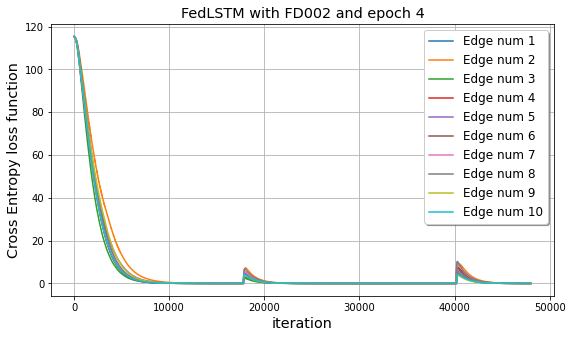

In [37]:
num_workers = 10
iteration_epoch = 3000
epoch = 4
fig, ax = plt.subplots()
fig.set_size_inches(9, 5)
cost_each_worker = np.zeros(shape=(num_workers, 4 * epoch *iteration_epoch))
for worker_i in range(num_workers):
    cost_each_worker[worker_i, :] = np.array(J[worker_i]).flatten()
    plt.plot(cost_each_worker[worker_i, :], label="Edge num " + str(worker_i+1))
plt.title("FedLSTM with FD002 and epoch 4", fontsize="x-large")
plt.ylabel("Cross Entropy loss function", fontsize="x-large")
plt.xlabel("iteration", fontsize="x-large")
plt.grid()
legened = plt.legend(shadow=True, fontsize='large')

dir_logdata_FD002_epoch_4: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD002/Results/epoch_4/"    
plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_logdata_FD002_epoch_4))
plt.savefig('J_FD002_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.eps', format='eps', dpi=1200, bbox_inches='tight')
plt.savefig('J_FD002_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.png', format='png', dpi=1200, bbox_inches='tight')

### Plot test models

C:\Users\alibei\AppData\Local\Temp/ipykernel_10828/1961111407.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig[i], ax[i] = plt.subplots()


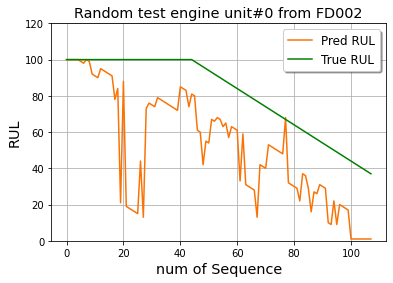

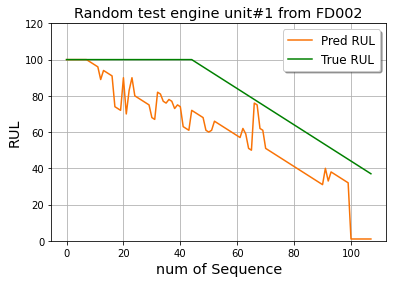

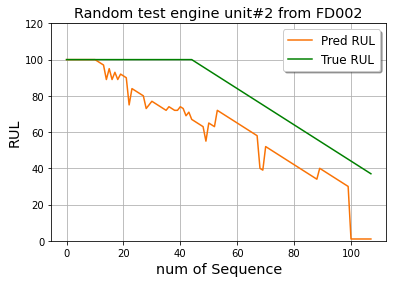

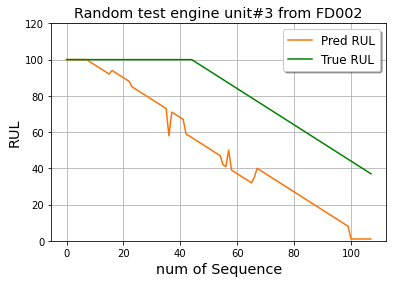

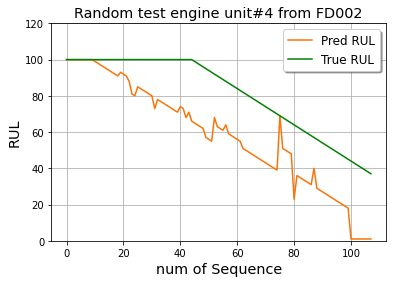

...

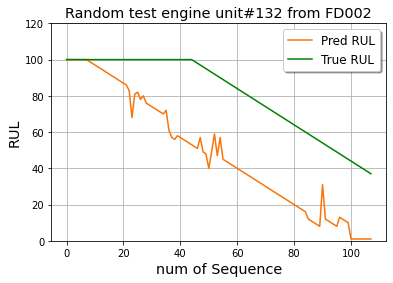

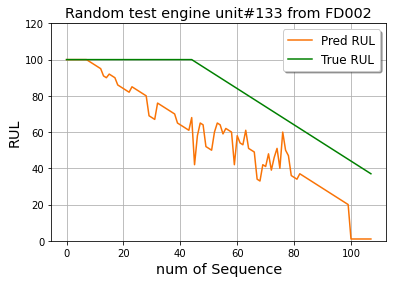

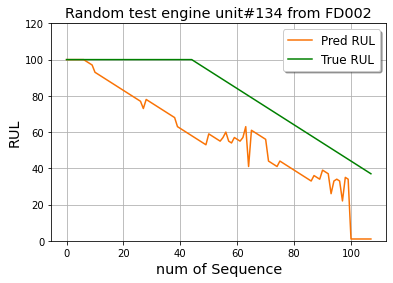

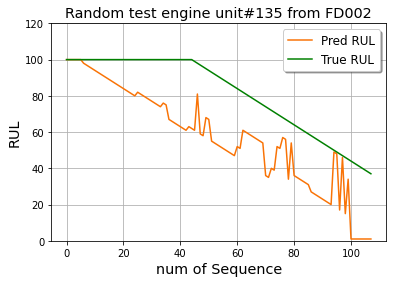

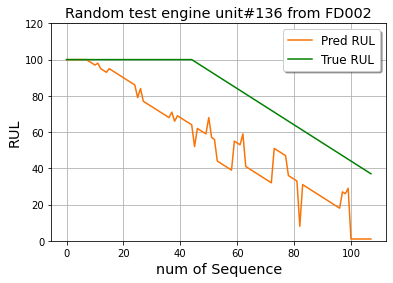

In [38]:
worker_test = LSTM()
fig={}
ax={}
for i in range(len(X_test)):
    Y_hat = worker_test.test_pred(X_test[i], array_params[0])
    fig[i], ax[i] = plt.subplots()
    ax[i].plot(Y_hat, label='Pred RUL', color='#F97306')
    ax[i].plot(Y_test[worker_i], label='True RUL', color='#008000')
    plt.title("Random test engine unit#" + str(i) + " from FD002", fontsize="x-large")
    plt.ylabel("RUL", fontsize="x-large")
    plt.ylim(0, 120)
    plt.xlabel("num of Sequence", fontsize="x-large")
    ax[i].grid()
    ax[i].legend(shadow=True, fontsize='large')
    dir_name: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD002/Results/epoch_4/"
    #plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_name))
    #plt.savefig("RUL_10Workers_Final_Cost_itter_3000_alpha_004_epoch_04"+str(worker_i)+".eps", format='eps', dpi=1200)
    #plt.savefig("RUL_10Workers_Final_Cost_itter_3000_alpha_004_epoch_04"+str(worker_i)+".png", format='png', dpi=1200)

In [39]:
# Save Specific figures
dir_name: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD002/Results/epoch_4/"    
plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_name))
fig[101].savefig("FD002 RUL prediction with FedLSTM and epoch 4 for machine number_" + str(101) + ".eps", format='eps', dpi=1200, bbox_inches='tight')
fig[101].savefig("FD002 RUL prediction with FedLSTM and epoch 4 for machine number_" + str(101) + ".png", format='png', dpi=1200, bbox_inches='tight')


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


### RMSE and SCORE

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[30.9765512]


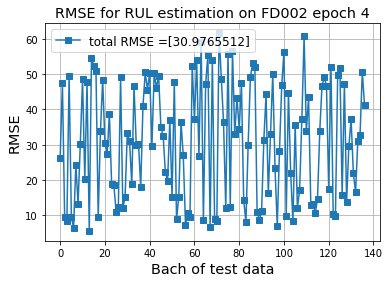

In [40]:
# RMSE and Scoring factor epoch 4
def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())


RMSE = np.zeros(shape=(len(X_test),1))


for worker_i in range(len(X_test)):
    Y_hat = worker_test.test_pred(X_test[worker_i], array_params[0])
    RMSE[worker_i] = rmse(Y_hat, Y_test[worker_i])

fig, ax = plt.subplots()
plt.plot(RMSE, label='RMSE', marker = 's')
plt.title("RMSE for RUL estimation on FD002 epoch 4", fontsize="x-large")
plt.ylabel("RMSE", fontsize="x-large")
plt.xlabel("Bach of test data", fontsize="x-large")
plt.grid()

RMSE_epoch_4 = np.sum(RMSE, axis=0)/len(X_test)
labels = []
labels.append("total RMSE ="+str(RMSE_epoch_4))

plt.legend(labels, loc='best', fontsize='large')


print(RMSE_epoch_4)
plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_name))
plt.savefig("RMSE for RUL estimation FedLSTM on test dataset FD002 epoch 4.eps", format='eps', dpi=1200, bbox_inches='tight')
plt.savefig("RMSE for RUL estimation FedLSTM on test dataset FD002 epoch 4.png", format='png', dpi=1200, bbox_inches='tight')

[-5.11656607e+01 -8.73187518e+01 -1.42891024e+01 -4.19350552e+01
 -8.46141508e+01 -3.12392650e+01 -1.64714896e+01 -7.68308428e+01
  8.47058592e-01 -8.04415674e+01 -8.27492801e+01 -7.43284816e+01
 -8.77185073e+01  1.47380437e+01 -8.56136684e+01 -9.12398987e+01
 -8.66464506e+01 -1.33613497e+01 -8.34507415e+01 -8.35224516e+01
 -8.09934802e+01 -7.85892616e+01  1.40004180e+01 -6.00684146e+01
 -6.61093476e+01  8.23528427e+01 -2.46251201e+01 -8.71928019e+01
  7.65686755e+01 -6.26185226e+01 -8.18355833e+01 -8.08745459e+01
 -4.38697791e+01 -9.18121977e+01 -8.20950400e+01 -8.38542278e+01
 -5.36059858e+01  1.75237034e+03 -8.99878365e+01 -8.58756993e+01
 -8.54365909e+01 -7.40721391e+01 -8.75147658e+01 -8.52048382e+01
 -8.31221766e+01 -8.63015612e+01 -8.35515947e+01 -6.54882966e+01
 -5.81535914e+01 -8.76323915e+01 -2.05268330e+01 -8.66517825e+01
 -1.22656106e+01 -4.23592457e+01 -8.81201042e+01 -8.18801962e+01
  2.61402538e+01 -2.34295044e+00 -2.74588793e+01 -8.75216093e+01
 -8.46494845e+01 -8.70977

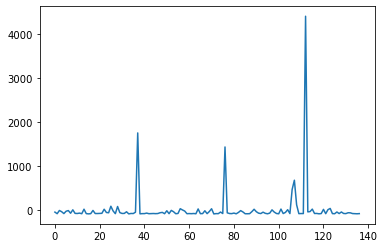

In [41]:
def each_score(predictions, targets):
    tmp = np.zeros(shape=(1, len(predictions)))
    for i in range(len(predictions)):
        Yi = predictions[i] - targets[i]
        if Yi >= 0:
            tmp[:, i] = (np.exp(Yi/10)-1)   
        else:
            tmp[:, i] = np.exp(Yi/13)-1
    return tmp
    
SCORE = np.zeros(shape=(len(X_test), X_test[0].shape[0]))

for worker_i in range(len(X_test)):
    Y_hat = worker_test.test_pred(X_test[worker_i], array_params[0])
    SCORE[worker_i, :] = each_score(Y_hat, Y_test[worker_i])
    
print(np.sum(SCORE, axis=1))
plt.plot(np.sum(SCORE, axis=1))
print("Final value for SCORE:",np.sum(SCORE)/len(X_test))

## Load Cost functions and Parameters

In [101]:
import numpy as np
import pickle
# from model import *

# Import libraries
from random import uniform
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

import time
import math
import sys
import random

dir_logdata_FD002_epoch_4: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD002/LogData/epoch_4/ "    
# Load cost from a PKL file
a_file = open(dir_logdata_FD002_epoch_4 + "J_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.pkl", "rb")
J = pickle.load(a_file)
a_file.close()

# Load params data from a PKL file
a_file = open(dir_logdata_FD002_epoch_4 + "array_params_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.pkl", "rb")
array_params = pickle.load(a_file)
print(array_params)
a_file.close()

[{'Wf': array([[-0.18564977,  0.0322141 , -0.04818845, ..., -0.12048841,
         0.09804777,  0.05325   ],
       [-0.06109197,  0.09811411, -0.04168961, ...,  0.08114126,
         0.08047905,  0.05512676],
       [-0.12158022, -0.13627538, -0.17668155, ..., -0.20193493,
         0.20272957,  0.12999881],
       ...,
       [ 0.01255876,  0.16984161,  0.03624951, ..., -0.08108413,
         0.04121908,  0.00478767],
       [ 0.02036318,  0.06390896, -0.02934949, ...,  0.06846599,
         0.09238949,  0.08252651],
       [ 0.04791726,  0.01360442, -0.01159031, ...,  0.07645322,
         0.05202115,  0.05020851]]), 'bf': array([[1.05032015],
       [1.08373612],
       [1.08920687],
       [1.02828693],
       [1.0825476 ],
       [1.14573225],
       [1.04020056],
       [1.06803859],
       [1.07327751],
       [1.0113719 ],
       [1.0307025 ],
       [1.02641318],
       [1.07471422],
       [1.07047969],
       [1.10095669],
       [1.0111647 ],
       [1.06367949],
       [1.00765